<a href="https://colab.research.google.com/github/NadezhdaMalysheva/projects/blob/main/Plots_%2B_big_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Подгружаем необходимые библиотеки 

In [ ]:
pip install pytorch-tabnet

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

import plotly.offline as py
color = sns.color_palette()
import plotly.graph_objs as go
py.init_notebook_mode(connected=True)
import plotly.tools as tls

%matplotlib inline

In [ ]:
from sklearn.preprocessing import RobustScaler
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score, roc_auc_score 
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
import joblib
from tqdm.notebook import tqdm

from pytorch_tabnet.tab_model import TabNetClassifier

from hyperopt import hp
import numpy as np
from sklearn.metrics import mean_squared_error, f1_score, accuracy_score

from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import KFold
from lightgbm import LGBMClassifier

import lightgbm as lgb
from hyperopt import fmin, tpe, STATUS_OK, STATUS_FAIL, Trials

from time import time

In [ ]:
import torch

#Загружаем данные, параметры

In [ ]:
def data_preparation(X, y, c=10000, test_size = 0.8):

    X1_train, X1_test, y1_train, y1_test = train_test_split(X[y==1], y[y==1], test_size=test_size, random_state = 43)
    X2_train, X2_test, y2_train, y2_test = train_test_split(X[y==2], y[y==2], test_size=test_size, random_state = 43)
    X3_train, X3_test, y3_train, y3_test = train_test_split(X[y==3], y[y==3], test_size=test_size, random_state = 43)
    
    count = c
    count1 = c

    X_train, X_test = np.concatenate((X1_train[:count], X2_train[:count], X3_train[:count])), np.concatenate((X1_test[:count1], X2_test[:count1], X3_test[:count1]))
    y_train, y_test = np.concatenate((y1_train[:count], y2_train[:count], y3_train[:count])), np.concatenate((y1_test[:count1], y2_test[:count1], y3_test[:count1]))

    data = np.concatenate((X_train, y_train.reshape((len(y_train), 1))), axis=1)
    np.random.shuffle(data)

    datat = np.concatenate((X_test, y_test.reshape((len(y_test), 1))), axis=1)
    np.random.shuffle(datat)
    

    return data, datat

# Разделение данных

In [ ]:
pip install -q pandas==0.25.3

In [ ]:
!pip install -q scikit-learn==0.22.1

     |████████████████████████████████| 7.0MB 4.5MB/s 


In [ ]:
!pip install -q pandas==1.1.5

In [ ]:
import pickle

In [ ]:
pickle.format_version

'4.0'

In [ ]:
!pip freeze

In [ ]:
df_path = '/content/drive/MyDrive/Научная работа/Data/X-ray/x-ray_data.gz_pkl'

In [ ]:
#with gzip.open(add_data_path, 'rb') as fd:
df = pd.read_pickle(df_path, compression='gzip')

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Научная работа/Data/X-ray/x-ray_data.csv', low_memory=False)

In [ ]:
df 

,nrow,ra_x,dec_x,__workxid__,ls_sep_input,ls_release,ls_brickid,ls_brickname,ls_objid,ls_brick_primary,ls_brightblob,ls_maskbits,ls_type,ls_ra,ls_dec,ls_ra_ivar,ls_dec_ivar,ls_bx,ls_by,ls_ebv,ls_mjd_min,ls_mjd_max,ls_ref_cat,ls_ref_id,ls_pmra,ls_pmdec,ls_parallax,ls_pmra_ivar,ls_pmdec_ivar,ls_parallax_ivar,ls_ref_epoch,ls_gaia_pointsource,ls_gaia_phot_g_mean_mag,ls_gaia_phot_g_mean_flux_over_error,ls_gaia_phot_g_n_obs,ls_gaia_phot_bp_mean_mag,ls_gaia_phot_bp_mean_flux_over_error,ls_gaia_phot_bp_n_obs,ls_gaia_phot_rp_mean_mag,ls_gaia_phot_rp_mean_flux_over_error,...,r,i,z,Lw1,Lw2,uM,gM,rM,iM,zM,LabelQ,LabelG,LabelS,Label,DetmlFx,TOPC,TNOX,TNXC,sep,LabelX,ra_epoch2000,dec_epoch2000,angDist,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,phot_g_mean_flux,phot_g_mean_flux_error,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_rp_mean_flux,phot_rp_mean_flux_error,radial_velocity,radial_velocity_error,prlx_sn,pmra_sn,pmdec_sn
0,1,120.629122,0.892014,0,0.142104,8000.0,336610.0,b'1206p010',336.0,True,0.0,0.0,b'DEV ',120.629148,0.892045,3.322608e+10,2.780454e+10,1742.51750,316.14444,0.043566,57021.283605,57449.065389,b' ',0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,False,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,21.624750,21.368340,20.566050,16.006990,15.336110,23.144690,21.572650,21.547080,21.029330,20.352050,1,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,241.254494,1.110543,1,0.006765,8000.0,337093.0,b'2413p010',4915.0,True,0.0,0.0,b'PSF ',241.254496,1.110542,1.500288e+14,2.591807e+14,3454.98120,3318.43260,0.140722,57445.317920,58369.032981,b'G2',4.411588e+18,2.228307,-0.350395,0.001212,2.547616,5.421466,7.153723,2015.5,True,19.237125,220.398680,230.0,19.379955,27.951532,24.0,18.786053,22.559723,...,19.534040,19.275440,19.201570,15.957020,14.485360,19.897330,19.644880,19.539890,19.258670,19.167390,1,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,197.494598,-1.191194,2,0.005828,8000.0,323957.0,b'1973m012',3162.0,True,0.0,0.0,b'PSF ',197.494596,-1.191193,2.424511e+13,4.985677e+13,156.54692,2607.49930,0.024487,57109.235169,58520.329720,b'G2',3.685856e+18,-1.754252,0.456079,-1.311094,0.322284,1.058664,1.296831,2015.5,True,20.201880,85.368576,176.0,20.328226,13.567971,17.0,19.631844,10.582335,...,19.653400,19.658320,19.546620,17.388410,17.271420,21.159570,19.840930,19.643430,19.626490,19.486100,1,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,197.599616,-1.115184,3,0.004966,8000.0,325398.0,b'1976m010',186.0,True,0.0,0.0,b'PSF ',197.599618,-1.115184,1.852787e+11,1.052537e+12,2148.20000,216.81828,0.026042,57111.198570,58520.329720,b'G2',3.685881e+18,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.5,True,20.820070,57.001003,96.0,20.932774,7.106303,11.0,20.546469,8.927887,...,20.698120,20.625490,20.236160,19.208540,17.278020,21.551680,20.910680,20.696630,20.630190,20.136180,1,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,197.774153,-1.193348,4,0.029734,8000.0,323959.0,b'1978m012',4291.0,True,0.0,0.0,b'PSF ',197.774160,-1.193343,1.369982e+11,1.385202e+11,3184.79400,2577.97340,0.026154,57109.235169,57814.295417,b' ',0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,False,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,21.340720,21.406030,21.016010,17.511850,16.132350,21.767080,21.316630,21.316710,21.282550,20.892140,1,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

In [ ]:
df.to_csv('/content/drive/MyDrive/Научная работа/Data/X-ray/x-ray_data.csv', index=False)

In [ ]:
df.to_pickle('/content/drive/MyDrive/Научная работа/Data/X-ray/x-ray_data.gz_pkl',
                                    compression='gzip', protocol=4)

In [ ]:
features_path = '/content/drive/MyDrive/Научная работа/Data/features_sdssdr16+psdr2+all_deacls8tr_QSO+GALAXY_20201212133711.pkl'

In [ ]:
column = 'sdssdr16_r_cmodel'

In [ ]:
features = pd.read_pickle(features_path)

In [ ]:
sdss = [i for i in features if 'sdss' in i and 'decals' not in i and column not in i] 

In [ ]:
decals = [i for i in features if 'decals' in i and 'sdss' not in i and 'psdr' not in i and column not in i] 

In [ ]:
wise = [i for i in decals if 'Lw' in i and column not in i] 

In [ ]:
ps = [i for i in features if 'psdr' in i and 'decals' not in i and column not in i] 

In [ ]:
label = ['LabelQ', 'LabelG', 'LabelS', 'Label']

In [ ]:
f = {"sdssdr16+wise_decals8tr": sdss+wise,
     "psdr2+wise_decals8tr": ps+wise,
     "sdssdr16+all_decals8tr": sdss+decals,
     "psdr2+all_decals8tr": ps+decals,
     "decals8tr": decals,
     "sdssdr16+psdr2+wise_decals8tr": sdss+ps+wise,
     "sdssdr16+psdr2+all_decals8tr": sdss+ps+decals}

In [ ]:
f1 = {"sdssdr16+wise_decals8tr": sdss+wise,
     "psdr2+wise_decals8tr": ps+wise,
     "sdssdr16+all_decals8tr": sdss+decals,
     "psdr2+all_decals8tr": ps+decals,
     "sdssdr16": sdss,#"decals8tr": decals,
     "sdssdr16+psdr2+wise_decals8tr": sdss+ps+wise,
     "sdssdr16+psdr2+all_decals8tr": sdss+ps+decals}

In [ ]:
f = {"sdssdr16": sdss,
     "psdr2": ps,
     "decals8tr": decals,
     "sdssdr16+psdr2+all_decals8tr": sdss+ps+decals}

In [ ]:
df

,nrow,ra_x,dec_x,__workxid__,ls_sep_input,ls_release,ls_brickid,ls_brickname,ls_objid,ls_brick_primary,ls_brightblob,ls_maskbits,ls_type,ls_ra,ls_dec,ls_ra_ivar,ls_dec_ivar,ls_bx,ls_by,ls_ebv,ls_mjd_min,ls_mjd_max,ls_ref_cat,ls_ref_id,ls_pmra,ls_pmdec,ls_parallax,ls_pmra_ivar,ls_pmdec_ivar,ls_parallax_ivar,ls_ref_epoch,ls_gaia_pointsource,ls_gaia_phot_g_mean_mag,ls_gaia_phot_g_mean_flux_over_error,ls_gaia_phot_g_n_obs,ls_gaia_phot_bp_mean_mag,ls_gaia_phot_bp_mean_flux_over_error,ls_gaia_phot_bp_n_obs,ls_gaia_phot_rp_mean_mag,ls_gaia_phot_rp_mean_flux_over_error,...,r,i,z,Lw1,Lw2,uM,gM,rM,iM,zM,LabelQ,LabelG,LabelS,Label,DetmlFx,TOPC,TNOX,TNXC,sep,LabelX,ra_epoch2000,dec_epoch2000,angDist,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,phot_g_mean_flux,phot_g_mean_flux_error,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_rp_mean_flux,phot_rp_mean_flux_error,radial_velocity,radial_velocity_error,prlx_sn,pmra_sn,pmdec_sn
0,1,120.629122,0.892014,0,0.142104,8000.0,336610.0,b'1206p010',336.0,True,0.0,0.0,b'DEV ',120.629148,0.892045,3.322608e+10,2.780454e+10,1742.51750,316.14444,0.043566,57021.283605,57449.065389,b' ',0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,False,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,21.624750,21.368340,20.566050,16.006990,15.336110,23.144690,21.572650,21.547080,21.029330,20.352050,1,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,241.254494,1.110543,1,0.006765,8000.0,337093.0,b'2413p010',4915.0,True,0.0,0.0,b'PSF ',241.254496,1.110542,1.500288e+14,2.591807e+14,3454.98120,3318.43260,0.140722,57445.317920,58369.032981,b'G2',4.411588e+18,2.228307,-0.350395,0.001212,2.547616,5.421466,7.153723,2015.5,True,19.237125,220.398680,230.0,19.379955,27.951532,24.0,18.786053,22.559723,...,19.534040,19.275440,19.201570,15.957020,14.485360,19.897330,19.644880,19.539890,19.258670,19.167390,1,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,197.494598,-1.191194,2,0.005828,8000.0,323957.0,b'1973m012',3162.0,True,0.0,0.0,b'PSF ',197.494596,-1.191193,2.424511e+13,4.985677e+13,156.54692,2607.49930,0.024487,57109.235169,58520.329720,b'G2',3.685856e+18,-1.754252,0.456079,-1.311094,0.322284,1.058664,1.296831,2015.5,True,20.201880,85.368576,176.0,20.328226,13.567971,17.0,19.631844,10.582335,...,19.653400,19.658320,19.546620,17.388410,17.271420,21.159570,19.840930,19.643430,19.626490,19.486100,1,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,197.599616,-1.115184,3,0.004966,8000.0,325398.0,b'1976m010',186.0,True,0.0,0.0,b'PSF ',197.599618,-1.115184,1.852787e+11,1.052537e+12,2148.20000,216.81828,0.026042,57111.198570,58520.329720,b'G2',3.685881e+18,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2015.5,True,20.820070,57.001003,96.0,20.932774,7.106303,11.0,20.546469,8.927887,...,20.698120,20.625490,20.236160,19.208540,17.278020,21.551680,20.910680,20.696630,20.630190,20.136180,1,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,197.774153,-1.193348,4,0.029734,8000.0,323959.0,b'1978m012',4291.0,True,0.0,0.0,b'PSF ',197.774160,-1.193343,1.369982e+11,1.385202e+11,3184.79400,2577.97340,0.026154,57109.235169,57814.295417,b' ',0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,False,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000,...,21.340720,21.406030,21.016010,17.511850,16.132350,21.767080,21.316630,21.316710,21.282550,20.892140,1,0,0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,..

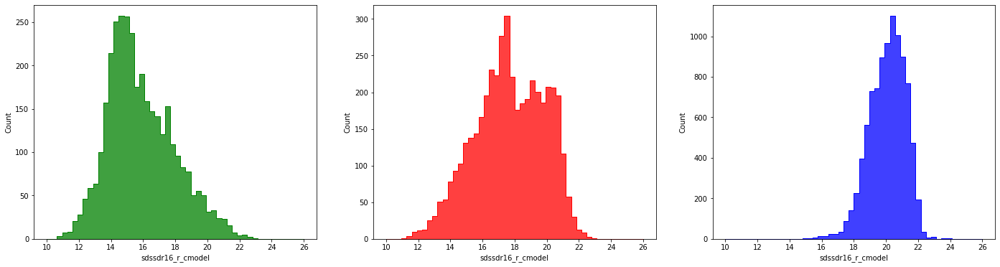

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(ncols = 3, figsize = (24, 6))
sns.histplot(df[df['Label']==0]['sdssdr16_r_cmodel'], ax = ax1, bins = 50, color = 'g', element="step", binrange=(10, 26))
sns.histplot(df[df['Label']==2]['sdssdr16_r_cmodel'], ax = ax2, bins = 50, color = 'r', element="step", binrange=(10, 26))
sns.histplot(df[df['Label']==1]['sdssdr16_r_cmodel'], ax = ax3, bins = 50, color = 'b', element="step", binrange=(10, 26))

In [ ]:
df = df.drop(['class'], axis=1)

In [ ]:
np.sum(df['Label'] == 0)

5917

In [ ]:
  df1 = df.sort_values(column)
  df1 = df1.rename(columns={'Label':'class'})
  df_s = df1[df1['class']==0].copy()
  df_q = df1[df1['class']==1].copy()
  df_g = df1[df1['class']==2].copy()
  df_s['class'] = 1
  df_q['class'] = 2
  df_g['class'] = 3

In [ ]:
df_s

,nrow,ra_x,dec_x,__workxid__,ls_sep_input,ls_release,ls_brickid,ls_brickname,ls_objid,ls_brick_primary,ls_brightblob,ls_maskbits,ls_type,ls_ra,ls_dec,ls_ra_ivar,ls_dec_ivar,ls_bx,ls_by,ls_ebv,ls_mjd_min,ls_mjd_max,ls_ref_cat,ls_ref_id,ls_pmra,ls_pmdec,ls_parallax,ls_pmra_ivar,ls_pmdec_ivar,ls_parallax_ivar,ls_ref_epoch,ls_gaia_pointsource,ls_gaia_phot_g_mean_mag,ls_gaia_phot_g_mean_flux_over_error,ls_gaia_phot_g_n_obs,ls_gaia_phot_bp_mean_mag,ls_gaia_phot_bp_mean_flux_over_error,ls_gaia_phot_bp_n_obs,ls_gaia_phot_rp_mean_mag,ls_gaia_phot_rp_mean_flux_over_error,...,r,i,z,Lw1,Lw2,uM,gM,rM,iM,zM,LabelQ,LabelG,LabelS,class,DetmlFx,TOPC,TNOX,TNXC,sep,LabelX,ra_epoch2000,dec_epoch2000,angDist,parallax,parallax_error,pmra,pmra_error,pmdec,pmdec_error,phot_g_mean_flux,phot_g_mean_flux_error,phot_bp_mean_flux,phot_bp_mean_flux_error,phot_rp_mean_flux,phot_rp_mean_flux_error,radial_velocity,radial_velocity_error,prlx_sn,pmra_sn,pmdec_sn
18664,18631,178.993424,56.598590,18630,0.180441,8001.0,606832.0,b'1788p565',2958.0,True,3.0,2974.0,b'PSF ',178.993474,56.598548,5.421582e+15,4.708076e+15,882.01970,3154.40840,0.015095,57510.209268,58198.440973,b'G2',8.420673e+17,8.771823,-2.094170,10.364864,94.335686,101.214300,207.10233,2015.5,True,5.505061,1008.2453,387.0,6.100591,530.701900,33.0,4.851686,360.996920,...,13.164299,9.460563,5.662354,4.095356,3.336270,11.420404,10.548382,9.891585,8.178543,8.566662,0,0,2,1,428.7240,True,False,False,0.341257,1.0,178.993405,56.598557,0.124281,10.3649,0.0695,8.772,0.103,-2.094,0.099,1.183920e+08,117424.00000,5.015550e+07,94507.90000,9.206480e+07,255029.00000,16.89,0.16,149.135252,85.165049,21.151515
16688,16659,133.915623,20.005406,16658,0.079198,8000.0,443908.0,b'1339p200',1884.0,True,3.0,3070.0,b'PSF ',133.915600,20.005413,1.029993e+16,2.462067e+16,2089.39670,1873.89510,0.026477,57020.301819,58548.086126,b'G2',6.608054e+17,-9.921539,-12.831683,1.868282,191.949800,322.571440,811.01150,2015.5,True,12.431357,1050.3170,461.0,12.327800,8.833282,2.0,11.256525,2.861605,...,24.802124,24.361698,14.057153,8.319486,8.481623,14.344273,25.114374,24.802023,24.361797,13.744856,0,0,2,1,902.0670,True,False,False,0.337464,1.0,133.915646,20.005468,0.236155,1.8683,0.0351,-9.922,0.072,-12.832,0.056,2.008180e+05,191.19800,1.619700e+05,18336.40000,2.524400e+05,88216.20000,NaN,NaN,53.227920,137.805556,229.142857
19538,19503,117.860694,29.167979,19502,0.212699,8000.0,492327.0,b'1177p292',591.0,True,3.0,3070.0,b'PSF ',117.860751,29.168011,4.037672e+14,5.065932e+14,570.83850,673.46810,0.042196,57019.222226,58486.179467,b'G2',8.758837e+17,-4.560003,3.211374,5.112486,6.997514,10.281527,26.15349,2015.5,True,6.781865,4284.1626,250.0,7.234904,918.003500,26.0,6.211653,539.000600,...,10.961557,14.984198,6.865325,7.395157,5.378258,12.207212,11.310648,10.851232,10.514380,9.405479,0,0,2,1,254.4390,True,False,False,1.342085,1.0,117.860774,29.167997,0.257688,5.1125,0.1955,-4.560,0.378,3.211,0.312,3.652580e+07,8525.78000,1.764390e+07,19219.80000,2.630920e+07,48811.00000,-7.67,2.43,26.150895,12.063492,10.291667
15585,15560,253.542033,15.623475,15559,0.509605,8000.0,421035.0,b'2535p157',301.0,False,3.0,3071.0,b'PSF ',253.541908,15.623400,3.488312e+16,3.291129e+16,1645.35100,59.96169,0.082266,57109.394502,57876.389549,b'G2',4.557861e+18,-16.443125,-12.314400,7.180388,649.559300,657.131350,868.83480,2015.5,True,7.071832,7102.7905,556.0,7.338014,1776.471700,60.0,6.693355,1465.233500,...,7.342437,10.570884,7.749278,6.722181,5.987696,11.488871,11.476745,10.869134,10.318541,10.389976,0,0,2,1,58.9956,True,False,False,1.466961,1.0,253.541982,15.623453,0.194383,7.1804,0.0339,-16.443,0.039,-12.314,0.039,2.796490e+07,3937.17000,1.604540e+07,9032.16000,1.688210e+07,11521.80000,-27.17,0.62,211.811209,421.615385,315.743590
18871,18838,28.374759,12.682480,18837,0.983985,8000.0,403392.0,b'0282p127',607.0,True,3.0,3070.0,b'PSF ',28.374636,12.682234,6.513103e+15,7.187913e+15,705.55365,868.54050,0.052677,57306.358421,58433.199767,b'G2',2.575553e+18,-20.960503,-37.04

In [ ]:
df1 = pd.concat((df_s[::2], df_q[::2], df_g[::2]), axis=0)
df2 = pd.concat((df_s[1::2], df_q[1::2], df_g[1::2]), axis=0)

In [ ]:
df1.shape, df2.shape
df1.to_pickle('/content/drive/MyDrive/Научная работа/Data/X-ray/cv0.gz_pkl', compression='gzip')
df2.to_pickle('/content/drive/MyDrive/Научная работа/Data/X-ray/cv1.gz_pkl', compression='gzip')

In [ ]:
def data_split(df_all, column='sdssdr16_r_cmodel', label='Label', balance=True):
  df = df_all.sort_values(column)
  def split(df_loc, c=9000):
    data = df_loc.drop(['LabelQ', 'LabelG', 'LabelS', 'Label'], axis = 1).values
    data1 = data[::2]
    data2 = data[1::2]
    np.random.shuffle(data1)
    np.random.shuffle(data2)
    return data1[:c//2], data2[:c//2]

  def train_test(X1, X2, X3, test_size=0.1):
    X1_train, X1_test, y1_train, y1_test = train_test_split(X1, 1*np.ones([len(X1), 1]), test_size=test_size, random_state = 43)
    X2_train, X2_test, y2_train, y2_test = train_test_split(X2, 2*np.ones([len(X2), 1]), test_size=test_size, random_state = 43)
    X3_train, X3_test, y3_train, y3_test = train_test_split(X3, 3*np.ones([len(X3), 1]), test_size=test_size, random_state = 43)

    X_train, X_test = np.concatenate((X1_train, X2_train, X3_train)), np.concatenate((X1_test, X2_test, X3_test))
    y_train, y_test = np.concatenate((y1_train, y2_train, y3_train)), np.concatenate((y1_test, y2_test, y3_test))
        
    train = np.concatenate((X_train, y_train.rashape((len(X_train), 1))))
    test = np.concatenate((X_test, y_test.rashape((len(X_test), 1))))

    return train, test
    
  df_s = df[df[label]==0]
  df_q = df[df[label]==1]
  df_g = df[df[label]==2]

  if balance:
    c = len(df_g)#np.min((len(df_s), len(df_q), len(df_g)))

  else:
    c = 17000



  X1_s , X2_s = split(df_s, c)
  X1_q , X2_q = split(df_q, c)
  X1_g , X2_g = split(df_g, c)


  X1 = np.concatenate((np.concatenate((X1_s, 1*np.ones([len(X1_s), 1])), axis=1),
                       np.concatenate((X1_q, 2*np.ones([len(X1_q), 1])), axis=1),
                       np.concatenate((X1_g, 3*np.ones([len(X1_g), 1])), axis=1)),
                      axis=0)
  X2 = np.concatenate((np.concatenate((X2_s, 1*np.ones([len(X2_s), 1])), axis=1),
                       np.concatenate((X2_q, 2*np.ones([len(X2_q), 1])), axis=1),
                       np.concatenate((X2_g, 3*np.ones([len(X2_g), 1])), axis=1)),
                      axis=0)
  
  np.random.shuffle(X1)
  np.random.shuffle(X2)

  return X1, X2#train1, train2, test1, test2

In [ ]:
def data_open(path, features):
    classes = {'STAR': 1, 'QSO':2, 'GALAXY':3}
    with gzip.open(path, 'rb') as f:
      df = pickle.load(f)
    df = df[features + ['class']].dropna()
    X = df[features].values
    y = df.replace({'class':classes}, inplace = True)['class'].values
    return X, y

In [ ]:
def scor(y_test, y_pred):
  return accuracy_score(y_test, y_pred)

lgb_reg_params = {
    'min_child_samples':hp.randint('min_child_samples', 50)+1,
    'colsample_bytree': hp.uniform('colsample_bytree', 0.1, 0.9),
    'num_leaves' :      hp.randint('num_leaves', 100)+10,
    'min_child_weight': hp.uniform('min_child_weight', 0.001, 0.99),
    'n_estimators':     1000
}
lgb_fit_params = {
    'early_stopping_rounds': 50,
    'verbose': False
}
lgb_para = dict()
lgb_para['reg_params'] = lgb_reg_params
lgb_para['fit_params'] = lgb_fit_params
lgb_para['score'] = lambda y, pred: -accuracy_score(y, pred)


rf_reg_params = {
    'min_samples_leaf': hp.randint('min_samples_leaf', 20)+1,
    'min_samples_split':hp.uniform('min_samples_split', 0.001, 0.1),
    #'max_features':     hp.choice('max_features', ['auto', 'sqrt', 'log2', None]),
    #'learning_rate':    hp.uniform('learning_rate', 0.001, 0.1),
    'n_estimators':     hp.randint('n_estimators', 800)+100
}
rf_fit_params = {
}
rf_para = dict()
rf_para['reg_params'] = rf_reg_params
rf_para['fit_params'] = rf_fit_params
rf_para['score'] = lambda y, pred: -accuracy_score(y, pred)

tabnet_reg_params = {
    'n_d' :              8,
    'n_a' :              8,
    'n_shared':          hp.randint('n_shared', 3)+1,
    'n_independent':     hp.randint('n_independent', 3)+1,
    'n_steps' :          hp.randint('n_steps', 3)+3,
    'gamma' :            hp.uniform('gamma', 1.0, 3.0),
    'lambda_sparse' :    hp.uniform('lambda_sparse', 0.0, 0.01),
    'optimizer_params' : dict(lr=2e-2),
    'scheduler_params' : {"step_size":200, "gamma":0.95},
    'scheduler_fn' :     torch.optim.lr_scheduler.StepLR,
    'mask_type' :       'entmax'
}

tabnet_fit_params = {
    'max_epochs' : 2000, 
    'patience' : 20,
    'batch_size' : 1024,
    'virtual_batch_size' : 128,
    'num_workers' : 0,
    'weights' : 1,
    'drop_last' : False,
    #'from_unsupervised' : unsupervised_model
}
tabnet_para = dict()
tabnet_para['reg_params'] = tabnet_reg_params
tabnet_para['fit_params'] = tabnet_fit_params
tabnet_para['score'] = lambda y, pred: -accuracy_score(y, pred)

In [ ]:
class HPOpt(object):

    def __init__(self, X, y, cv=3):
        self.X = X
        self.y = y
        self.cv = cv
        #print('init')

    def process(self, fn_name, space, trials, algo, max_evals):
        #print('in process')
        fn = getattr(self, fn_name)
        try:
            #print('try')
            result = fmin(fn=fn, space=space, algo=algo, max_evals=max_evals, trials=trials)
            #print('i can')
        except Exception as e:
            print({'status': STATUS_FAIL,
                    'exception': str(e)})
            return {'status': STATUS_FAIL,
                    'exception': str(e)}
        return result, trials

    def rf_reg(self, para):
        reg = RandomForestClassifier(**para['reg_params'])
        return self.train_reg(reg, para)

    def lgb_reg(self, para):
        reg = lgb.LGBMClassifier(**para['reg_params'])
        if self.cv>1:
          return self.train_cv(reg, para)
        return self.train_reg(reg, para)

    def tabnet_reg(self, para):
        #print('class')
        reg = TabNetClassifier(**para['reg_params'])
        #print('end class')
        if self.cv>1:
          return self.train_cv(reg, para)
        return self.train_reg(reg, para)


    def train_reg(self, reg, para):
        if len(para['fit_params'])>0:
            #print('start')
            reg.fit(self.X, self.y,
                  eval_set=[(self.X, self.y), (self.X, self.y)],
                  **para['fit_params'])
        else:
            reg.fit(self.X, self.y)
        pred = reg.predict(self.X)
        loss = para['score'](self.y, pred)
        return {'loss': loss, 'status': STATUS_OK}

    def train_cv(self, reg, para):
        kf = KFold(n_splits=self.cv, shuffle=False)
        loss = 0 
        for train, test in kf.split(self.X):
            #print('start', type(train[0]), type(test[0]), type(self.y[0]), type(self.X))
            if len(para['fit_params'])>0:
                reg.fit(self.X[train], self.y[train],
                      eval_set=[(self.X[train], self.y[train]), (self.X[test], self.y[test])],
                      **para['fit_params'])
            else:
                reg.fit(self.X[train], self.y[train])
            #print('pred')
            pred = reg.predict(self.X[test])
            score = para['score'](self.y[test], pred)
            loss += score

        loss=loss/self.cv
        return {'loss': loss, 'status': STATUS_OK}


In [ ]:
acc = pd.DataFrame(index=['acc'])

In [ ]:
#acc

# Получение моделей на всей выборке 

## На рентгеновском датасете

In [ ]:
import joblib
for overview in f.keys():
  print(overview)
  if 'sdss' in overview:
    column = 'sdssdr16_r_psf'
  elif 'psdr' in overview:
    column='psdr2_r_psf'
  else:
    column='decals8tr_r'
  data1, data2 = data_split(df[f[overview]+label].dropna(), column=column, balance=False)
  X1, y1 = data1[:,:-1], data1[:,-1].astype('int')
  X2, y2 = data2[:,:-1], data2[:,-1].astype('int')
  X = np.concatenate((X1, X2))
  y = np.concatenate((y1, y2))
  robust = RobustScaler()

  X_train_norm = robust.fit_transform(X)
  X_test_norm = robust.transform(X)
  y_train = y
  y_test = y

  obj = HPOpt(X_train_norm, y_train, cv=3)
  lgb_opt = obj.process(fn_name='lgb_reg', space=lgb_para, trials=Trials(), algo=tpe.suggest, max_evals=50)
  print(lgb_opt)
  gb = lgb.LGBMClassifier( 
                            **{'colsample_bytree': lgb_opt[0]['colsample_bytree'],
                              'min_child_samples': lgb_opt[0]['min_child_samples']+1,
                              'min_child_weight': lgb_opt[0]['min_child_weight'],
                              'num_leaves': lgb_opt[0]['num_leaves']+10,
                              'n_estimators': 1000
                              }
                          )
  t = time()
  gb.fit(X_train_norm[:-500], y_train[:-500], eval_set=[(X_train_norm[:-500], y_train[:-500]), (X_train_norm[-500:], y_train[-500:])],  **lgb_fit_params)
  print(time()-t)
  gb_test_acc = accuracy_score(y_test[-500:], gb.predict(X_test_norm[-500:]))
  acc[overview] = gb_test_acc
  joblib.dump(gb, '/content/drive/MyDrive/Научная работа/Data/X-ray/gb/model_'+overview+'.pkl')
  joblib.dump(f[overview], '/content/drive/MyDrive/Научная работа/Data/X-ray/gb/features_'+overview+'.pkl')
  joblib.dump(robust, '/content/drive/MyDrive/Научная работа/Data/X-ray/gb/'+overview+'_robust_for_gb.pkl')


In [ ]:
acc

In [ ]:
import joblib
for overview in f.keys():
   column = 'sdssdr16_r_cmodel'

  data1, data2 = data_split(df[f[overview]+label].dropna(), column=column, balance=False)
  X1, y1 = data1[:,:-1], data1[:,-1].astype('int')
  X2, y2 = data2[:,:-1], data2[:,-1].astype('int')
  X_train = X_test = np.concatenate((X1, X2))
  y_train = y_test = np.concatenate((y1, y2)).astype('int')
  

  obj = HPOpt(X_train, y_train, cv=2)
  tn_opt = obj.process(fn_name='tabnet_reg', space=tabnet_para, trials=Trials(), algo=tpe.suggest, max_evals=5)
  print(tn_opt)
  tn = TabNetClassifier( 
                         **{'n_d' :              8,
                            'n_a' :              8,
                            'n_shared':          tn_opt[0]['n_shared']+1,
                            'n_independent':     tn_opt[0]['n_independent']+1,
                            'n_steps' :          tn_opt[0]['n_steps']+3,
                            'gamma' :            tn_opt[0]['gamma'],
                            'lambda_sparse' :    tn_opt[0]['lambda_sparse'],
                            'optimizer_params' : dict(lr=2e-2),
                            'scheduler_params' : {"step_size":200, "gamma":0.95},
                            'scheduler_fn' :     torch.optim.lr_scheduler.StepLR,
                            'mask_type' :       'entmax'}
                          )
  t = time()
  tn.fit(X_train[:-500], y_train[:-500], eval_set=[(X_train[:-500], y_train[:-500]), (X_train[-500:], y_train[-500:])],  **tabnet_fit_params)
  print(time()-t)
  tn_test_acc = accuracy_score(y_test[-500:], tn.predict(X_test[-500:]))
  print(tn_test_acc)
  joblib.dump(tn, '/content/drive/MyDrive/Научная работа/Data/X-ray/tn/model_'+overview+'.pkl')
  joblib.dump(f[overview], '/content/drive/MyDrive/Научная работа/Data/X-ray/gb/features_'+overview+'.pkl')

## На большом датасете

In [ ]:
column = 'sdssdr16_r_cmodel'

In [ ]:
import gzip
import pickle
classes = {'STAR': 1, 'QSO':2, 'GALAXY':3}


path = '/content/drive/MyDrive/Научная работа/Data/Main/data/cv0_0/cv0.gz_pkl'
with gzip.open(path, 'rb') as fin:
    df1 = pickle.load(fin)
    df1 = df1[[column] + features + ['class']].dropna()

path = '/content/drive/MyDrive/Научная работа/Data/Main/data/cv0_1/cv1.gz_pkl'
with gzip.open(path, 'rb') as fin:
    df2 = pickle.load(fin)
    df2= df2[[column] + features + ['class']].dropna()

In [ ]:
df1.replace({'class':classes}, inplace = True)
df2.replace({'class':classes}, inplace = True)

In [ ]:
for overview in f.keys():
  X1, y1 = df1[f[overview]].values, df1['class'].values #.replace({'class':classes}, inplace = True)
  X2, y2 = df2[f[overview]].values, df2['class'].values
  
  data, datat = data_preparation(np.concatenate((X1, X2)), np.concatenate((y1, y2)), test_size=0.5)
  X1, y1 = data[:, :-1], data[:, -1].astype('int')
  X2, y2 = datat[:, :-1], datat[:, -1].astype('int')
  
  np.random.shuffle(d1)
  np.random.shuffle(d2)
  X = np.concatenate((X1, X2))
  y = np.concatenate((y1, y2))
  print(X.shape, y.shape)

  robust = RobustScaler()

  X_train_norm = robust.fit_transform(X)
  X_test_norm = robust.transform(X)
  y_train = y
  y_test = y

  obj = HPOpt(X_train_norm, y_train, cv=2)
  lgb_opt = obj.process(fn_name='lgb_reg', space=lgb_para, trials=Trials(), algo=tpe.suggest, max_evals=10)
  print(lgb_opt)
  gb = lgb.LGBMClassifier( 
                            **{'colsample_bytree': lgb_opt[0]['colsample_bytree'],
                              'min_child_samples': lgb_opt[0]['min_child_samples']+1,
                              'min_child_weight': lgb_opt[0]['min_child_weight'],
                              'num_leaves': lgb_opt[0]['num_leaves']+10,
                              'n_estimators': 1000
                              }
                          )
  t = time()
  gb.fit(X_train_norm[:-500], y_train[:-500], eval_set=[(X_train_norm[:-500], y_train[:-500]), (X_train_norm[-500:], y_train[-500:])],  **lgb_fit_params)
  print(time()-t)
  gb_test_acc = accuracy_score(y_test[-500:], gb.predict(X_test_norm[-500:]))
  acc[overview] = gb_test_acc
  joblib.dump(gb, '/content/drive/MyDrive/Научная работа/Data/X-ray/gb_big/model_'+overview+'_big.pkl')
  joblib.dump(f[overview], '/content/drive/MyDrive/Научная работа/Data/X-ray/gb_big/features_'+overview+'_big.pkl')
  joblib.dump(robust, '/content/drive/MyDrive/Научная работа/Data/X-ray/gb_big/'+overview+'_robust_for_gb_big.pkl')


(60000, 20) (60000,)
100%|██████████| 10/10 [01:55<00:00, 11.58s/it, best loss: -0.9709166666666667]
({'colsample_bytree': 0.6715779112439872, 'min_child_samples': 45, 'min_child_weight': 0.2616696255954434, 'num_leaves': 82}, <hyperopt.base.Trials object at 0x7f6164ff8510>)
8.224550008773804
(60000, 19) (60000,)
100%|██████████| 10/10 [01:40<00:00, 10.03s/it, best loss: -0.9717]
({'colsample_bytree': 0.508675949553658, 'min_child_samples': 15, 'min_child_weight': 0.6350063323511174, 'num_leaves': 40}, <hyperopt.base.Trials object at 0x7f616414cad0>)
4.212378978729248
(60000, 26) (60000,)
100%|██████████| 10/10 [01:48<00:00, 10.83s/it, best loss: -0.9777666666666667]
({'colsample_bytree': 0.4771350388364931, 'min_child_samples': 39, 'min_child_weight': 0.8192487407106795, 'num_leaves': 28}, <hyperopt.base.Trials object at 0x7f6136887410>)
7.937789440155029
(60000, 25) (60000,)
100%|██████████| 10/10 [01:52<00:00, 11.24s/it, best loss: -0.9760166666666668]
({'colsample_bytree': 0.740524

In [ ]:
for overview in f.keys():
  X1, y1 = df1[f[overview]].values, df1['class'].values #.replace({'class':classes}, inplace = True)
  X2, y2 = df2[f[overview]].values, df2['class'].values
  
  data, datat = data_preparation(np.concatenate((X1, X2)), np.concatenate((y1, y2)), c=20000, test_size=0.5)
  X1, y1 = data[:, :-1], data[:, -1].astype('int')
  X2, y2 = datat[:, :-1], datat[:, -1].astype('int')
  
  np.random.shuffle(d1)
  np.random.shuffle(d2)
  X = np.concatenate((X1, X2))
  y = np.concatenate((y1, y2))
  X_train = X_test = X
  y_train = y_test = y

  obj = HPOpt(X_train, y_train, cv=2)
  tn_opt = obj.process(fn_name='tabnet_reg', space=tabnet_para, trials=Trials(), algo=tpe.suggest, max_evals=5)
  print(tn_opt)
  tn = TabNetClassifier( 
                         **{'n_d' :              8,
                            'n_a' :              8,
                            'n_shared':          tn_opt[0]['n_shared']+1,
                            'n_independent':     tn_opt[0]['n_independent']+1,
                            'n_steps' :          tn_opt[0]['n_steps']+3,
                            'gamma' :            tn_opt[0]['gamma'],
                            'lambda_sparse' :    tn_opt[0]['lambda_sparse'],
                            'optimizer_params' : dict(lr=2e-2),
                            'scheduler_params' : {"step_size":200, "gamma":0.95},
                            'scheduler_fn' :     torch.optim.lr_scheduler.StepLR,
                            'mask_type' :       'entmax'}
                          )
  t = time()
  tn.fit(X_train[:-500], y_train[:-500], eval_set=[(X_train[:-500], y_train[:-500]), (X_train[-500:], y_train[-500:])],  **tabnet_fit_params)
  print(time()-t)
  tn_test_acc = accuracy_score(y_test[-500:], tn.predict(X_test[-500:]))
  print(tn_test_acc)
  joblib.dump(tn, '/content/drive/MyDrive/Научная работа/Data/X-ray/tn_big/model_'+overview+'_big.pkl')
  joblib.dump(f[overview], '/content/drive/MyDrive/Научная работа/Data/X-ray/tn_big/features_'+overview+'_big.pkl')

Device used : cpu
epoch 0  | loss: 0.43041 | val_0_accuracy: 0.3268  | val_1_accuracy: 0.32777 |  0:00:15s
epoch 1  | loss: 0.18208 | val_0_accuracy: 0.5472  | val_1_accuracy: 0.54697 |  0:00:29s
epoch 2  | loss: 0.15686 | val_0_accuracy: 0.61048 | val_1_accuracy: 0.60917 |  0:00:44s
epoch 3  | loss: 0.14247 | val_0_accuracy: 0.88867 | val_1_accuracy: 0.89157 |  0:01:00s
epoch 4  | loss: 0.149   | val_0_accuracy: 0.94835 | val_1_accuracy: 0.94872 |  0:01:14s
epoch 5  | loss: 0.14022 | val_0_accuracy: 0.95807 | val_1_accuracy: 0.9599  |  0:01:29s
epoch 6  | loss: 0.1299  | val_0_accuracy: 0.96208 | val_1_accuracy: 0.96342 |  0:01:44s
epoch 7  | loss: 0.1263  | val_0_accuracy: 0.96377 | val_1_accuracy: 0.96435 |  0:01:59s
epoch 8  | loss: 0.12631 | val_0_accuracy: 0.96528 | val_1_accuracy: 0.96647 |  0:02:14s
epoch 9  | loss: 0.12126 | val_0_accuracy: 0.96495 | val_1_accuracy: 0.96578 |  0:02:29s
epoch 10 | loss: 0.11666 | val_0_accuracy: 0.96613 | val_1_accuracy: 0.9665  |  0:02:44s
epo

# Построение графиков

In [ ]:
def choseAcc_2cv(X1, y1, X2, y2, model1, model2, n_split, robust1, robust2, function=f1_score, proba=False, lit=50):#accuracy_score): n_features=0,
  acc = function

  def get_pred(X, y, model, r1, r2, robust):
    ind = (X[:, 0]>r1) & (X[:, 0]< r2)
    #print(np.sum(ind), np.sum([X[:, n_features]>r1]), np.sum([X[:, n_features]< r2]))
    X = X[ind]
    y = y[ind]

    #print(r1, r2)
    #print((np.sum(y==1), np.sum(y==2), np.sum(y==3)))
    size = np.min((np.sum(y==1), np.sum(y==3), np.sum(y==2))) #для уравновешивания классов
    #print(size)
    if size < lit:
      return [0], [0], [0]

    #test = np.concatenate((X[y==1], X[y==2], X[y==3]))
    #yt = np.concatenate((y[y==1], y[y==2], y[y==3]))

    test = np.concatenate((X[y==1][:size][:, 1:], X[y==2][:size][:, 1:], X[y==3][:size][:, 1:]))
    yt = np.concatenate((y[y==1][:size], y[y==2][:size], y[y==3][:size]))

    if robust is not None:
      test = robust.transform(test)

    if proba:
      return yt, model.predict_proba(test), ind

    return yt, model.predict(test), ind

  q = np.linspace(0, 1, num=n_split+1)
  feature_q = np.quantile(np.concatenate((X1, X2))[:, 0], q)

  Acc = []
  feature = []
  r0 = feature_q[0]

  for i in range(n_split):

    ind1 = 0;
    ind2 = 0;

    r1 = feature_q[i+1]
    #print(r0, r1)
    yt1, yp1, ind1 = get_pred(X1, y1, model1, r0, r1, robust1)
    yt2, yp2, ind2 = get_pred(X2, y2, model2, r0, r1, robust2)
    if (len(yt1) == 1 or len(yt2) == 1):
      continue
     
    y_true = np.concatenate((yt1, yt2))
    y_pred = np.concatenate((yp1, yp2))

    Acc.append(acc(y_true, y_pred))
    #print(np.mean(np.concatenate((X1[ind1][:, n_features], X2[ind2][:, n_features]))))
    feature.append(np.mean(np.concatenate((X1[ind1][:, 0], X2[ind2][:, 0]))))
    r0 = r1
   
  return Acc, feature

In [ ]:
def F1_plot_class(X1, y1, X2, y2, gb1, gb2, robust1, robust2, column, file_name=None, N=5):
  def F1(y_true, y_pred):
    from sklearn import metrics
    return metrics.f1_score(y_true, y_pred, average=None)
  acc, r = choseAcc_2cv(X2, y2, X1, y1, gb1, gb2, N, robust1, robust2, F1, lit= 50 if N < 6 else 100)
  acc = np.array(acc).T
  plt.figure(figsize=(10, 10))
  lab =['S', 'Q', 'G']
  lines = []
  labels = []
  clr = ['skyblue', 'red', 'greenyellow', 'orangered', 'chocolate', 'darkorange', 'orange', 'gold', 'yellow', 'lime', 'springgreen', 'aquamarine', 'aqua',  'lightskyblue']
  for j in range(3):
    l, = plt.plot(r, acc[j], color=clr[j], lw=2)
    lines.append(l)
    labels.append(lab[j])


  fig = plt.gcf()
  fig.subplots_adjust(bottom=0.25)
  plt.xlabel(column)
  plt.xlim(15.5, 23)
  plt.ylim(0.5, 1.01)
  plt.ylabel('F1')
  plt.title('F1')
  plt.grid(True)
  plt.legend(lines, labels, loc=(0, -0.27), prop=dict(size=14))
  if file_name is not None:
    plt.savefig(file_name+'F1.png')
  plt.show()

In [ ]:
def Prediction_Recall_plot(X1, y1, X2, y2, gb1, gb2, robust1, robust2, column, file_name=None, N=4):
  from sklearn.preprocessing import label_binarize
  from sklearn.metrics import precision_recall_curve

  classes = {1: 'S', 2: 'Q', 3: 'G'}

  def Pres_Rec(y_true, y_pred_proba):
    classes = [1, 2, 3]
    Y = label_binarize(y_true, classes=classes)
    precision, recall, _ = precision_recall_curve(Y.ravel(), 
                                                  y_pred_proba.ravel())   
    return [precision, recall]

  def Pres_Rec_class(y_true, y_pred_proba):
    classes = [1, 2, 3]
    Y = label_binarize(y_true, classes=classes)
    precision, recall = dict(), dict()
    for i in classes:
      precision[i], recall[i], _ = precision_recall_curve(Y[:, i-1],
                                                          y_pred_proba[:, i-1])  
    return [precision, recall]

  acc, r = choseAcc_2cv(X2, y2, X1, y1, gb1, gb2, N, robust1, robust2, function=Pres_Rec, proba=True, lit= 50 if N < 6 else 100)

  plt.figure(figsize=(10, 10))
  lab = r
  lines = []
  labels = []
  clr = ['skyblue', 'aqua', 'greenyellow', 'lime', 'yellow', 'orange', 'red', 'chocolate', 'darkorange', 'gold', 'springgreen', 'aquamarine',  'lightskyblue']
  for j, r_bin in enumerate(lab):
    l, = plt.plot(acc[j][1], acc[j][0], color=clr[j], lw=2)
    lines.append(l)
    labels.append(f"{column} = {r_bin}")


  fig = plt.gcf()
  fig.subplots_adjust(bottom=0.25)
  plt.xlabel('Recall')
  plt.ylabel('Precision')
  plt.title('Precision-Recall micro')
  plt.grid(True)
  #plt.legend(lines, labels, loc=(0, -0.3), prop=dict(size=14))
  if file_name is not None:
    plt.savefig(file_name+'Precision_Recall_micro.png')
  plt.legend(lines, labels, loc=(0, -0.3), prop=dict(size=14))
  if file_name is not None:
    plt.savefig(file_name+'Precision_Recall_micro_legend.png')
  plt.show()
  
  for i in range(1, 4):
    acc, r = choseAcc_2cv(X2, y2, X1, y1, gb1, gb2, N, robust1, robust2, function=Pres_Rec_class, proba=True, lit= 50 if N < 6 else 100)
    plt.figure(figsize=(10, 10))
    lab = r
    lines = []
    labels = []
    for j, r_bin in enumerate(lab):
      l, = plt.plot(acc[j][1][i], acc[j][0][i], color=clr[j], lw=2)
      lines.append(l)
      labels.append(f"{column} = {r_bin}")


    fig = plt.gcf()
    fig.subplots_adjust(bottom=0.25)
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall for class {classes[i]}')
    plt.grid(True)

    if file_name is not None:
      plt.savefig(file_name+f'Precision_Recall_{classes[i]}.png')

    plt.legend(lines, labels, loc=(0, -0.27), prop=dict(size=14))

    if file_name is not None:
      plt.savefig(file_name+f'Precision_Recall_{classes[i]}_legend.png')
    
    plt.show()

In [ ]:
def Confusion_Matrix(X1, y1, X2, y2, gb1, gb2, robust1, robust2, column, file_name=None):
  from sklearn.metrics import confusion_matrix
  from sklearn.metrics import ConfusionMatrixDisplay

  y_test = np.concatenate((y2, y1))
  y_pred = np.concatenate((gb1.predict(X2[:, 1:] if robust1 is None 
                                       else robust1.transform(X2[:, 1:])), 
                           gb2.predict(X1[:, 1:] if robust2 is None 
                                       else robust2.transform(X1[:, 1:]))))

  cm = confusion_matrix(y_test, y_pred)

  plt.clf()
  plt.imshow(cm, cmap='cool')#='Set3')
  classNames = ['S','Q','G']
  plt.title('Confusion Matrix')
  plt.ylabel('True label')
  plt.xlabel('Predicted label')
  tick_marks = np.arange(len(classNames))
  plt.xticks(tick_marks, classNames)
  plt.yticks(tick_marks, classNames)
  
  for i in range(3):
      for j in range(3):
          plt.text(j,i,str(cm[i][j]), horizontalalignment='center', verticalalignment='center')
  if file_name is not None:
      plt.savefig(file_name+f'Confusion Matrix.png')
  plt.show()

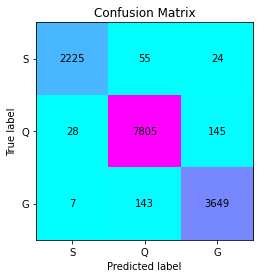

In [ ]:
Confusion_Matrix(X1, y1, X2, y2, gb1, gb2, robust1, robust2, column)

In [ ]:
def For_one_gb(X_train, y_train, X_test, y_test):
  robust = RobustScaler()
  
  data, datat = data_preparation(X_train, y_train, test_size=0.2)

  X_train , y_train = data[:, :-1], data[:, -1].astype('int')
  X_valid, y_valid = datat[:, :-1], datat[:, -1].astype('int')
  X_train_norm = robust.fit_transform(X_train)
  X_test_norm = robust.transform(X_test)
  X_valid_norm = robust.transform(X_valid)

  obj = HPOpt(X_train_norm, y_train, cv=3)
  lgb_opt = obj.process(fn_name='lgb_reg', space=lgb_para, trials=Trials(), algo=tpe.suggest, max_evals=20)
  print(lgb_opt)
  gb = lgb.LGBMClassifier( 
                            **{'colsample_bytree': lgb_opt[0]['colsample_bytree'],
                              'min_child_samples': lgb_opt[0]['min_child_samples']+1,
                              'min_child_weight': lgb_opt[0]['min_child_weight'],
                              'num_leaves': lgb_opt[0]['num_leaves']+10,
                              'n_estimators': 1000
                              }
                          )
  t = time()
  gb.fit(X_train_norm, y_train, eval_set=[(X_train_norm, y_train), (X_valid_norm, y_valid)],  **lgb_fit_params)
  print(time()-t)

  return gb, robust

In [ ]:
def For_one_tn(X_train, y_train, X_test, y_test):
  
  data, datat = data_preparation(X_train, y_train, test_size=0.2)
  X_train , y_train = data[:, :-1], data[:, -1].astype('int')
  X_valid, y_valid = datat[:, :-1], datat[:, -1].astype('int')

  obj = HPOpt(X_train, y_train, cv=2)
  tn_opt = obj.process(fn_name='tabnet_reg', space=tabnet_para, trials=Trials(), algo=tpe.suggest, max_evals=5)
  print(tn_opt)
  tn = TabNetClassifier( 
                         **{'n_d' :              8,
                            'n_a' :              8,
                            'n_shared':          tn_opt[0]['n_shared']+1,
                            'n_independent':     tn_opt[0]['n_independent']+1,
                            'n_steps' :          tn_opt[0]['n_steps']+3,
                            'gamma' :            tn_opt[0]['gamma'],
                            'lambda_sparse' :    tn_opt[0]['lambda_sparse'],
                            'optimizer_params' : dict(lr=2e-2),
                            'scheduler_params' : {"step_size":200, "gamma":0.95},
                            'scheduler_fn' :     torch.optim.lr_scheduler.StepLR,
                            'mask_type' :       'entmax'}
                          )
  t = time()
  tn.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_valid, y_valid)],  **tabnet_fit_params)
  print(time()-t)

  return tn, None

Что мы хотим получить для каждой модели: 
  

1.   ~~Общий график точности в зависимости от признака для разных моделей~~
2.   ~~Матрицу cov~~
3.   ~~Precition Recall в зависимости от признака micro и для каждого класса~~
4.   Список трейновых ra, dec






In [ ]:
column = 'sdssdr16_r_cmodel'

#На выборке из 15-ти объектов

In [ ]:
import gzip
import pickle
#classes = {'STAR': 1, 'QSO':2, 'GALAXY':3}


path = '/content/drive/MyDrive/Научная работа/Data/X-ray/cv0.gz_pkl'#'/content/drive/MyDrive/Научная работа/Data/Main/data/cv0_0/cv0.gz_pkl'
with gzip.open(path, 'rb') as fin:
    df1 = pickle.load(fin)
    df1 = df1[[column] + features + ['class']].dropna()

path = '/content/drive/MyDrive/Научная работа/Data/X-ray/cv1.gz_pkl'#'/content/drive/MyDrive/Научная работа/Data/Main/data/cv0_1/cv1.gz_pkl'
with gzip.open(path, 'rb') as fin:
    df2 = pickle.load(fin)
    df2= df2[[column] + features + ['class']].dropna()

In [ ]:
#df1.replace({'class':classes}, inplace = True)
#df2.replace({'class':classes}, inplace = True)

##GB на сам себе


Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb уже существует
Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/sdssdr16+wise_decals8tr уже существует
sdssdr16+wise_decals8tr
100%|██████████| 20/20 [00:48<00:00,  2.44s/it, best loss: -0.9708551528073915]
({'colsample_bytree': 0.8988054427821598, 'min_child_samples': 13, 'min_child_weight': 0.09578040612863796, 'num_leaves': 58}, <hyperopt.base.Trials object at 0x7ff99a5e3cd0>)
1.4394936561584473
100%|██████████| 20/20 [00:53<00:00,  2.68s/it, best loss: -0.9675704412546517]
({'colsample_bytree': 0.7821527825827762, 'min_child_samples': 44, 'min_child_weight': 0.980326593432334, 'num_leaves': 51}, <hyperopt.base.Trials object at 0x7ff9a2cd8cd0>)
1.1188397407531738


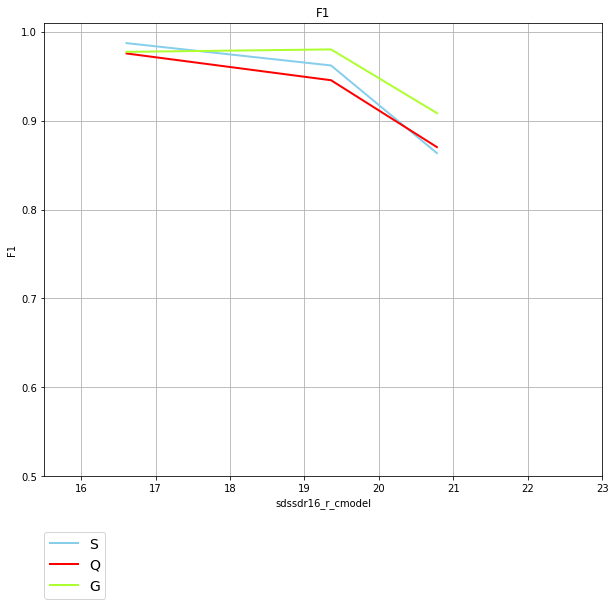

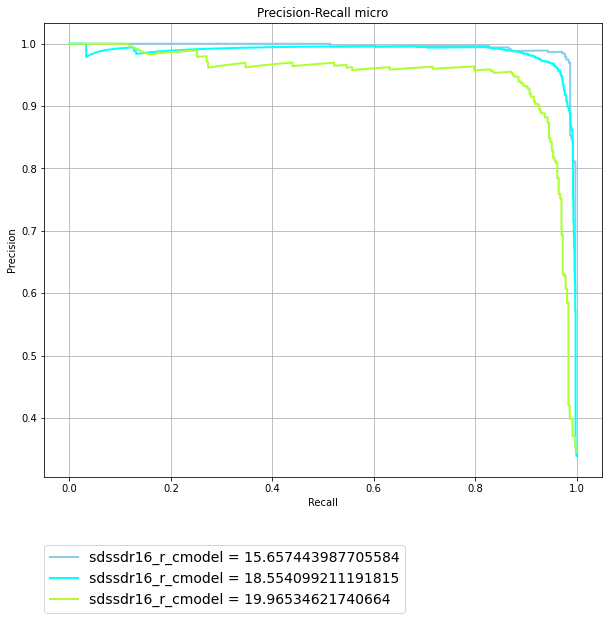

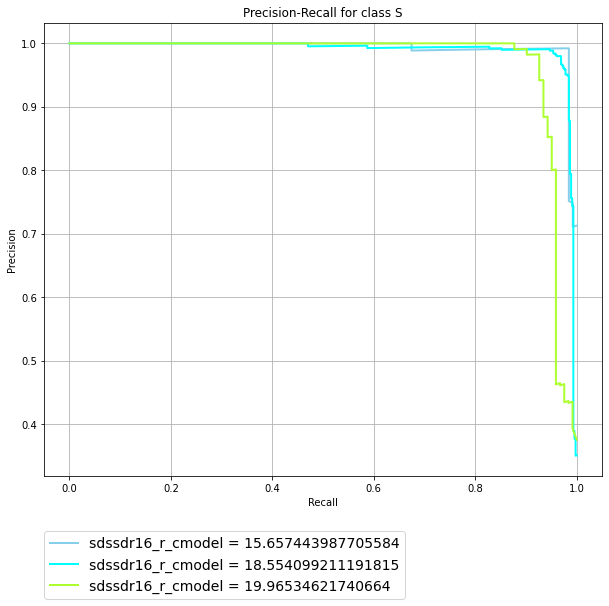

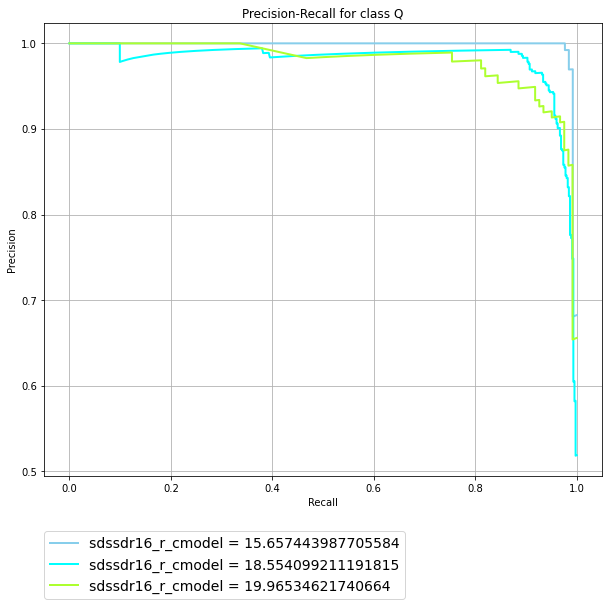

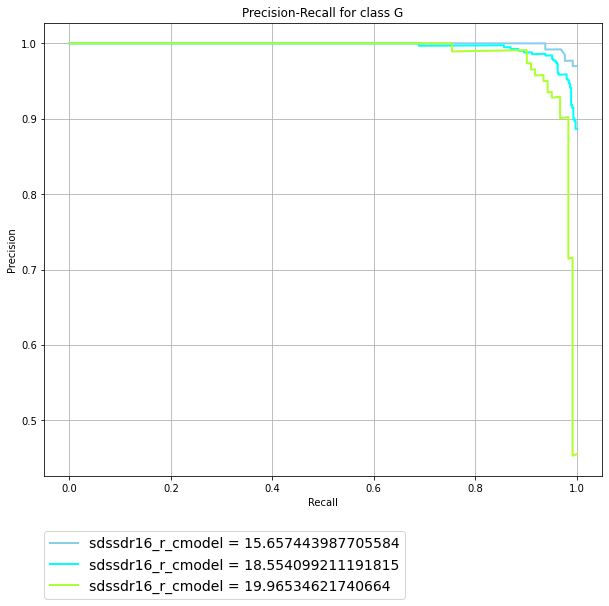

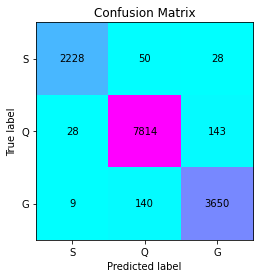

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/psdr2+wise_decals8tr уже существует
psdr2+wise_decals8tr
100%|██████████| 20/20 [00:50<00:00,  2.54s/it, best loss: -0.9672999763089315]
({'colsample_bytree': 0.7599482095221582, 'min_child_samples': 36, 'min_child_weight': 0.7733625088521553, 'num_leaves': 78}, <hyperopt.base.Trials object at 0x7ff999707190>)
1.3059382438659668
100%|██████████| 20/20 [00:53<00:00,  2.69s/it, best loss: -0.9672160198475988]
({'colsample_bytree': 0.8091533215547709, 'min_child_samples': 39, 'min_child_weight': 0.632229710305505, 'num_leaves': 81}, <hyperopt.base.Trials object at 0x7ff999707190>)
1.4733555316925049


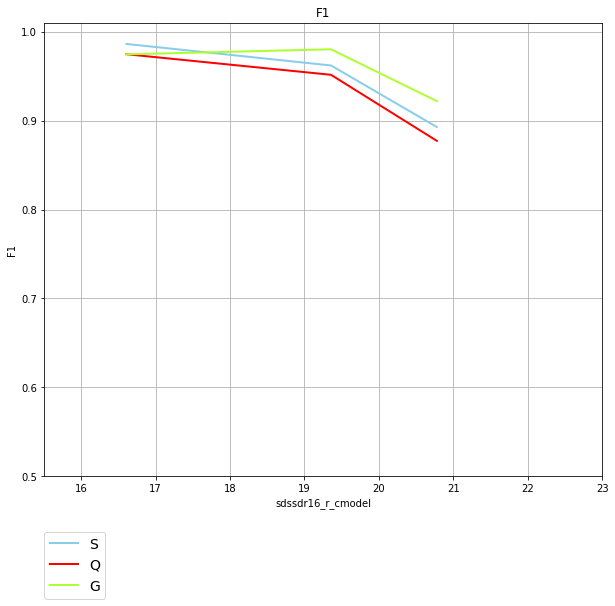

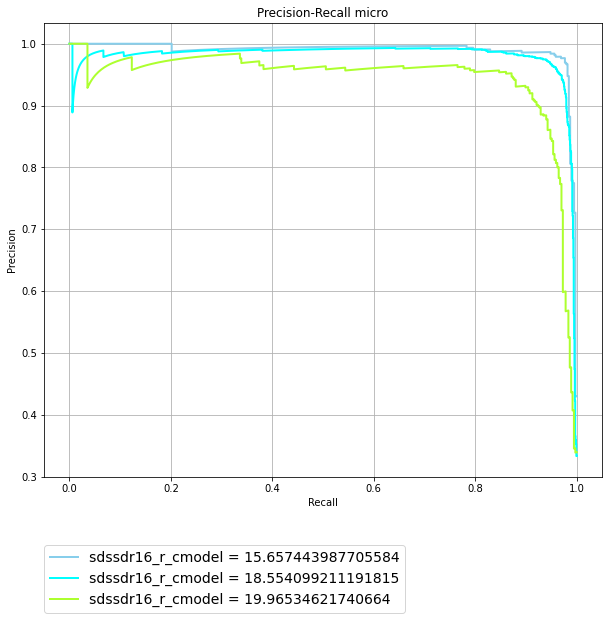

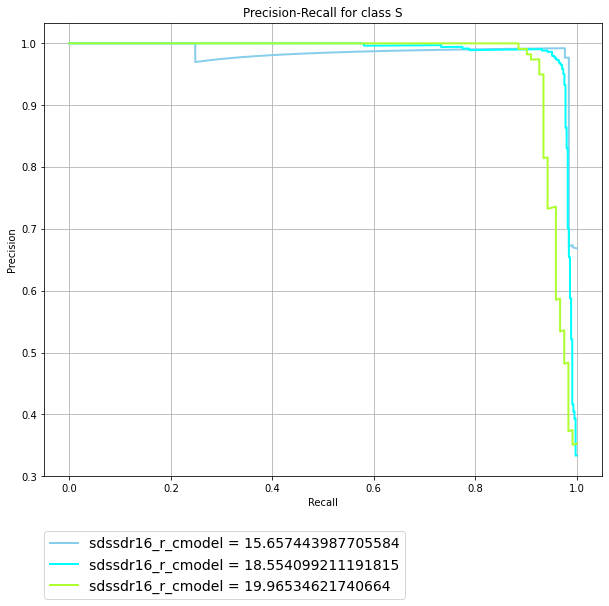

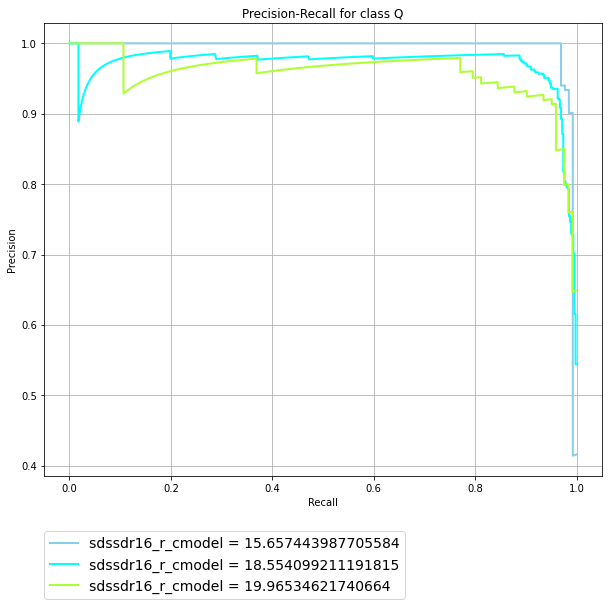

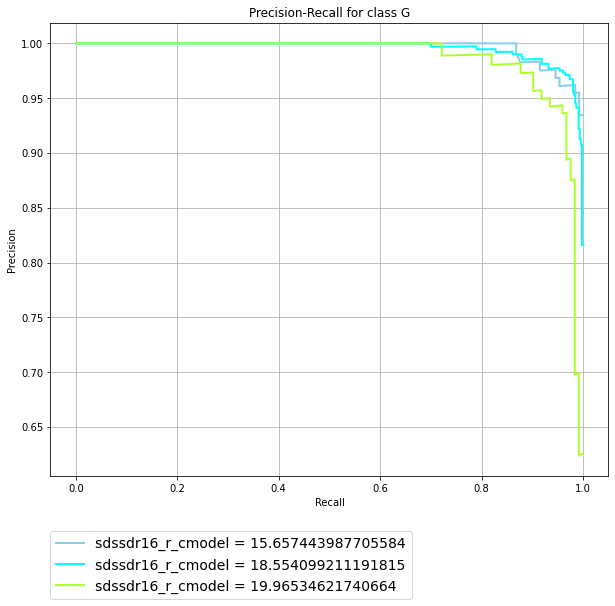

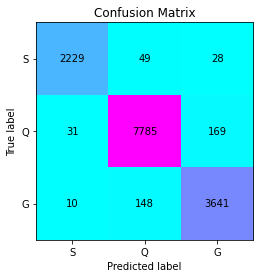

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/sdssdr16+all_decals8tr уже существует
sdssdr16+all_decals8tr
100%|██████████| 20/20 [01:05<00:00,  3.27s/it, best loss: -0.9706776593224354]
({'colsample_bytree': 0.6376547751397953, 'min_child_samples': 20, 'min_child_weight': 0.46250638798731564, 'num_leaves': 48}, <hyperopt.base.Trials object at 0x7ff98f398c50>)
1.1282894611358643
100%|██████████| 20/20 [01:03<00:00,  3.16s/it, best loss: -0.9691653375863902]
({'colsample_bytree': 0.8306378681219918, 'min_child_samples': 34, 'min_child_weight': 0.24491174066071975, 'num_leaves': 97}, <hyperopt.base.Trials object at 0x7ff98d908050>)
2.1594433784484863


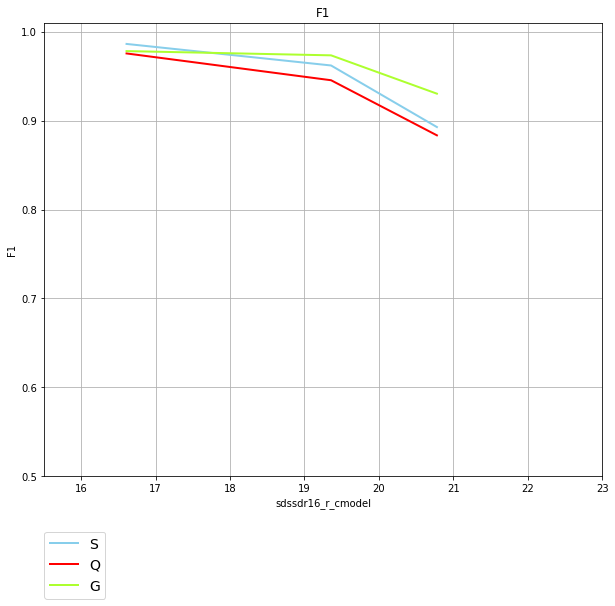

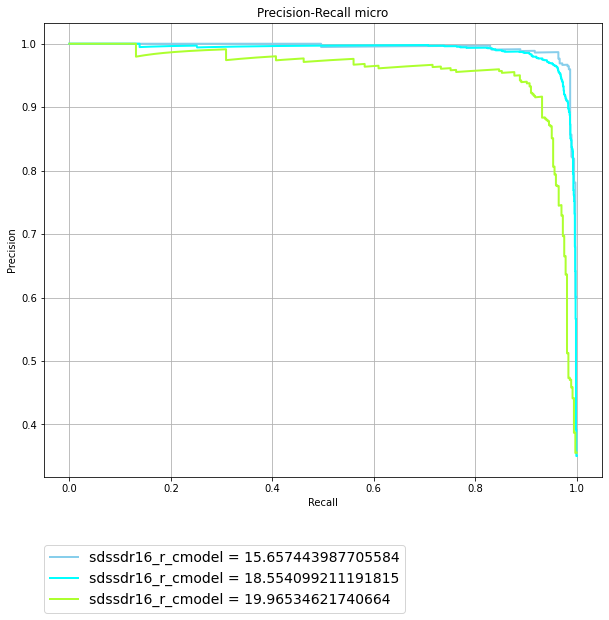

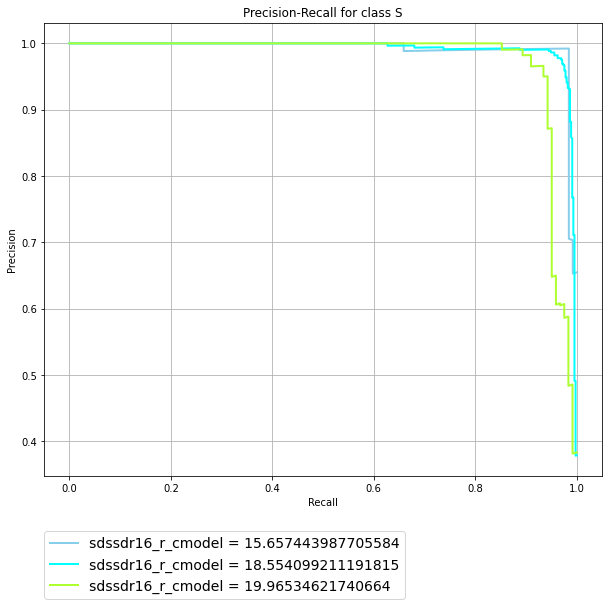

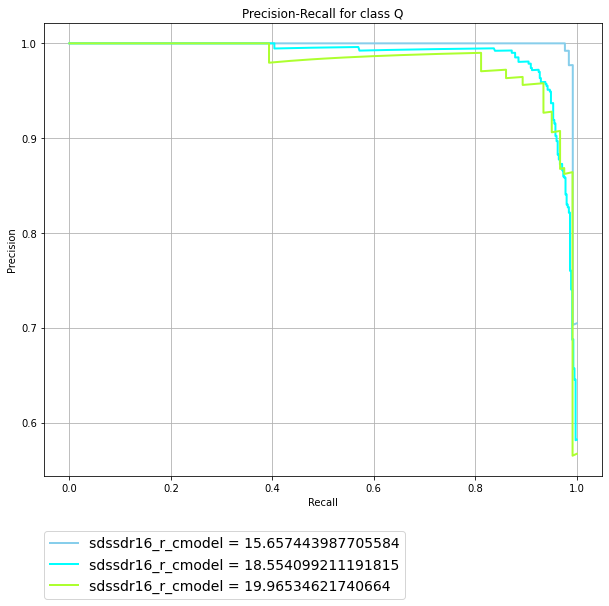

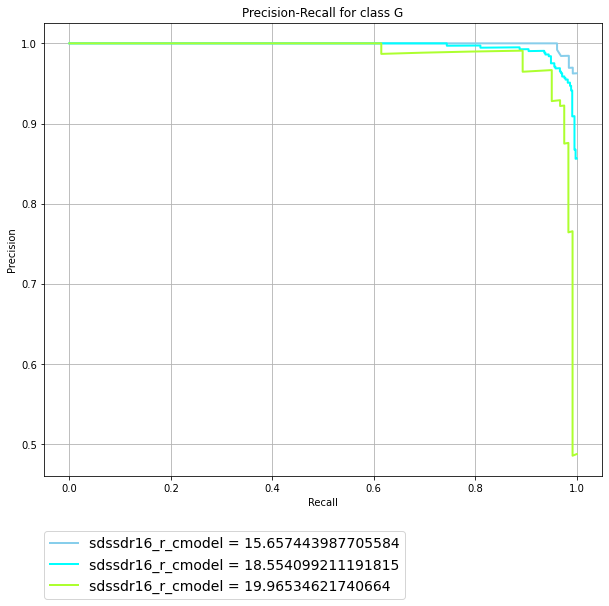

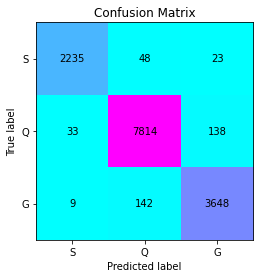

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/psdr2+all_decals8tr уже существует
psdr2+all_decals8tr
100%|██████████| 20/20 [00:53<00:00,  2.70s/it, best loss: -0.9699659796256811]
({'colsample_bytree': 0.7040280656177291, 'min_child_samples': 29, 'min_child_weight': 0.25809221323275255, 'num_leaves': 4}, <hyperopt.base.Trials object at 0x7ff98684a750>)
0.7129721641540527
100%|██████████| 20/20 [01:01<00:00,  3.08s/it, best loss: -0.9705830232146022]
({'colsample_bytree': 0.7966417710509911, 'min_child_samples': 39, 'min_child_weight': 0.4163598746353946, 'num_leaves': 62}, <hyperopt.base.Trials object at 0x7ff98897e6d0>)
1.5273277759552002


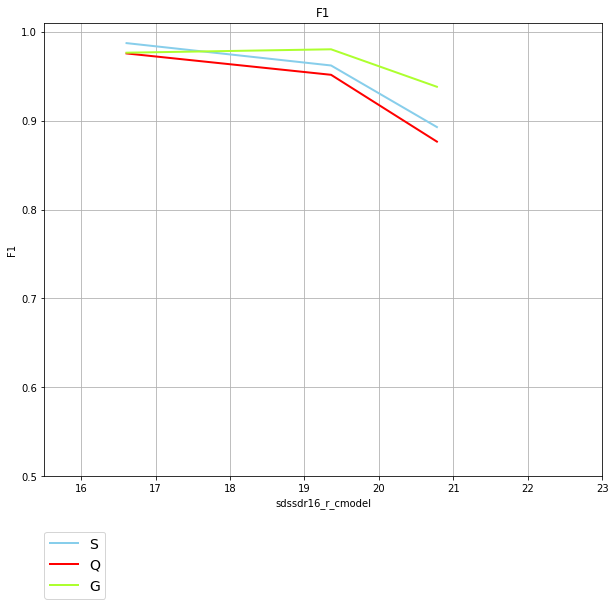

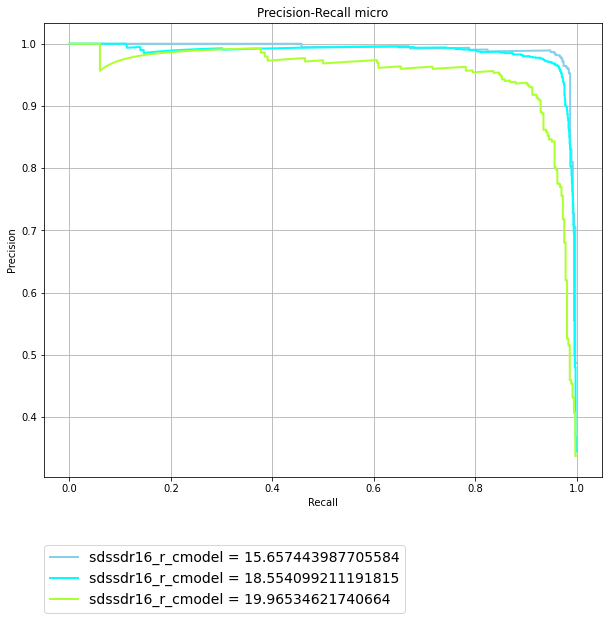

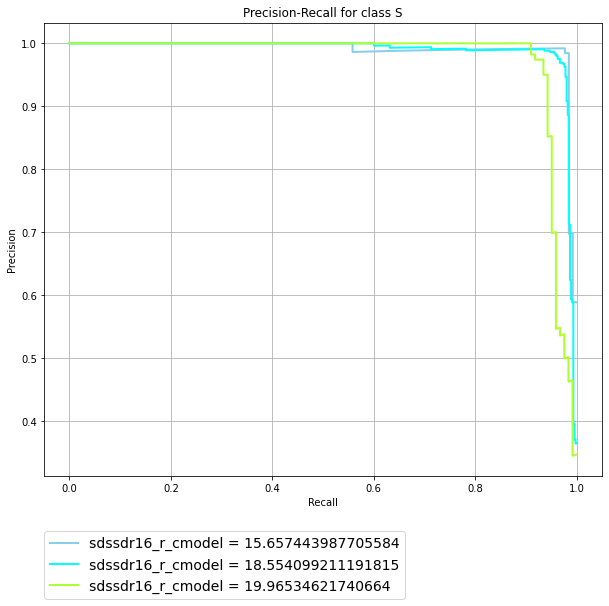

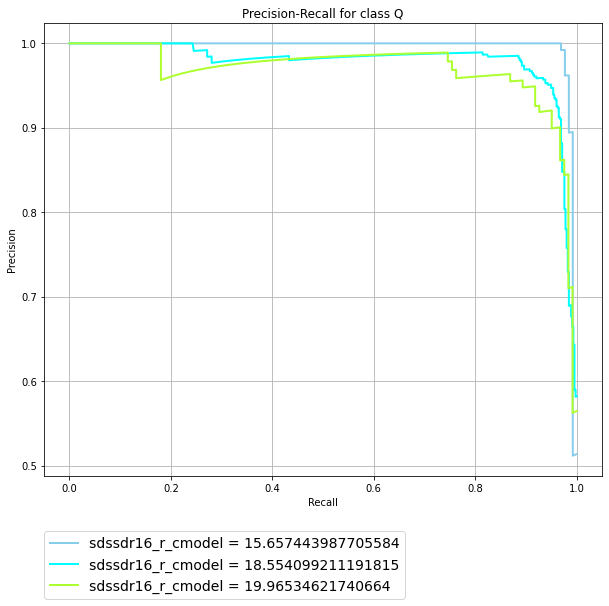

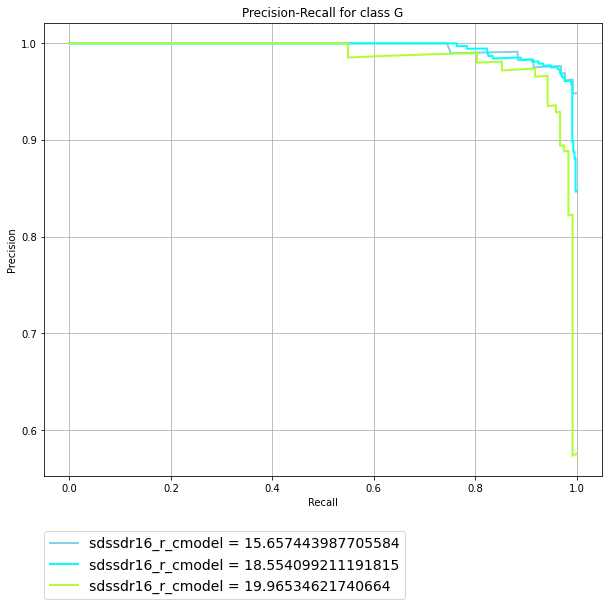

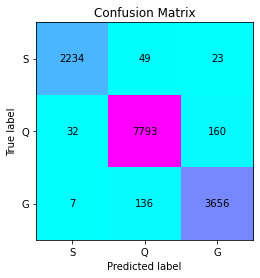

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/decals8tr уже существует
decals8tr
100%|██████████| 20/20 [00:49<00:00,  2.49s/it, best loss: -0.955749443259891]
({'colsample_bytree': 0.6987348033830377, 'min_child_samples': 31, 'min_child_weight': 0.011073565148192365, 'num_leaves': 74}, <hyperopt.base.Trials object at 0x7ff9514f8c10>)
1.065202236175537
100%|██████████| 20/20 [00:46<00:00,  2.30s/it, best loss: -0.9556973241183768]
({'colsample_bytree': 0.676956696998876, 'min_child_samples': 48, 'min_child_weight': 0.3422002066792973, 'num_leaves': 21}, <hyperopt.base.Trials object at 0x7ff96563d8d0>)
0.6693856716156006


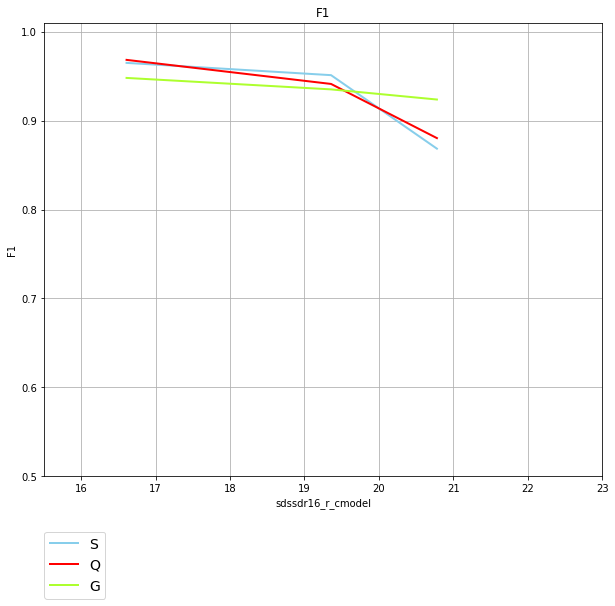

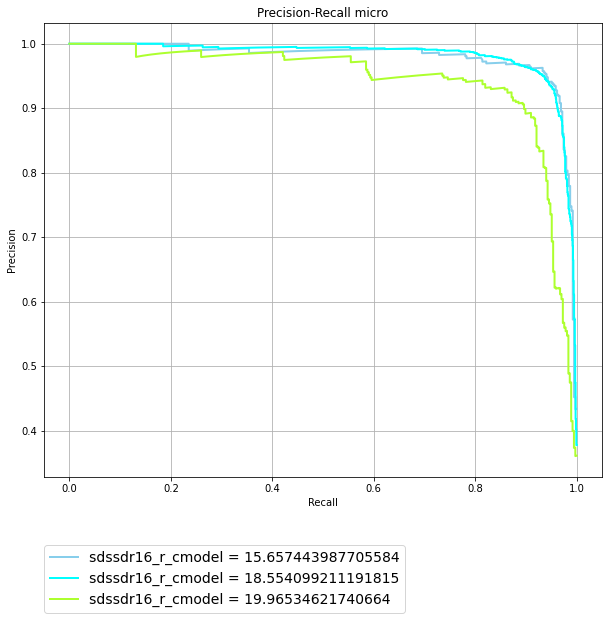

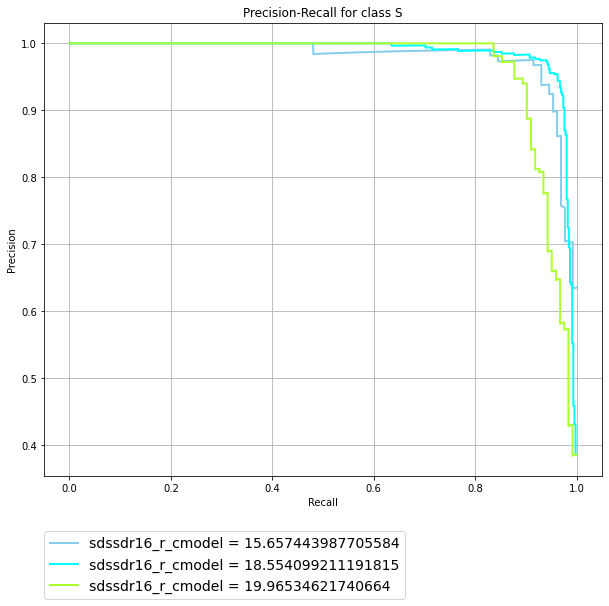

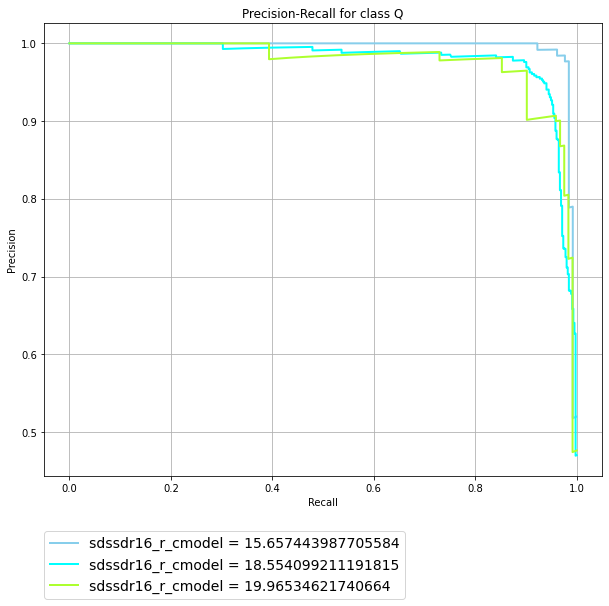

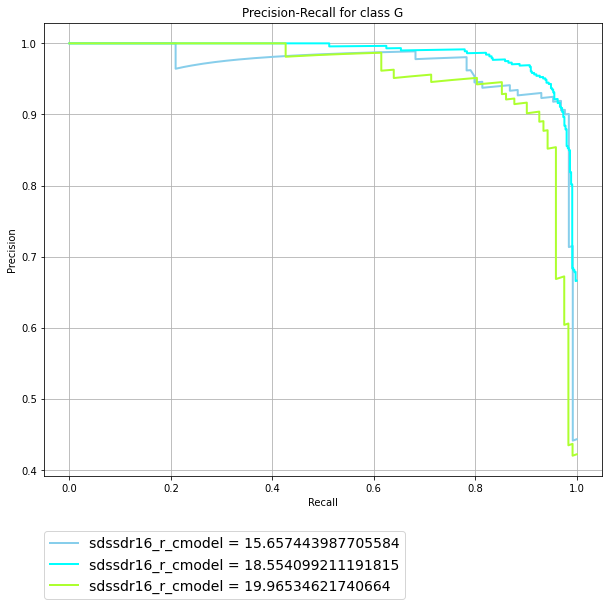

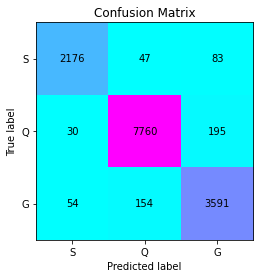

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/sdssdr16+psdr2+wise_decals8tr уже существует
sdssdr16+psdr2+wise_decals8tr
100%|██████████| 20/20 [01:13<00:00,  3.66s/it, best loss: -0.9729879175550818]
({'colsample_bytree': 0.7141811975838798, 'min_child_samples': 19, 'min_child_weight': 0.2064654029305809, 'num_leaves': 99}, <hyperopt.base.Trials object at 0x7ff96563d790>)
2.5004379749298096
100%|██████████| 20/20 [01:12<00:00,  3.65s/it, best loss: -0.9702286018075492]
({'colsample_bytree': 0.5363142132693973, 'min_child_samples': 30, 'min_child_weight': 0.23060053284975823, 'num_leaves': 96}, <hyperopt.base.Trials object at 0x7ff98e4c5fd0>)
2.084075689315796


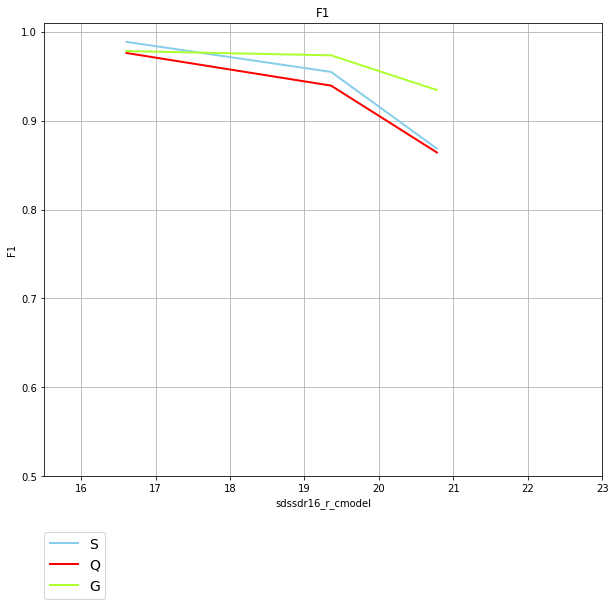

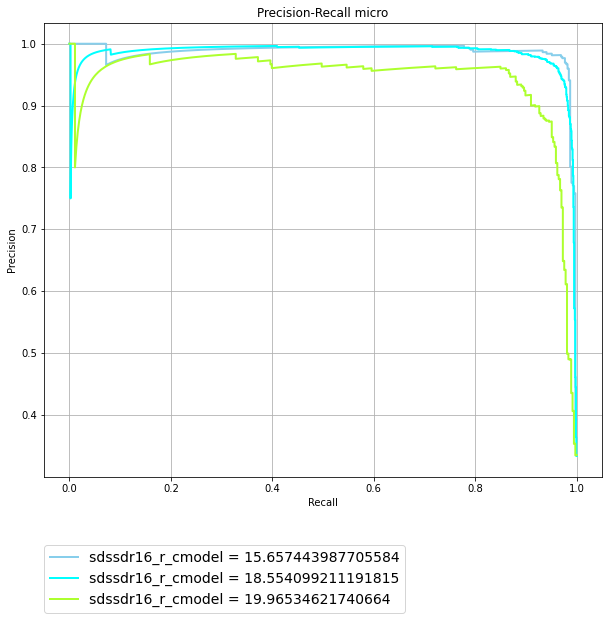

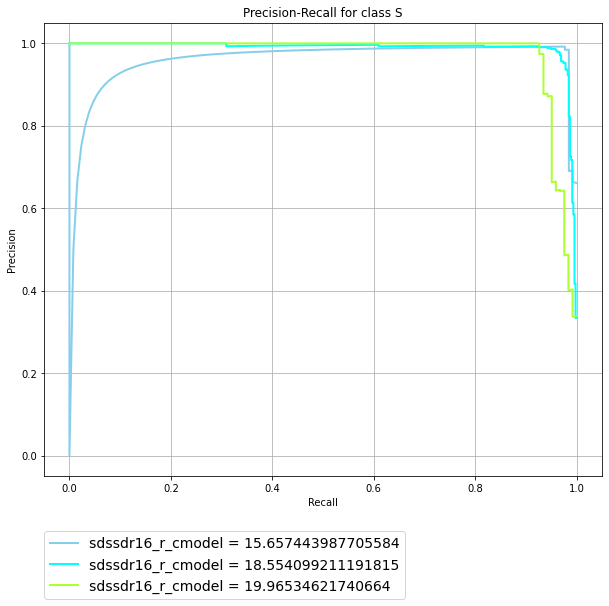

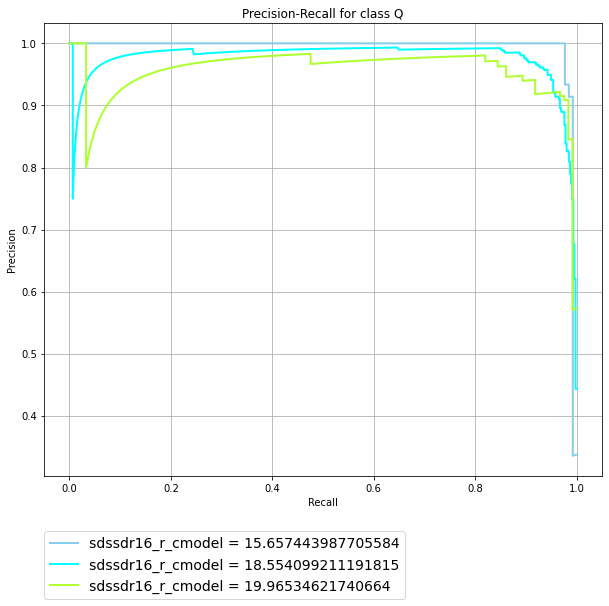

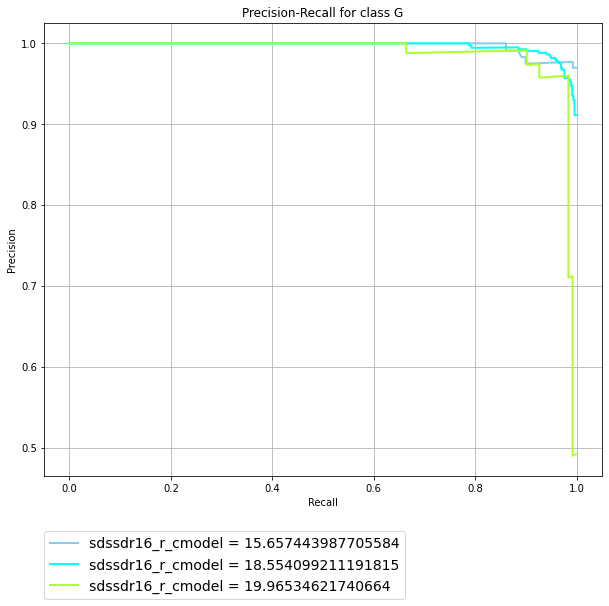

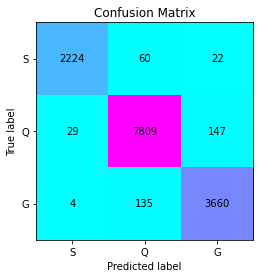

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/sdssdr16+psdr2+all_decals8tr уже существует
sdssdr16+psdr2+all_decals8tr
100%|██████████| 20/20 [01:14<00:00,  3.74s/it, best loss: -0.9696114664771383]
({'colsample_bytree': 0.8008778592232506, 'min_child_samples': 46, 'min_child_weight': 0.823720801347338, 'num_leaves': 53}, <hyperopt.base.Trials object at 0x7ff99e2a7c90>)
1.92857027053833
100%|██████████| 20/20 [01:30<00:00,  4.54s/it, best loss: -0.9712918660287082]
({'colsample_bytree': 0.864485285436703, 'min_child_samples': 38, 'min_child_weight': 0.021188276354943632, 'num_leaves': 65}, <hyperopt.base.Trials object at 0x7ff9a5b2c0d0>)
2.822500467300415


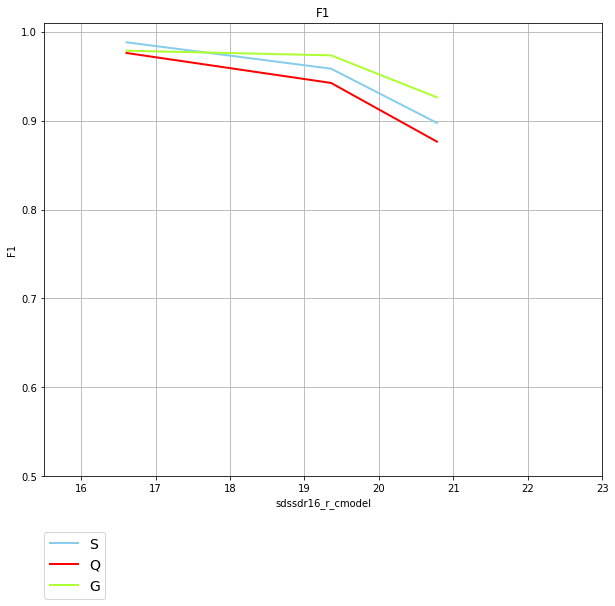

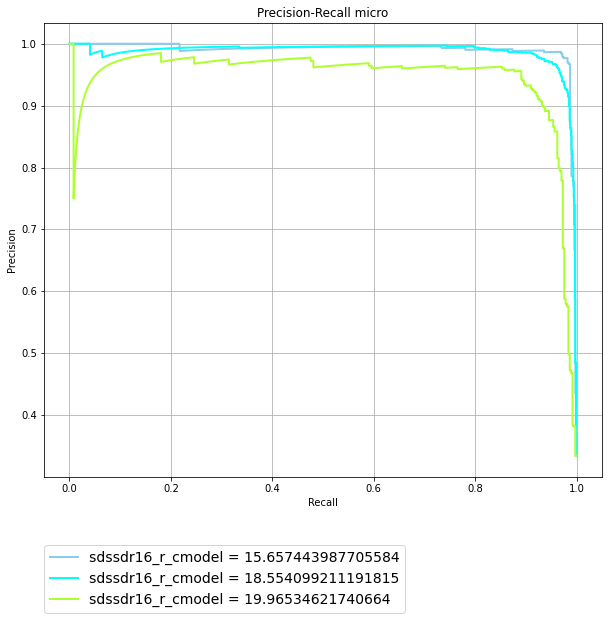

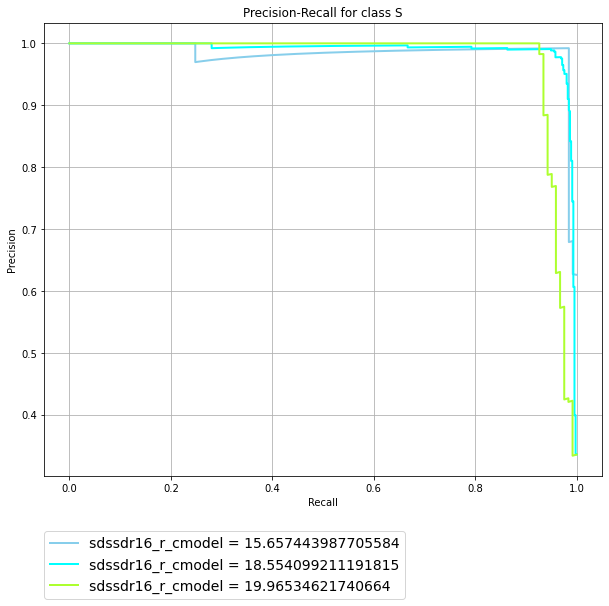

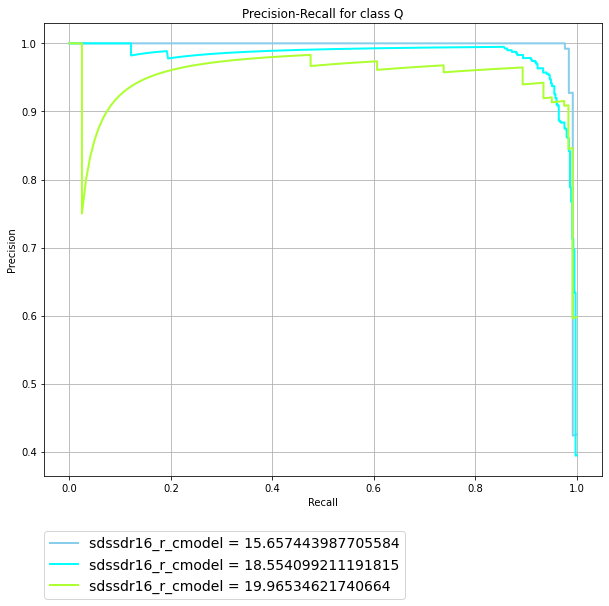

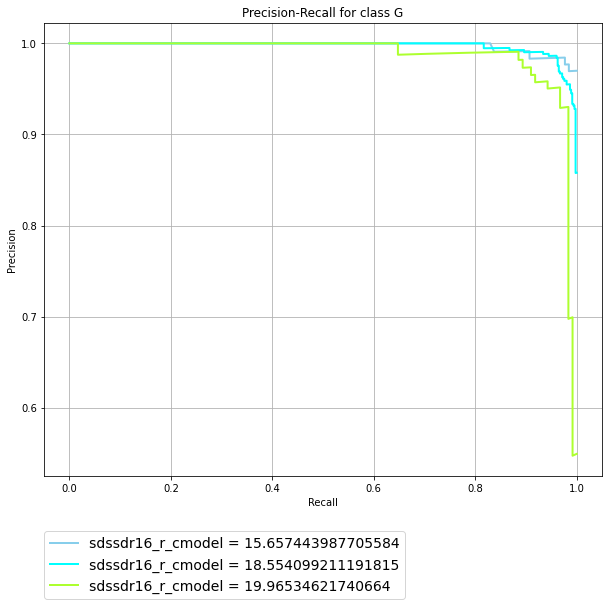

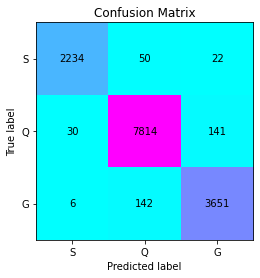

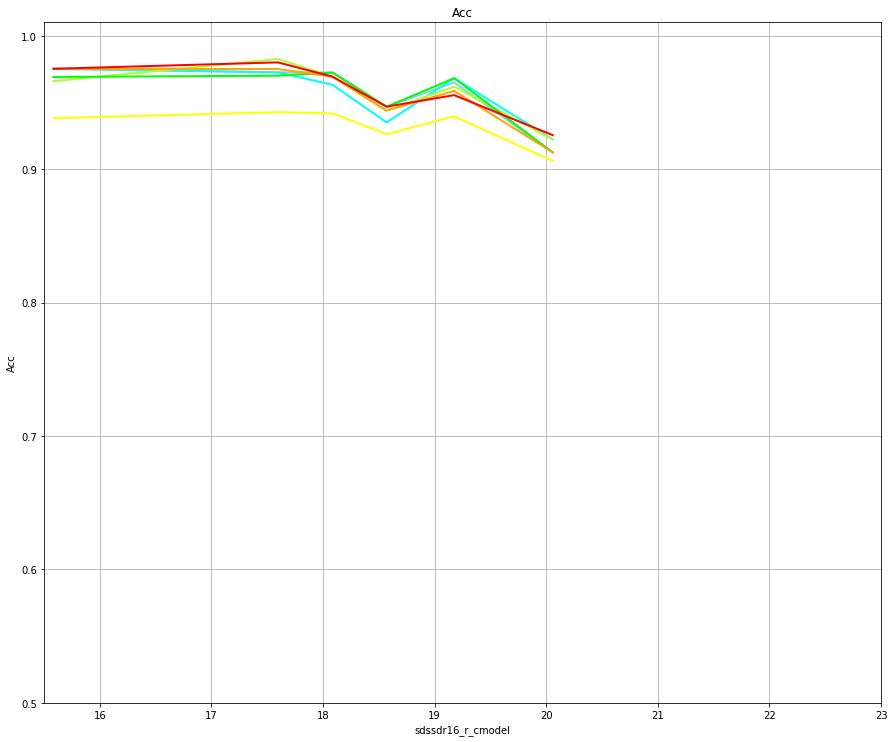

In [ ]:
accuracy = dict()
brightness = dict()

import os
path = "/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb"

try:
    os.makedirs(path)
except FileExistsError:
  print("Директория %s уже существует" % path) 
except OSError:
    print ("Создать директорию %s не удалось" % path)
    exit()

for overview in f.keys():
  path = f"/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/{overview}"
  try:
      os.makedirs(path)
  except FileExistsError:
    print("Директория %s уже существует" % path)
  except OSError:
      print("Создать директорию %s не удалось" % path)
      exit()

  print(overview)

  X1, y1 = df1[[column]+f[overview]].values, df1['class'].values #.replace({'class':classes}, inplace = True)
  X2, y2 = df2[[column]+f[overview]].values, df2['class'].values


  model1, robust1 = For_one_gb(X1[:, 1:], y1, X2[:, 1:], y2)
  model2, robust2 = For_one_gb(X2[:, 1:], y2, X1[:, 1:], y1)



  F1_plot_class(X1, y1, X2, y2, model1, model2, robust1, robust2, column, f'{path}/{overview}_gb_')
  Prediction_Recall_plot(X1, y1, X2, y2, model1, model2, robust1, robust2, column, f'{path}/{overview}_gb_')
  Confusion_Matrix(X1, y1, X2, y2, model1, model2, robust1, robust2, column, f'{path}/{overview}_gb_')
  acc, r = choseAcc_2cv(X2, y2, X1, y1, model1, model2, 100, robust1, robust2, accuracy_score)
  acc = np.array(acc).T
  accuracy[overview] = acc
  brightness[overview] = r

plt.figure(figsize=(15, 15))
lines = []
labels = []
clr = ['skyblue', 'aqua', 'greenyellow', 'lime', 'yellow', 'orange', 'red', 'chocolate', 'darkorange', 'gold', 'springgreen', 'aquamarine',  'lightskyblue']

j=0
for overview in f.keys():
  l, = plt.plot(brightness[overview], accuracy[overview], color=clr[j], lw=2)
  lines.append(l)
  labels.append(f"Model {overview}")
  j+=1

fig = plt.gcf()
fig.subplots_adjust(bottom=0.25)
plt.xlabel(column)
plt.xlim(15.5, 23)
plt.ylim(0.5, 1.01)
plt.ylabel('Acc')
plt.title('Acc')
plt.grid(True)

#plt.legend(lines, labels, loc=(0, -0.32), prop=dict(size=14))
plt.savefig(f'/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/gb_accuracy.png')
plt.show()

##TN на сам себе

sdssdr16+wise_decals8tr
Device used : cpu
epoch 0  | loss: 1.27139 | val_0_accuracy: 0.28546 | val_1_accuracy: 0.26866 |  0:00:00s
epoch 1  | loss: 0.89614 | val_0_accuracy: 0.49591 | val_1_accuracy: 0.5167  |  0:00:01s
epoch 2  | loss: 0.70775 | val_0_accuracy: 0.35371 | val_1_accuracy: 0.35181 |  0:00:01s
epoch 3  | loss: 0.51055 | val_0_accuracy: 0.47885 | val_1_accuracy: 0.49574 |  0:00:01s
epoch 4  | loss: 0.39428 | val_0_accuracy: 0.36402 | val_1_accuracy: 0.36247 |  0:00:02s
epoch 5  | loss: 0.32386 | val_0_accuracy: 0.23036 | val_1_accuracy: 0.21606 |  0:00:02s
epoch 6  | loss: 0.25136 | val_0_accuracy: 0.30288 | val_1_accuracy: 0.28252 |  0:00:03s
epoch 7  | loss: 0.22595 | val_0_accuracy: 0.32954 | val_1_accuracy: 0.30171 |  0:00:03s
epoch 8  | loss: 0.19915 | val_0_accuracy: 0.22183 | val_1_accuracy: 0.21144 |  0:00:04s
epoch 9  | loss: 0.1875  | val_0_accuracy: 0.51262 | val_1_accuracy: 0.51599 |  0:00:04s
epoch 10 | loss: 0.16405 | val_0_accuracy: 0.60149 | val_1_accuracy:

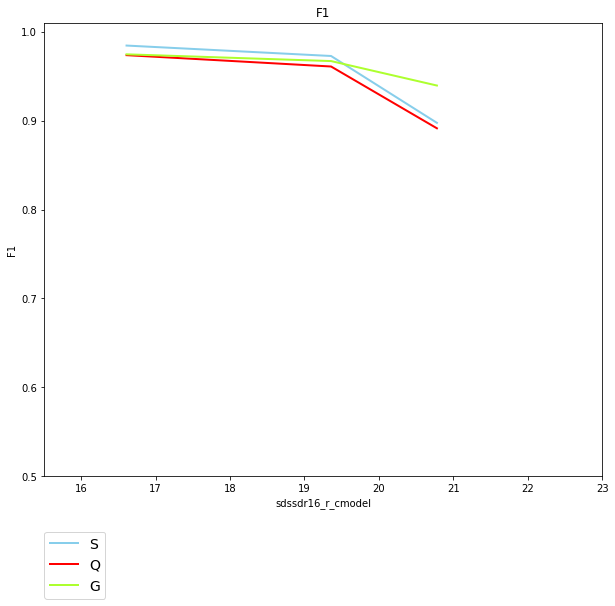

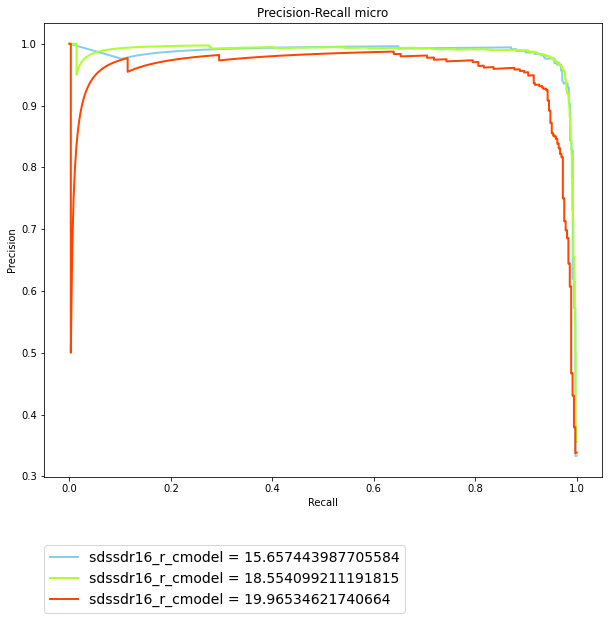

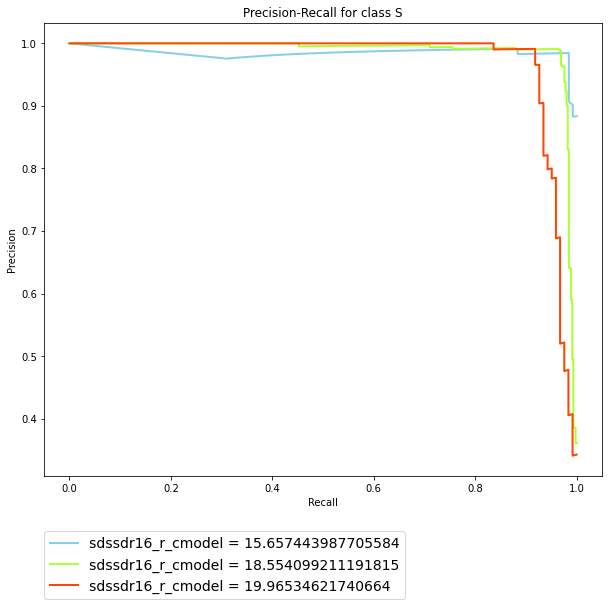

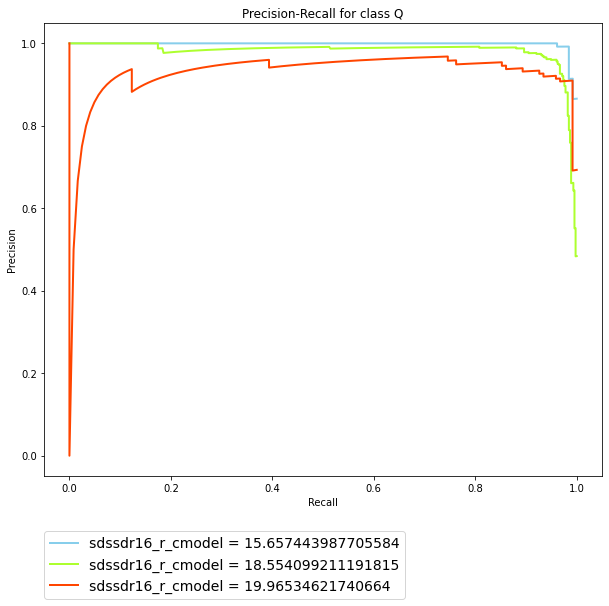

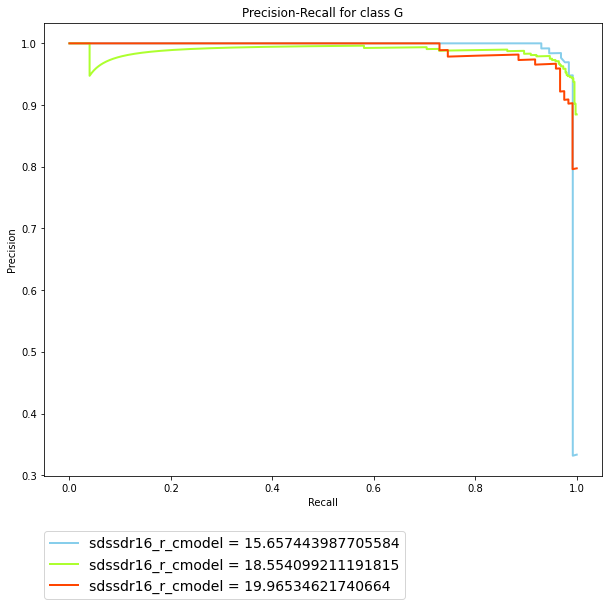

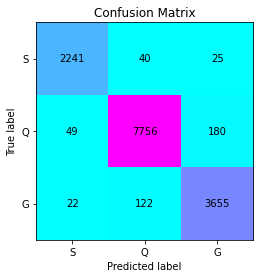

psdr2+wise_decals8tr
Device used : cpu
epoch 0  | loss: 1.36231 | val_0_accuracy: 0.0839  | val_1_accuracy: 0.09453 |  0:00:00s
epoch 1  | loss: 0.83161 | val_0_accuracy: 0.27586 | val_1_accuracy: 0.27186 |  0:00:00s
epoch 2  | loss: 0.63061 | val_0_accuracy: 0.27053 | val_1_accuracy: 0.26866 |  0:00:01s
epoch 3  | loss: 0.46764 | val_0_accuracy: 0.27906 | val_1_accuracy: 0.27292 |  0:00:01s
epoch 4  | loss: 0.37864 | val_0_accuracy: 0.22645 | val_1_accuracy: 0.2253  |  0:00:01s
epoch 5  | loss: 0.32121 | val_0_accuracy: 0.26982 | val_1_accuracy: 0.27114 |  0:00:02s
epoch 6  | loss: 0.26962 | val_0_accuracy: 0.46178 | val_1_accuracy: 0.4801  |  0:00:02s
epoch 7  | loss: 0.20416 | val_0_accuracy: 0.38393 | val_1_accuracy: 0.3877  |  0:00:03s
epoch 8  | loss: 0.21383 | val_0_accuracy: 0.34234 | val_1_accuracy: 0.34257 |  0:00:03s
epoch 9  | loss: 0.19689 | val_0_accuracy: 0.40526 | val_1_accuracy: 0.39872 |  0:00:03s
epoch 10 | loss: 0.20083 | val_0_accuracy: 0.35834 | val_1_accuracy: 0.

KeyboardInterrupt: ignored

In [ ]:
accuracy = dict()
brightness = dict()

import os
path = "/content/drive/MyDrive/Научная работа/Data/X-ray/plots/tn"

try:
    os.makedirs(path)
except FileExistsError:
  print("Директория %s уже существует" % path) 
except OSError:
    print ("Создать директорию %s не удалось" % path)
    exit()

for overview in f.keys():
  path = f"/content/drive/MyDrive/Научная работа/Data/X-ray/plots/tn/{overview}"
  try:
      os.makedirs(path)
  except FileExistsError:
    print("Директория %s уже существует" % path)
  except OSError:
      print("Создать директорию %s не удалось" % path)
      exit()

  print(overview)

  X1, y1 = df1[[column]+f[overview]].values, df1['class'].values #.replace({'class':classes}, inplace = True)
  X2, y2 = df2[[column]+f[overview]].values, df2['class'].values


  model1, robust1 = For_one_tn(X1[:, 1:], y1, X2[:, 1:], y2)
  model2, robust2 = For_one_tn(X2[:, 1:], y2, X1[:, 1:], y1)



  F1_plot_class(X1, y1, X2, y2, model1, model2, robust1, robust2, column, f'{path}/{overview}_tn_')
  Prediction_Recall_plot(X1, y1, X2, y2, model1, model2, robust1, robust2, column, f'{path}/{overview}_tn_')
  Confusion_Matrix(X1, y1, X2, y2, model1, model2, robust1, robust2, column, f'{path}/{overview}_tn_')
  acc, r = choseAcc_2cv(X2, y2, X1, y1, model1, model2, 100, robust1, robust2, accuracy_score)
  acc = np.array(acc).T
  accuracy[overview] = acc
  brightness[overview] = r

plt.figure(figsize=(15, 15))
lines = []
labels = []
clr = ['skyblue', 'aqua', 'greenyellow', 'lime', 'yellow', 'orange', 'red', 'chocolate', 'darkorange', 'gold', 'springgreen', 'aquamarine',  'lightskyblue']

j=0
for overview in f.keys():
  l, = plt.plot(brightness[overview], accuracy[overview], color=clr[j], lw=2)
  lines.append(l)
  labels.append(f"Model {overview}")
  j+=1

fig = plt.gcf()
fig.subplots_adjust(bottom=0.25)
plt.xlabel(column)
plt.xlim(15.5, 23)
plt.ylim(0.5, 1.01)
plt.ylabel('Acc')
plt.title('Acc')
plt.grid(True)
#plt.legend(lines, labels, loc=(0, -0.32), prop=dict(size=14))
plt.savefig(f'/content/drive/MyDrive/Научная работа/Data/X-ray/plots/tn/tn_accuracy.png')
plt.show()

##GB на большой выборке тестим на маленькой

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_little уже существует
Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_little/sdssdr16+wise_decals8tr уже существует
sdssdr16+wise_decals8tr


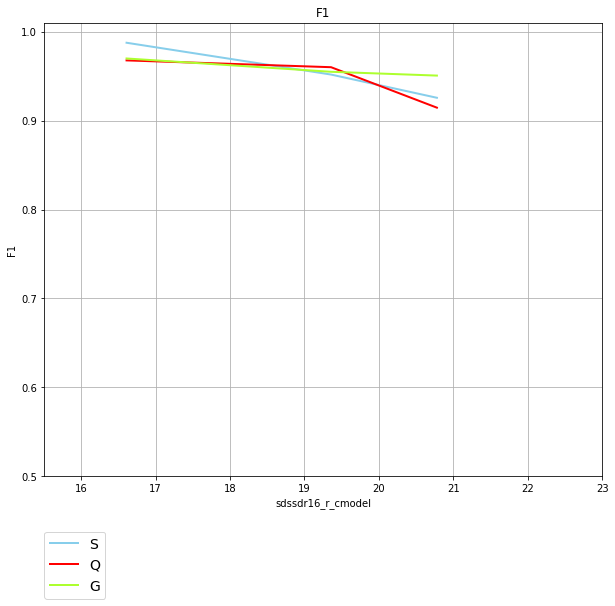

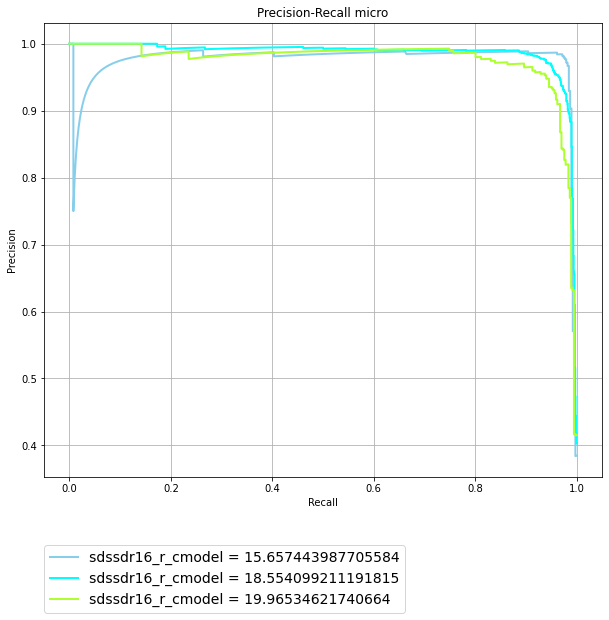

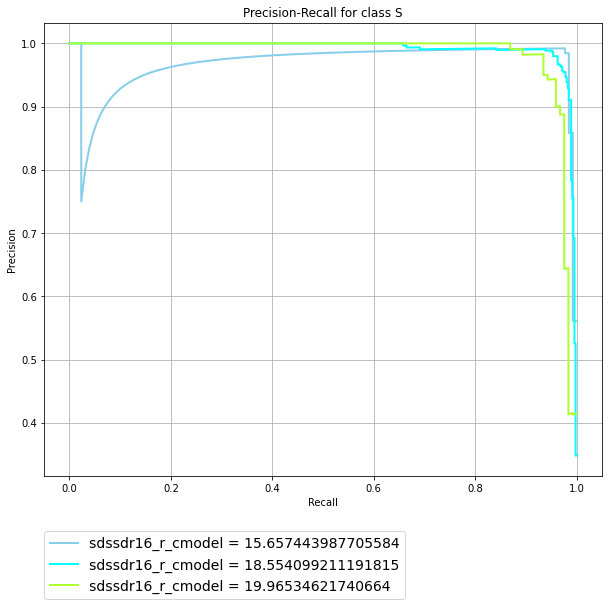

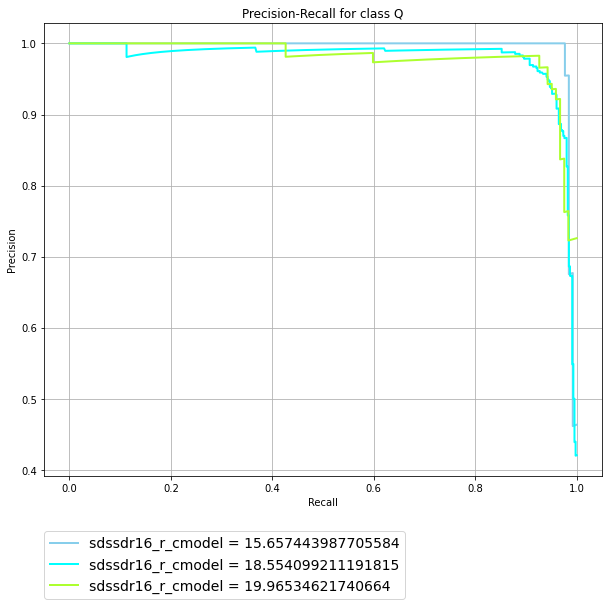

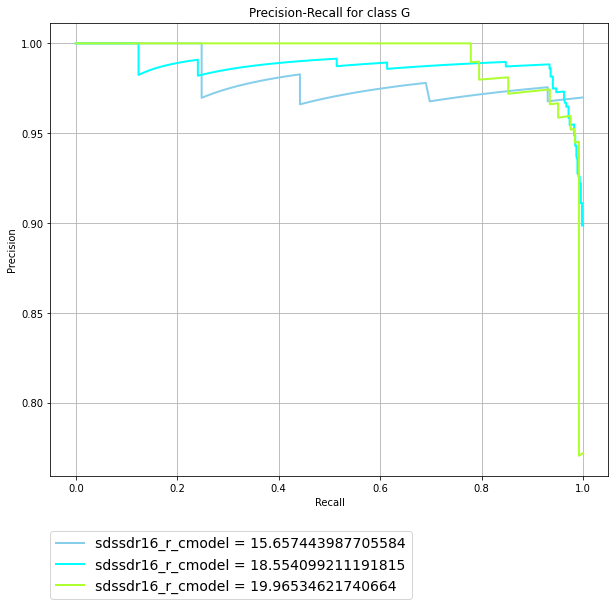

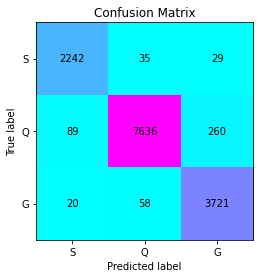

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_little/psdr2+wise_decals8tr уже существует
psdr2+wise_decals8tr


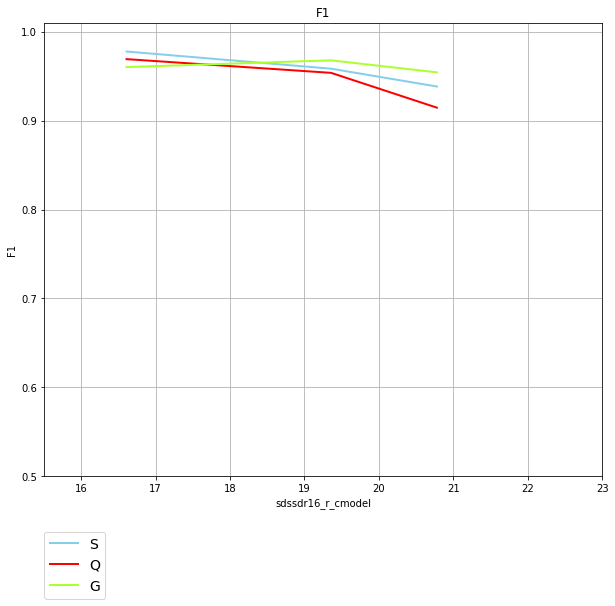

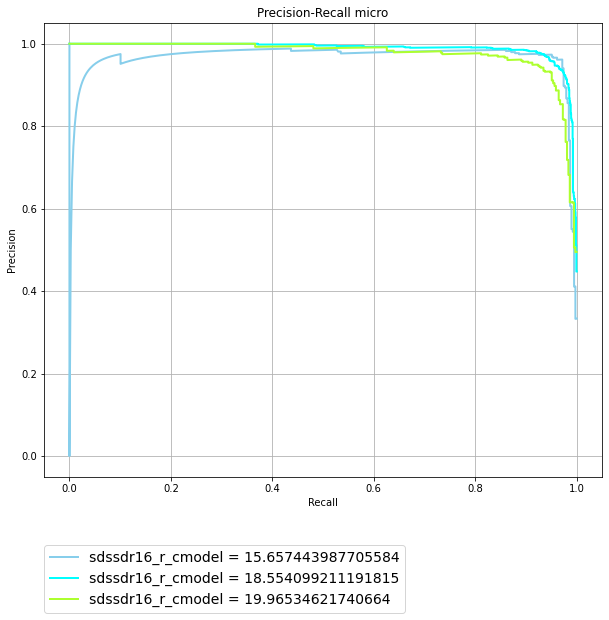

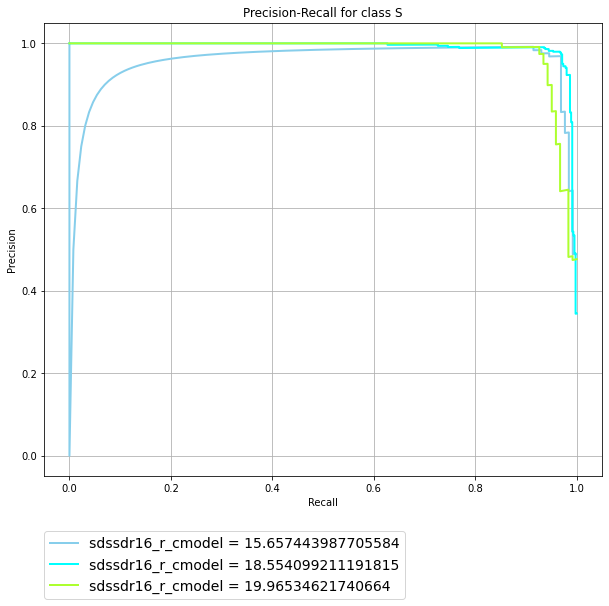

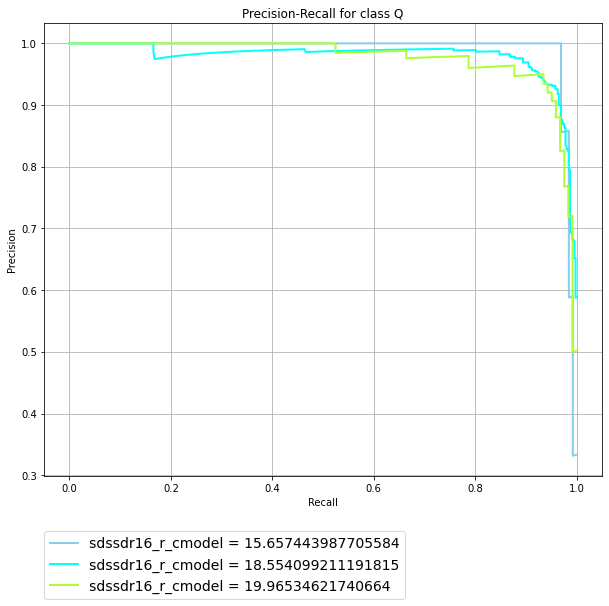

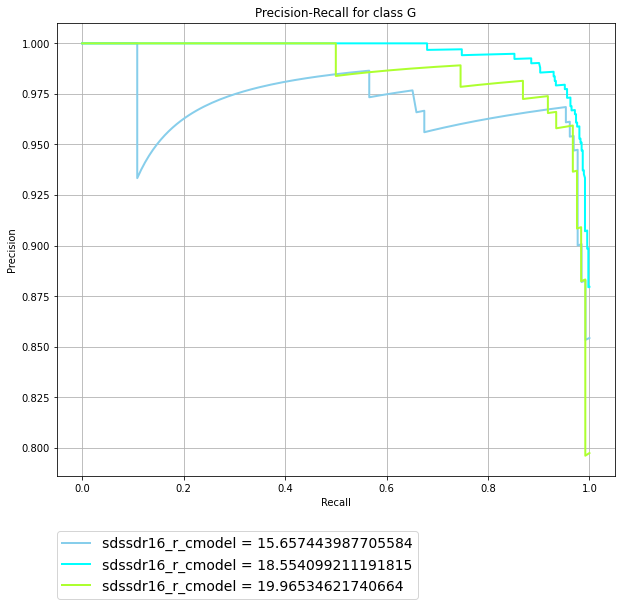

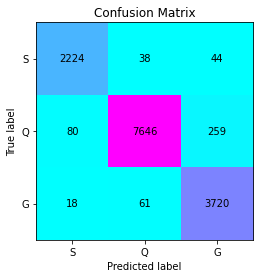

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_little/sdssdr16+all_decals8tr уже существует
sdssdr16+all_decals8tr


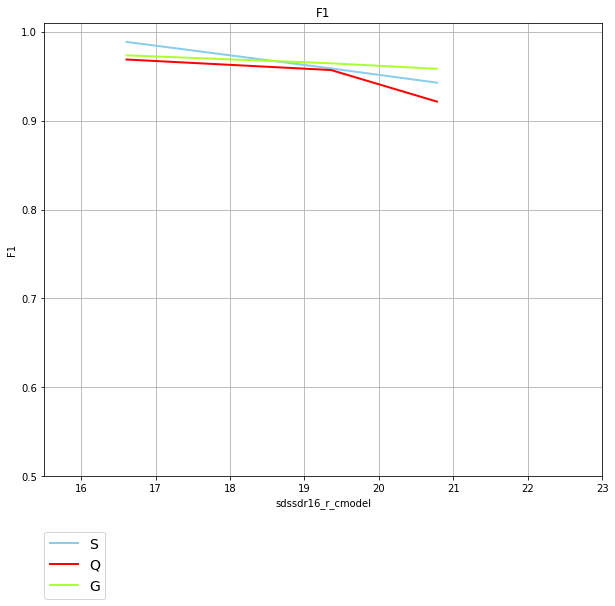

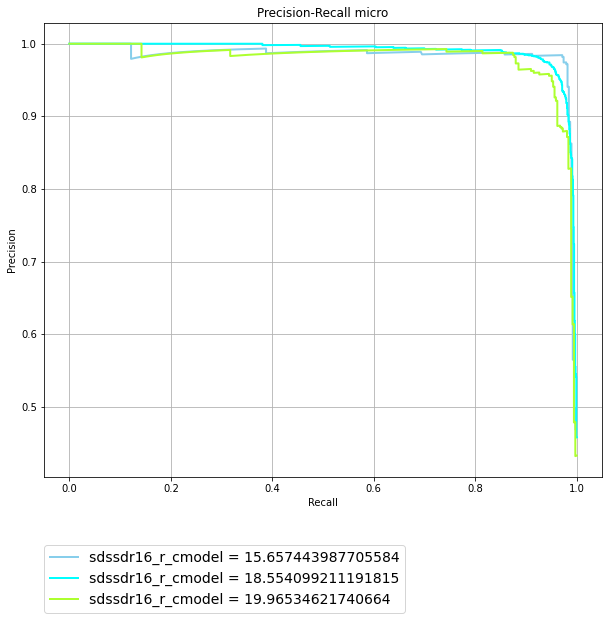

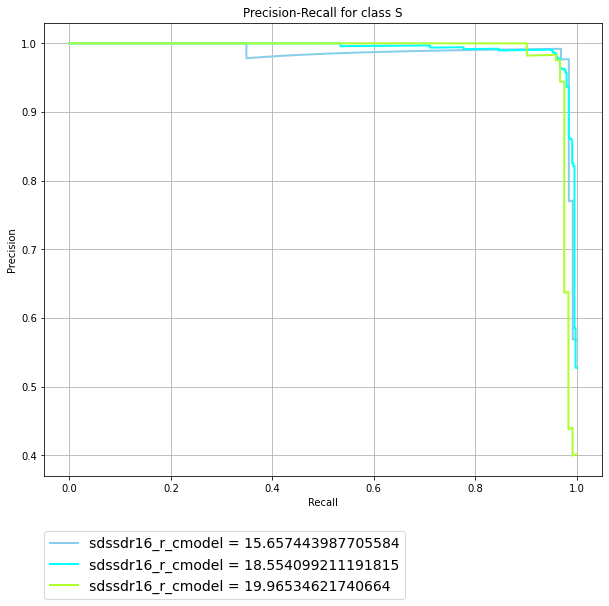

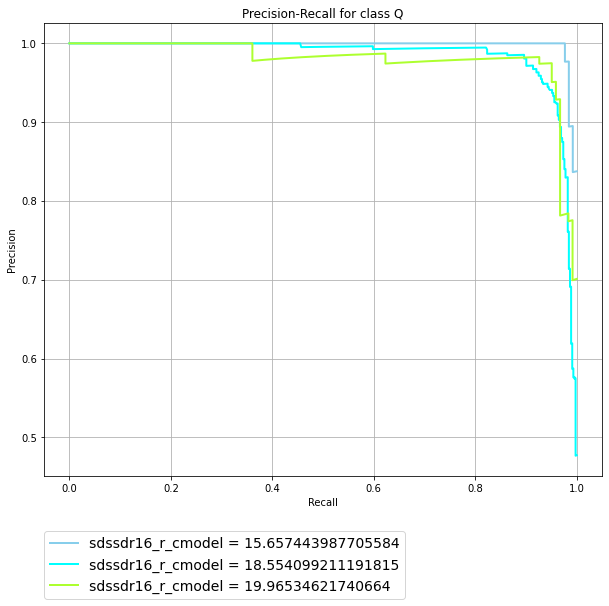

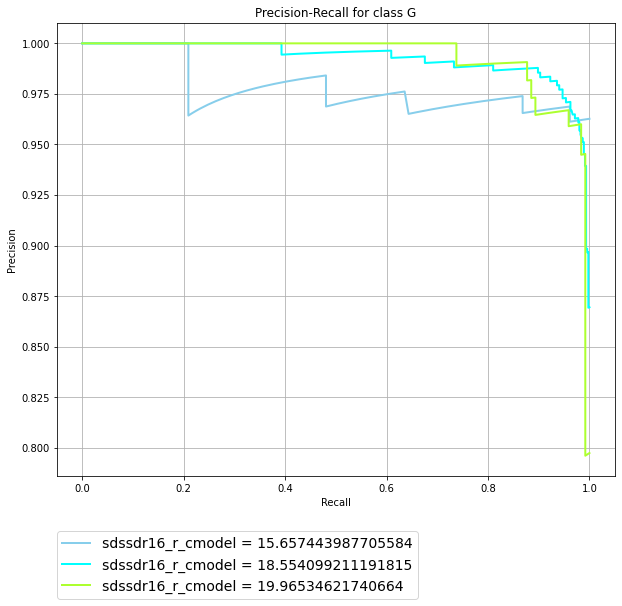

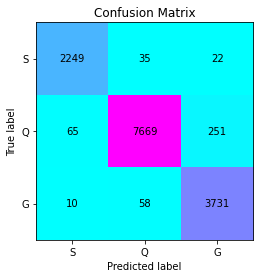

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_little/psdr2+all_decals8tr уже существует
psdr2+all_decals8tr


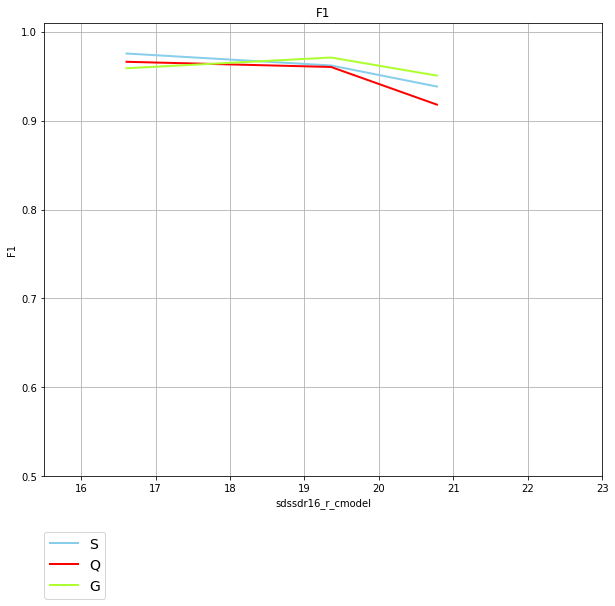

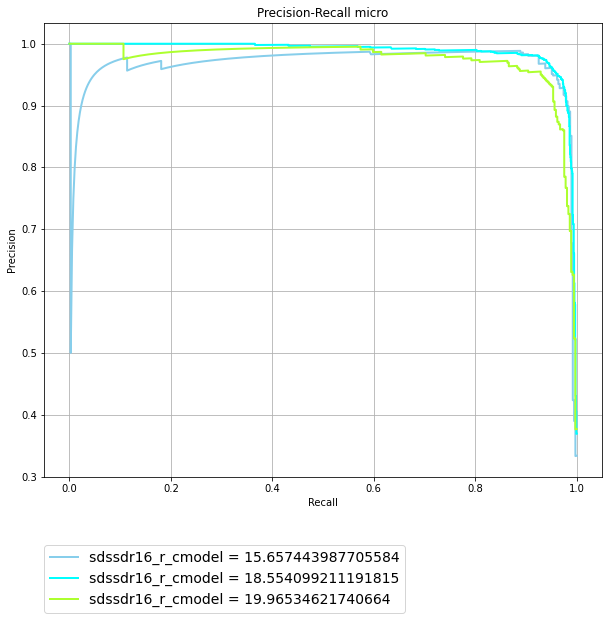

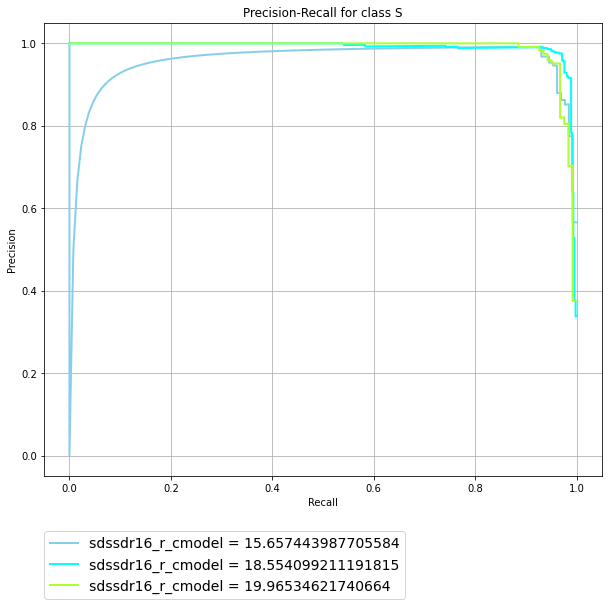

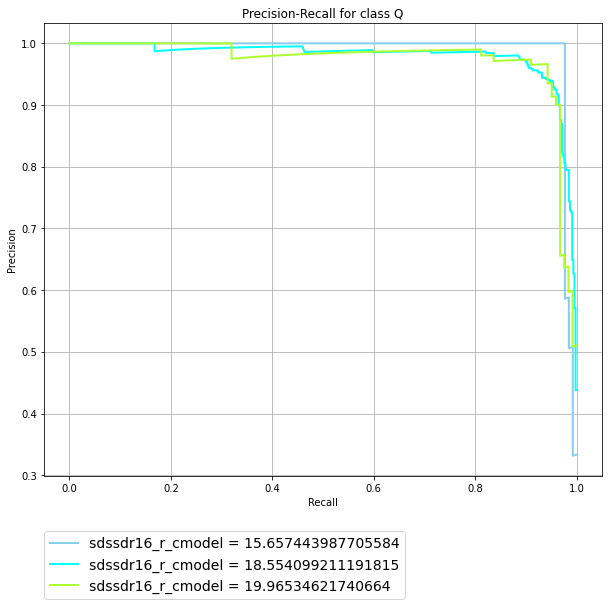

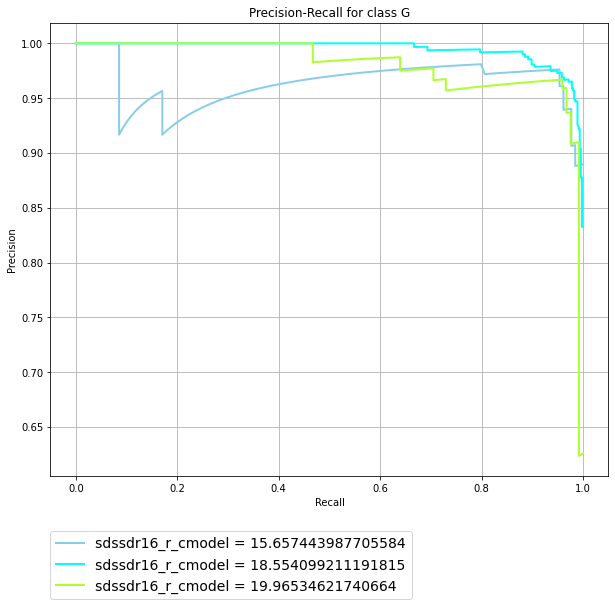

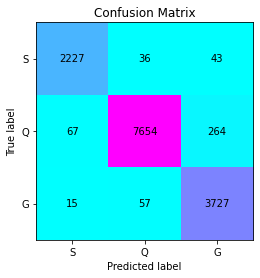

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_little/decals8tr уже существует
decals8tr


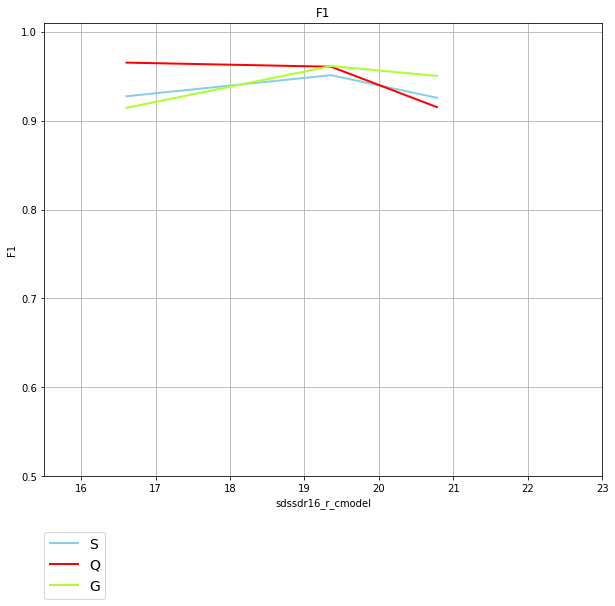

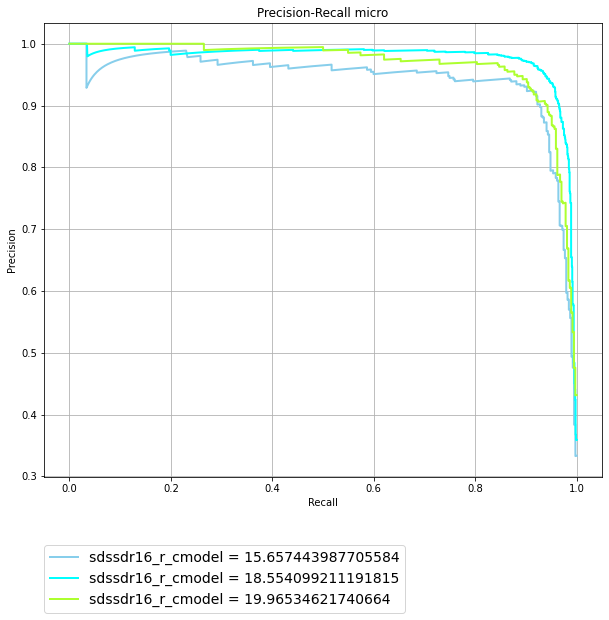

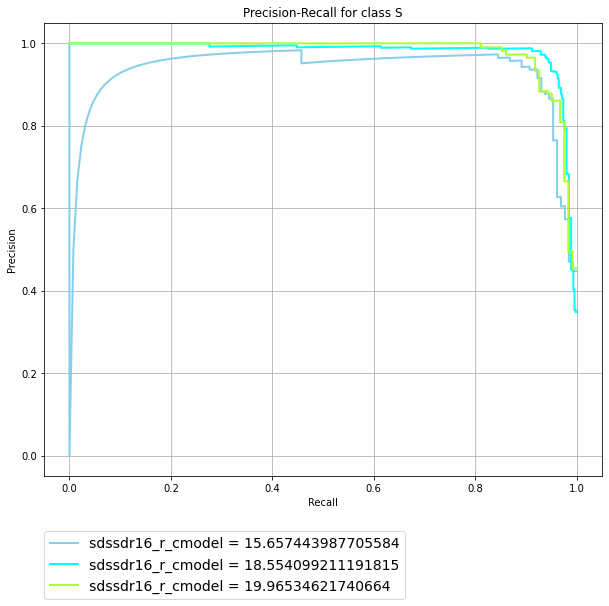

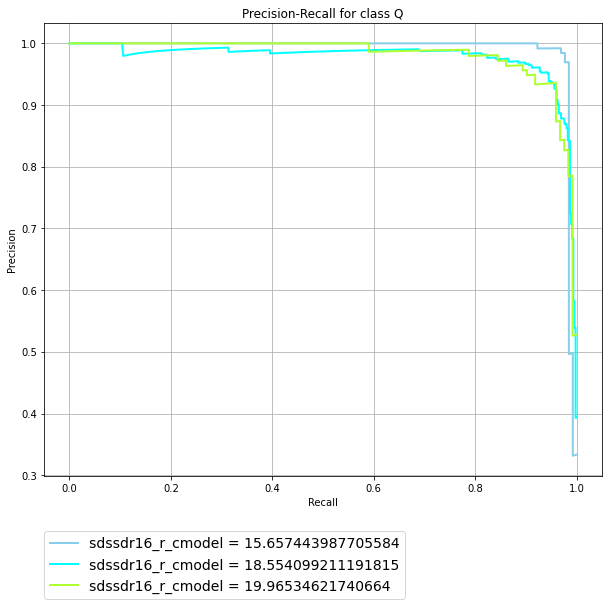

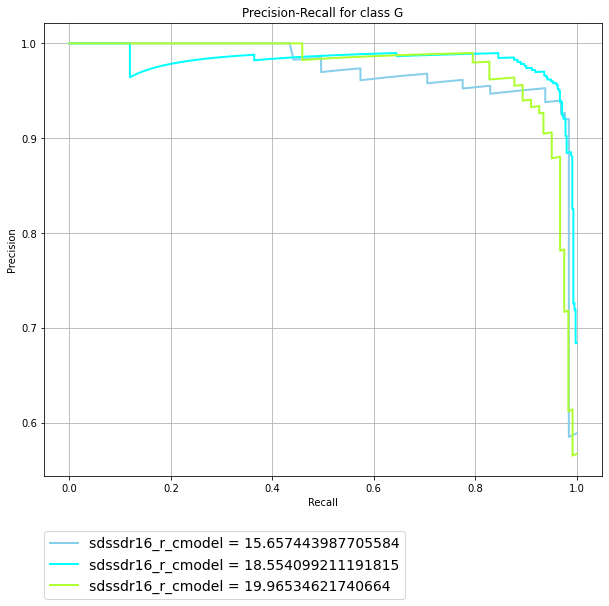

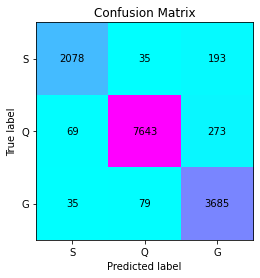

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_little/sdssdr16+psdr2+wise_decals8tr уже существует
sdssdr16+psdr2+wise_decals8tr


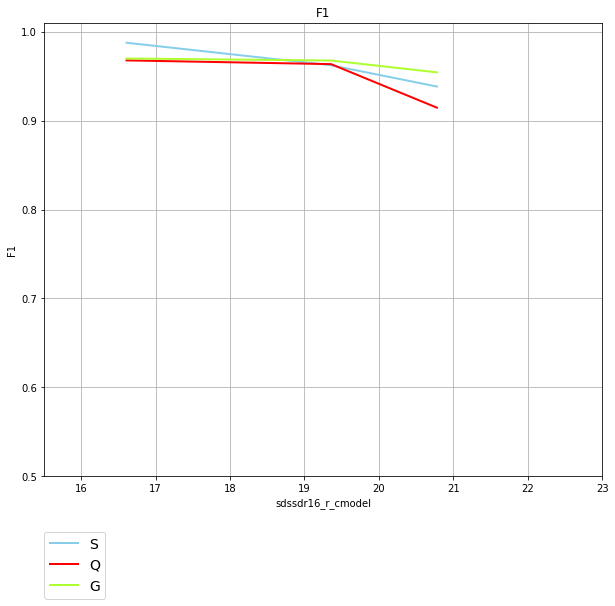

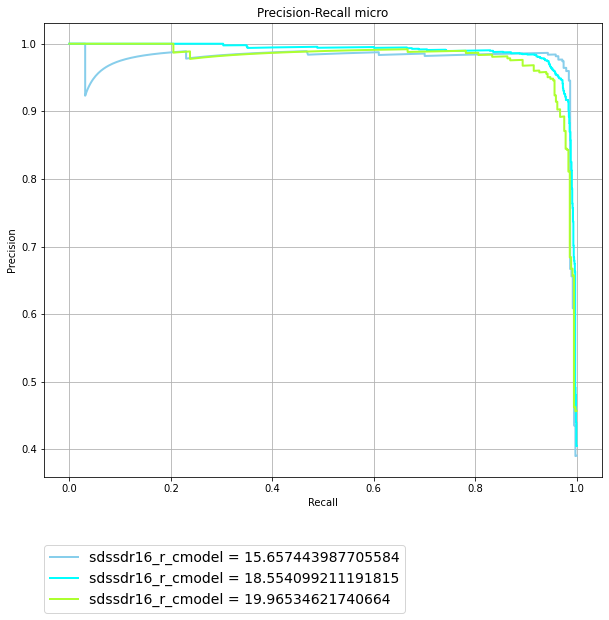

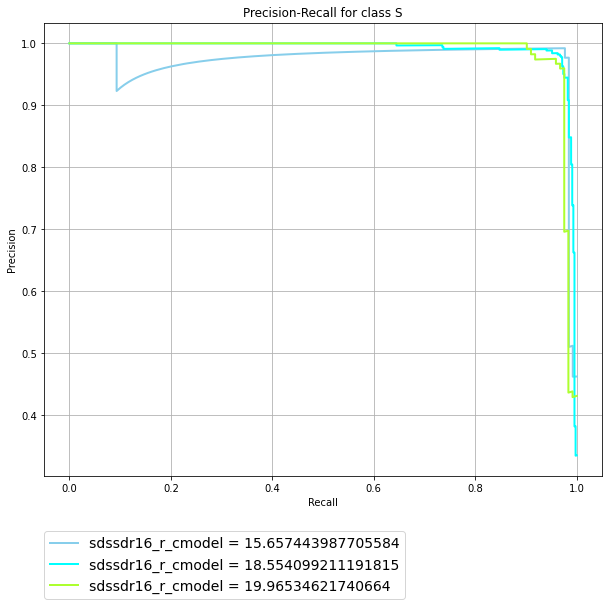

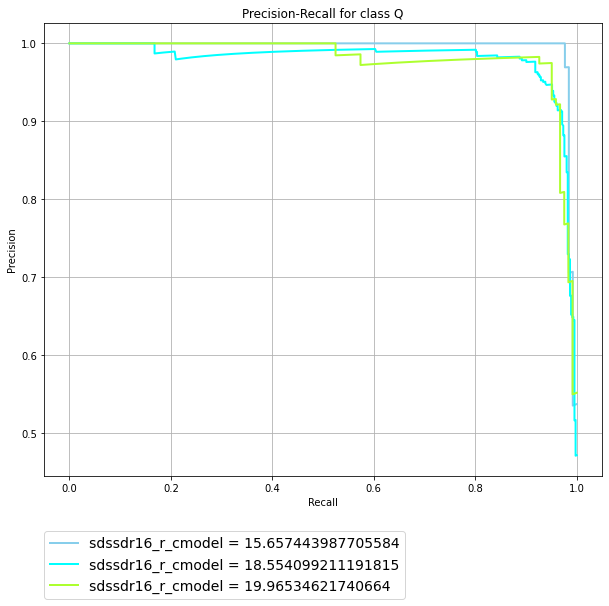

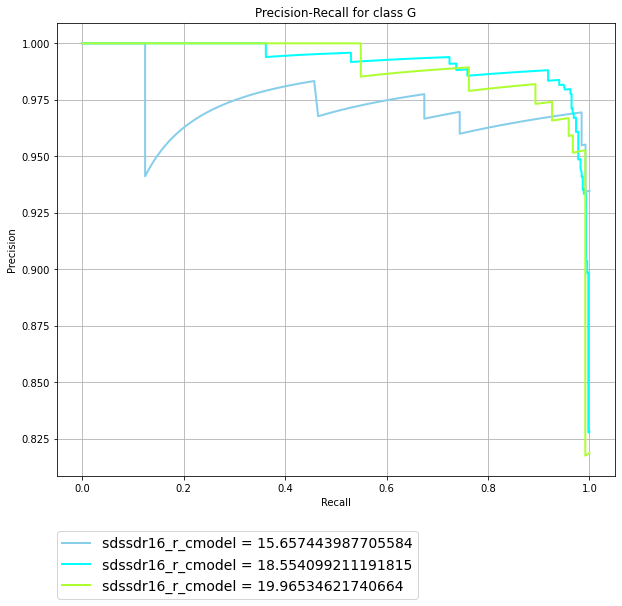

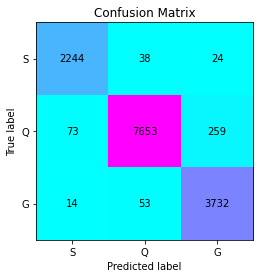

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_little/sdssdr16+psdr2+all_decals8tr уже существует
sdssdr16+psdr2+all_decals8tr


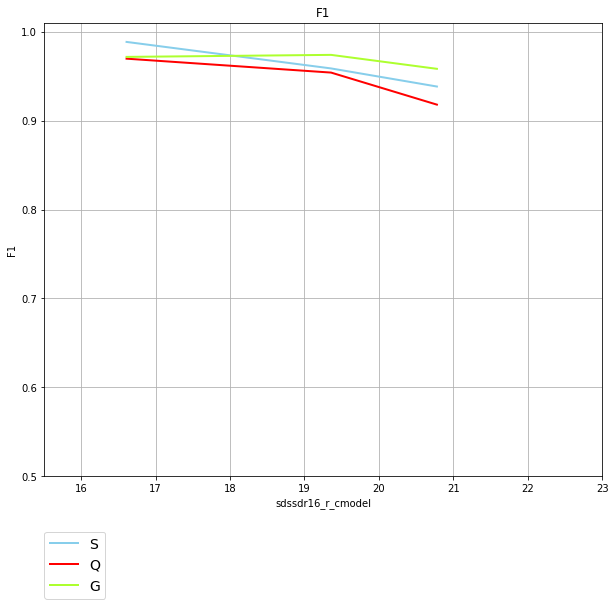

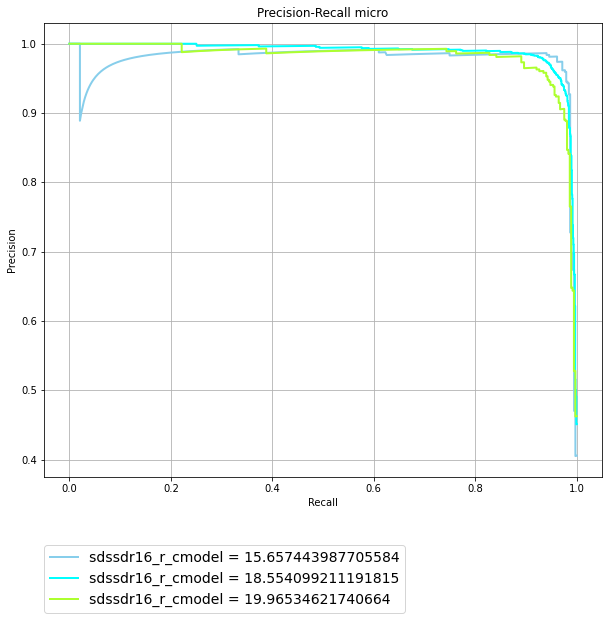

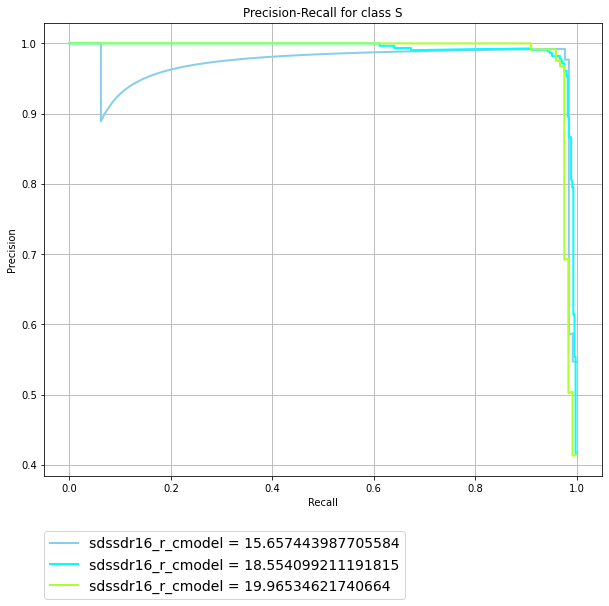

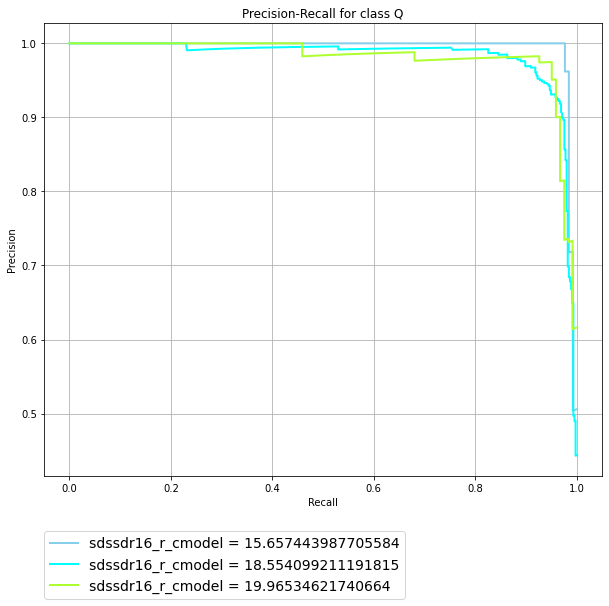

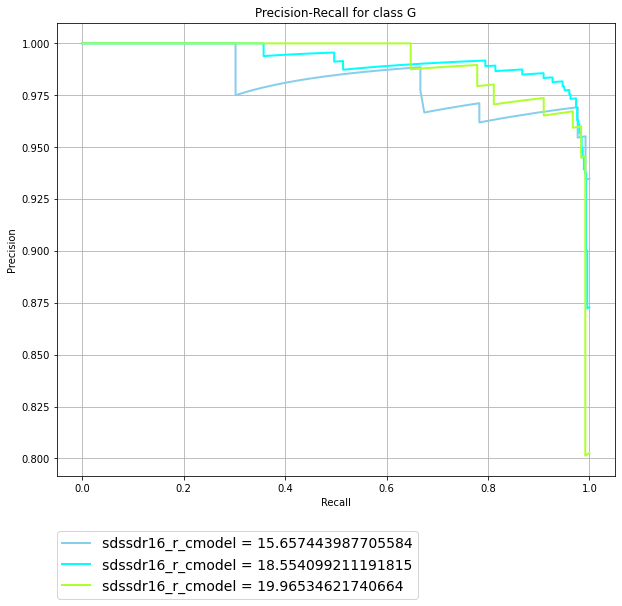

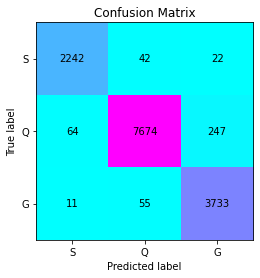

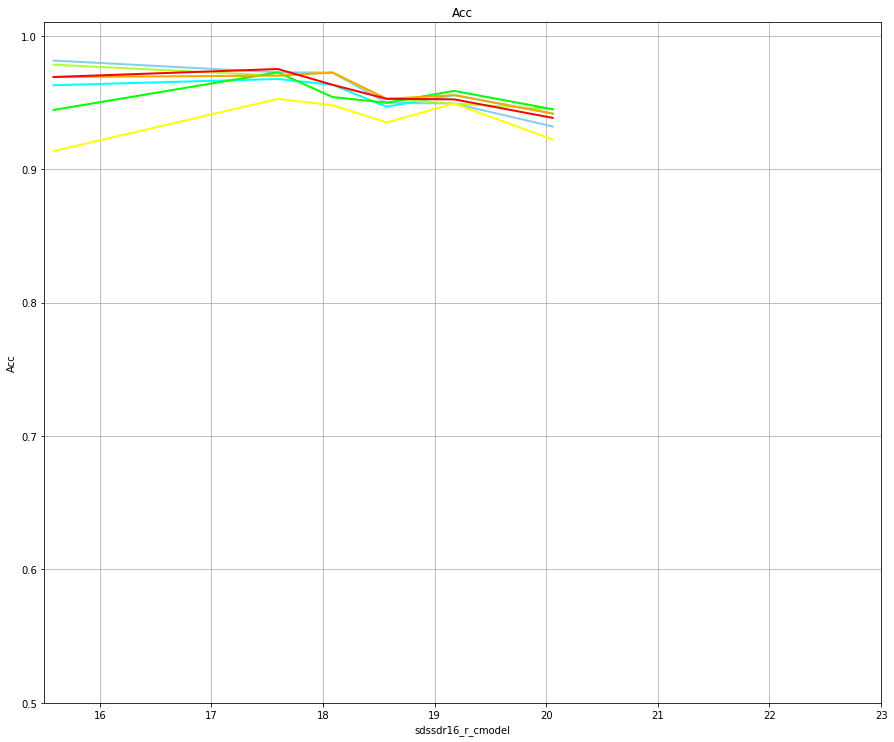

In [ ]:
accuracy = dict()
brightness = dict()

import os
path = "/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_little"

try:
    os.makedirs(path)
except FileExistsError:
  print("Директория %s уже существует" % path) 
except OSError:
    print ("Создать директорию %s не удалось" % path)
    exit()

for overview in f.keys():
  path = f"/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_little/{overview}"
  try:
      os.makedirs(path)
  except FileExistsError:
    print("Директория %s уже существует" % path)
  except OSError:
      print("Создать директорию %s не удалось" % path)
      exit()

  print(overview)

  X1, y1 = df1[[column]+f[overview]].values, df1['class'].values #X1, X2 - выборка из больших данных
  X2, y2 = df2[[column]+f[overview]].values, df2['class'].values


  gb = joblib.load('/content/drive/MyDrive/Научная работа/Data/X-ray/gb_big/model_'+overview+'_big.pkl')#были обучены на маленьком датасете 
  robust = joblib.load('/content/drive/MyDrive/Научная работа/Data/X-ray/gb_big/'+overview+'_robust_for_gb_big.pkl')
  #print(robust.transform(X1[:, 1:]))

  F1_plot_class(X1, y1, X2, y2, gb, gb, robust, robust, column, f'{path}/{overview}_gb_on_little_')
  Prediction_Recall_plot(X1, y1, X2, y2, gb, gb, robust, robust, column, f'{path}/{overview}_gb_on_little_')
  Confusion_Matrix(X1, y1, X2, y2, gb, gb, robust, robust, column, f'{path}/{overview}_gb_on_little_')
  acc, r = choseAcc_2cv(X2, y2, X1, y1, gb, gb, 100, robust, robust, accuracy_score)
  acc = np.array(acc).T
  accuracy[overview] = acc
  brightness[overview] = r

plt.figure(figsize=(15, 15))
lines = []
labels = []
clr = ['skyblue', 'aqua', 'greenyellow', 'lime', 'yellow', 'orange', 'red', 'chocolate', 'darkorange', 'gold', 'springgreen', 'aquamarine',  'lightskyblue']

j=0
for overview in f.keys():
  l, = plt.plot(brightness[overview], accuracy[overview], color=clr[j], lw=2)
  lines.append(l)
  labels.append(f"Model {overview}")
  j+=1

fig = plt.gcf()
fig.subplots_adjust(bottom=0.25)
plt.xlabel(column)
plt.xlim(15.5, 23)
plt.ylim(0.5, 1.01)
plt.grid(True)
#plt.vlines(brightness[overview], 0.5, accuracy[overview], linestyles='dashed', label=brightness[overview], )
plt.ylabel('Acc')
plt.title('Acc')
#plt.legend(lines, labels, loc=(0, -0.32), prop=dict(size=14))
plt.savefig(f'/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_little/gb_on_little_accuracy.png')
plt.show()

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb уже существует
Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/sdssdr16+wise_decals8tr уже существует
sdssdr16+wise_decals8tr
100%|██████████| 50/50 [02:20<00:00,  2.80s/it, best loss: -0.9722991689750692]
({'colsample_bytree': 0.6601498085480597, 'min_child_samples': 43, 'min_child_weight': 0.4304569487776297, 'num_leaves': 1}, <hyperopt.base.Trials object at 0x7f017dbd7b10>)
1.3039984703063965
100%|██████████| 50/50 [02:24<00:00,  2.89s/it, best loss: -0.9709078906589573]
({'colsample_bytree': 0.8611678528881745, 'min_child_samples': 46, 'min_child_weight': 0.9170452233563957, 'num_leaves': 10}, <hyperopt.base.Trials object at 0x7f017ecf2710>)
0.829174280166626


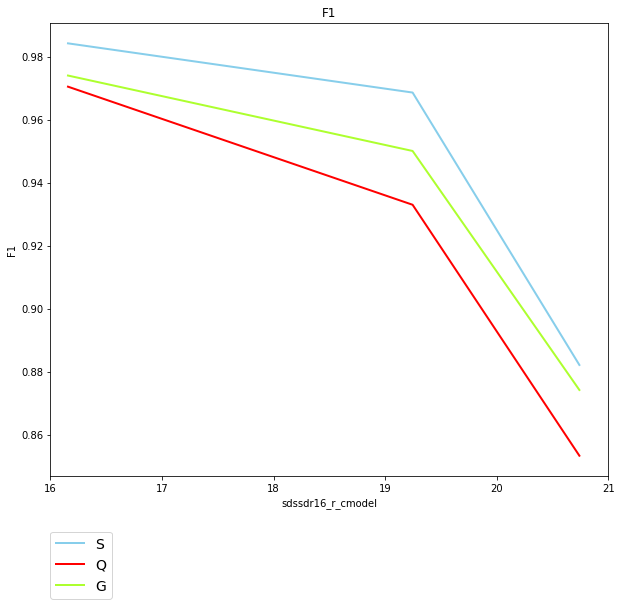

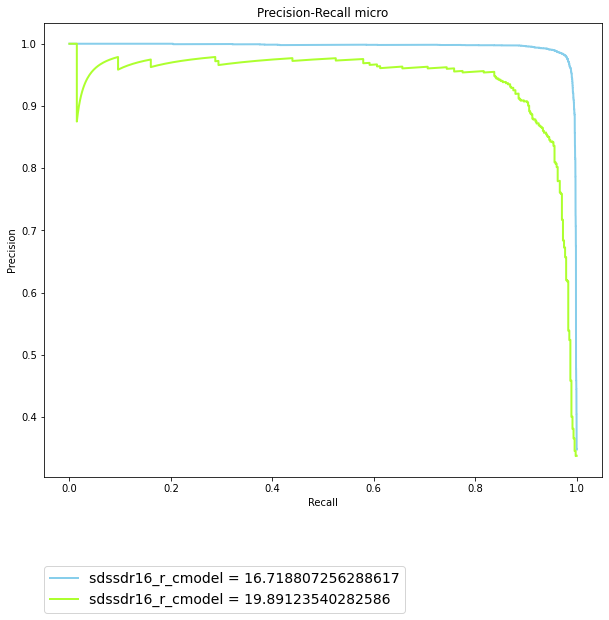

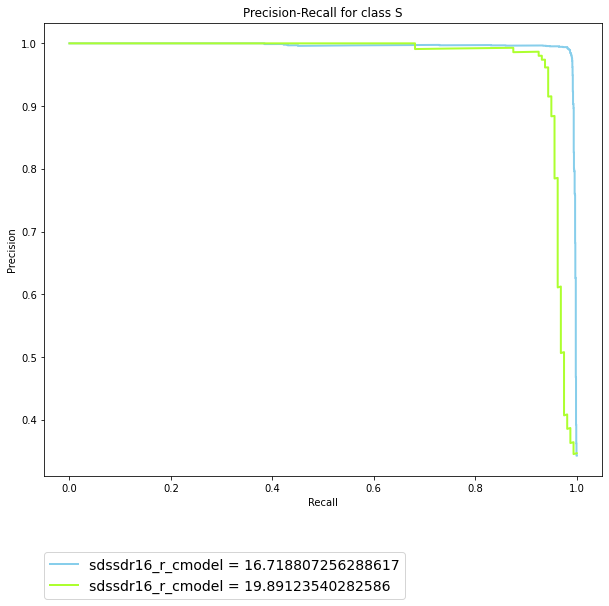

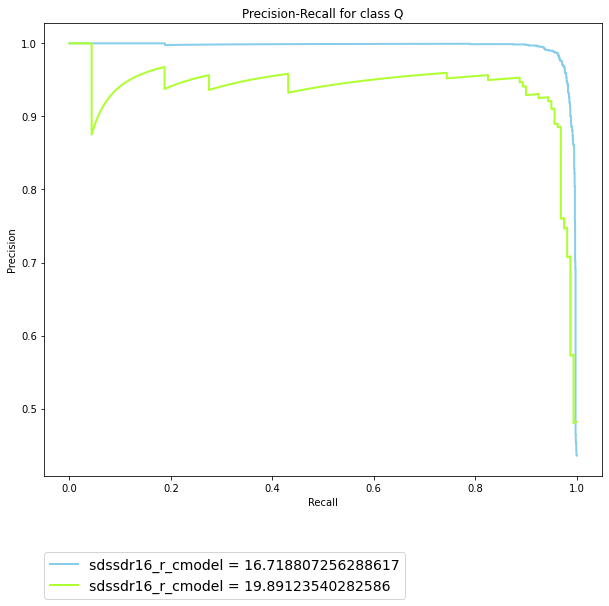

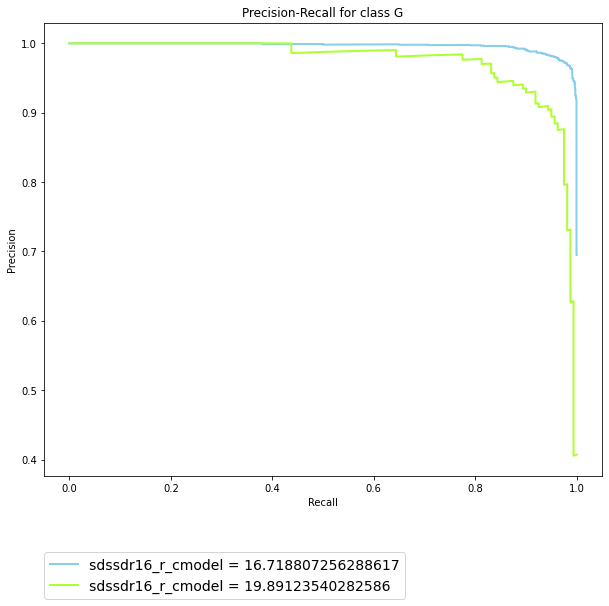

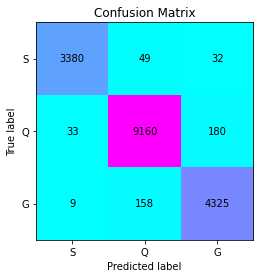

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/psdr2+wise_decals8tr уже существует
psdr2+wise_decals8tr
100%|██████████| 50/50 [02:07<00:00,  2.54s/it, best loss: -0.9722770665423875]
({'colsample_bytree': 0.725533263724273, 'min_child_samples': 48, 'min_child_weight': 0.5105609444621281, 'num_leaves': 20}, <hyperopt.base.Trials object at 0x7f017d61f810>)
0.7656729221343994
100%|██████████| 50/50 [02:03<00:00,  2.47s/it, best loss: -0.965630139028851]
({'colsample_bytree': 0.680382937701754, 'min_child_samples': 12, 'min_child_weight': 0.22737357870710515, 'num_leaves': 4}, <hyperopt.base.Trials object at 0x7f017d4f2b10>)
0.7199535369873047


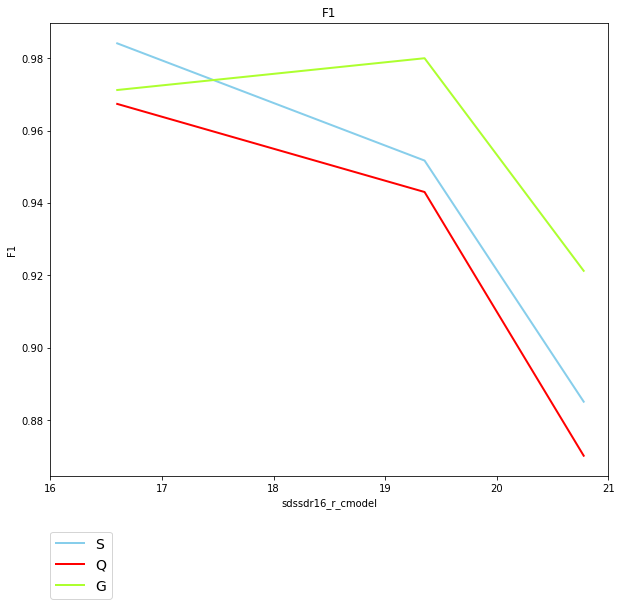

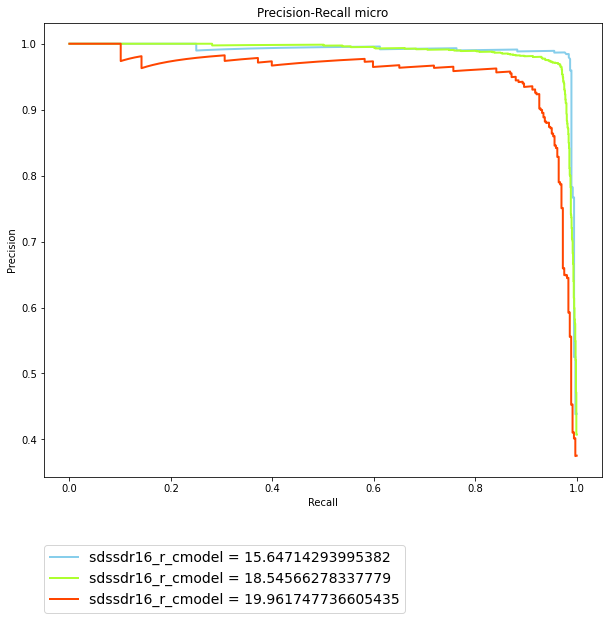

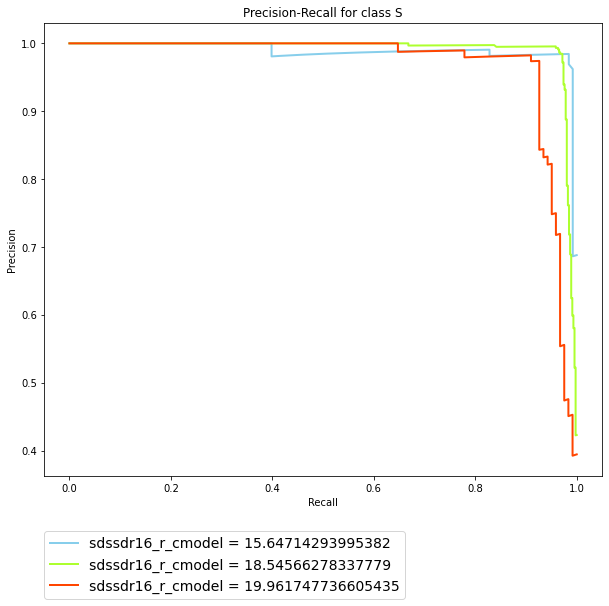

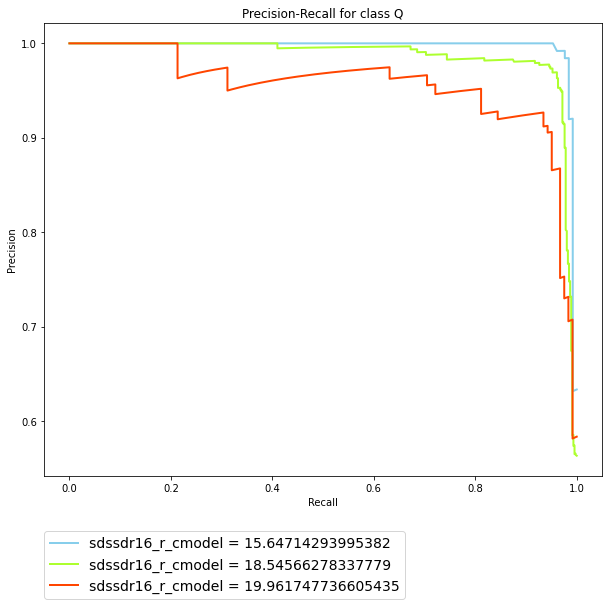

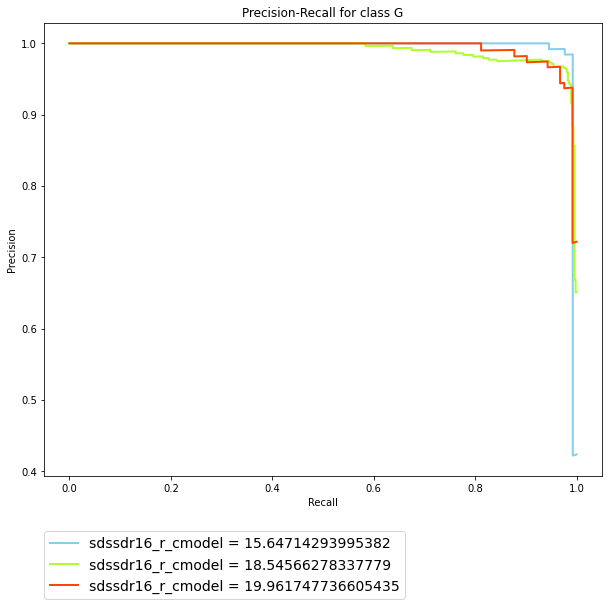

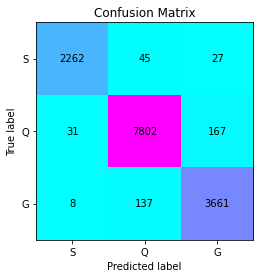

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/sdssdr16+all_decals8tr уже существует
sdssdr16+all_decals8tr
100%|██████████| 50/50 [02:48<00:00,  3.37s/it, best loss: -0.9722931607909536]
({'colsample_bytree': 0.7992048982855523, 'min_child_samples': 42, 'min_child_weight': 0.7687790705018078, 'num_leaves': 42}, <hyperopt.base.Trials object at 0x7f017d270f50>)
1.372154712677002
100%|██████████| 50/50 [02:46<00:00,  3.34s/it, best loss: -0.9712496422164439]
({'colsample_bytree': 0.8194551759641064, 'min_child_samples': 46, 'min_child_weight': 0.17453381693438208, 'num_leaves': 44}, <hyperopt.base.Trials object at 0x7f0181027d50>)
1.3656227588653564


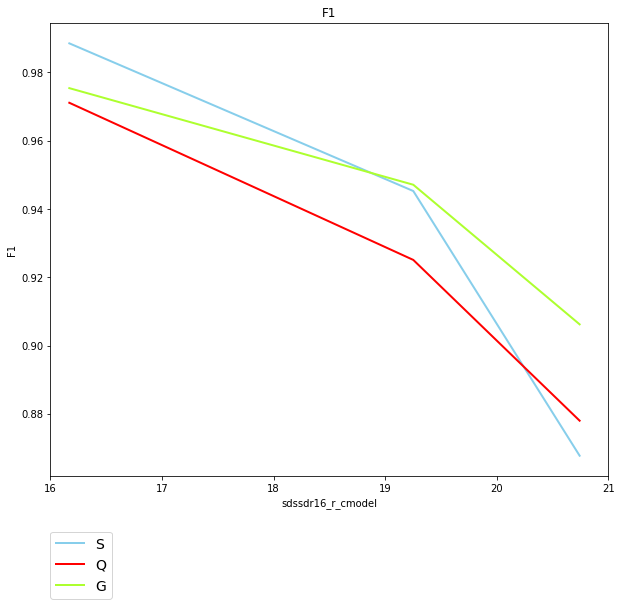

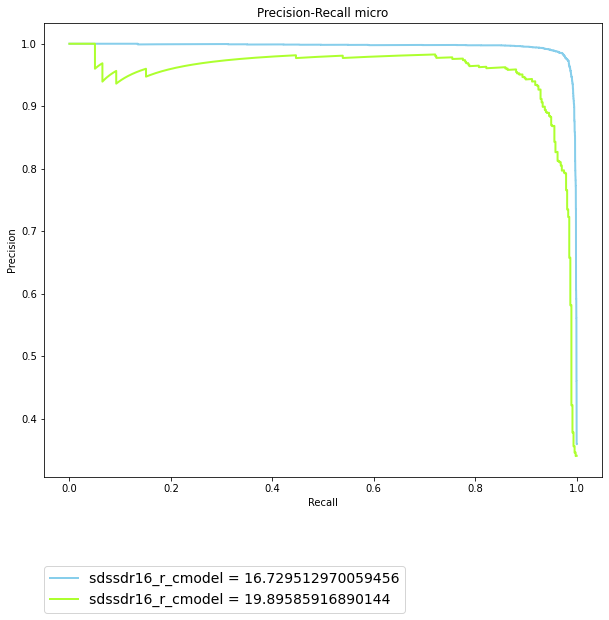

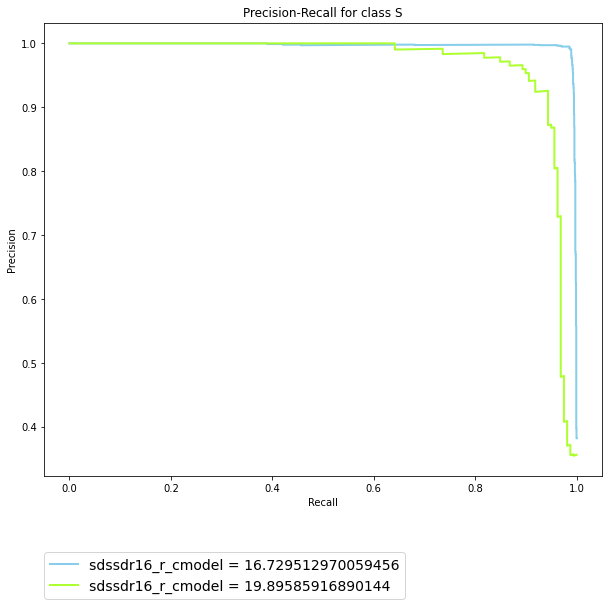

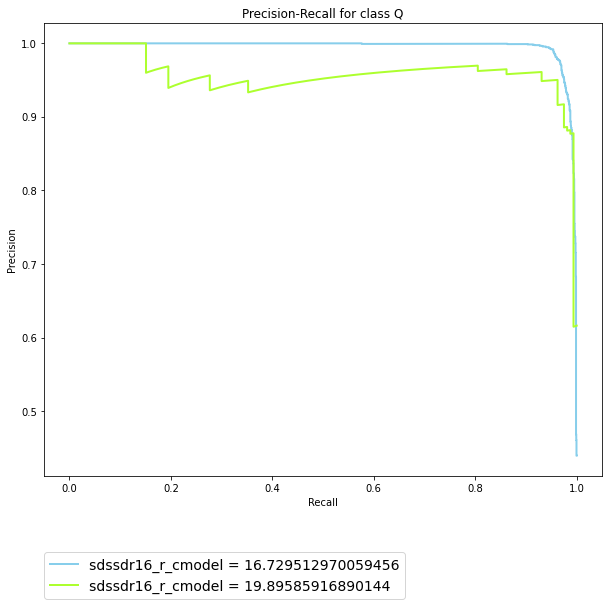

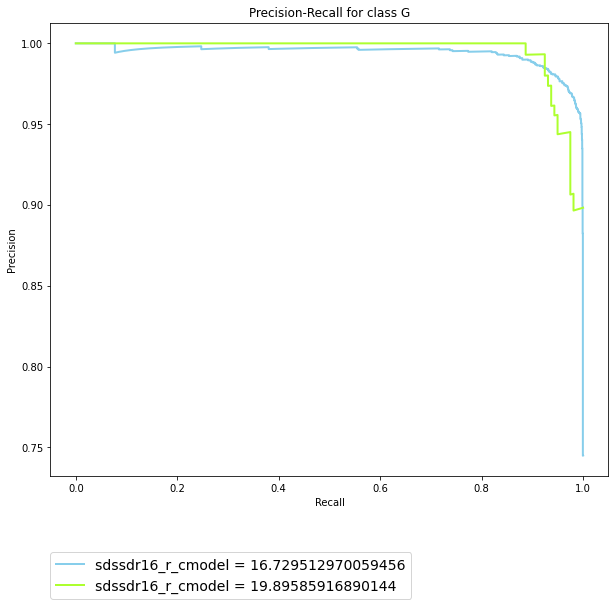

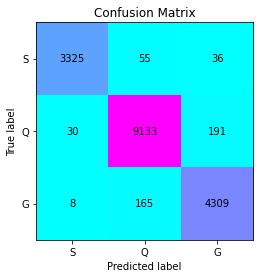

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/psdr2+all_decals8tr уже существует
psdr2+all_decals8tr
100%|██████████| 50/50 [02:10<00:00,  2.62s/it, best loss: -0.96693235658655]
({'colsample_bytree': 0.37426511224411896, 'min_child_samples': 7, 'min_child_weight': 0.049248274536130864, 'num_leaves': 54}, <hyperopt.base.Trials object at 0x7f017d45a250>)
1.1975939273834229
100%|██████████| 50/50 [02:30<00:00,  3.00s/it, best loss: -0.9710391822827938]
({'colsample_bytree': 0.6554987539556856, 'min_child_samples': 49, 'min_child_weight': 0.5555321488726581, 'num_leaves': 50}, <hyperopt.base.Trials object at 0x7f017d329550>)
1.1377434730529785


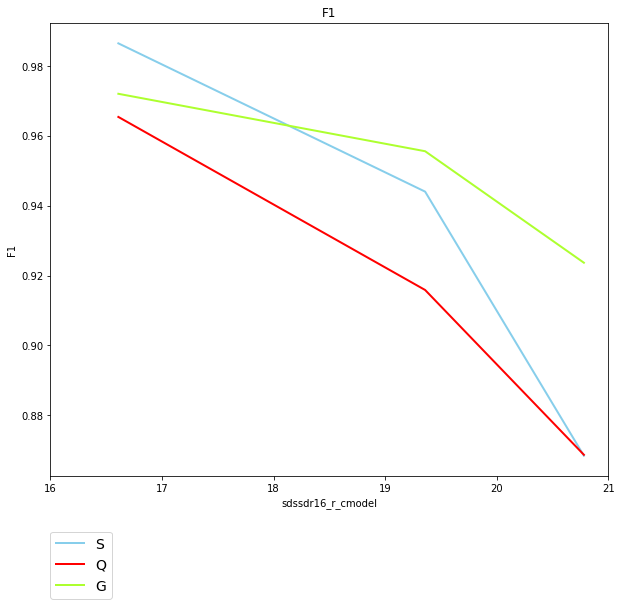

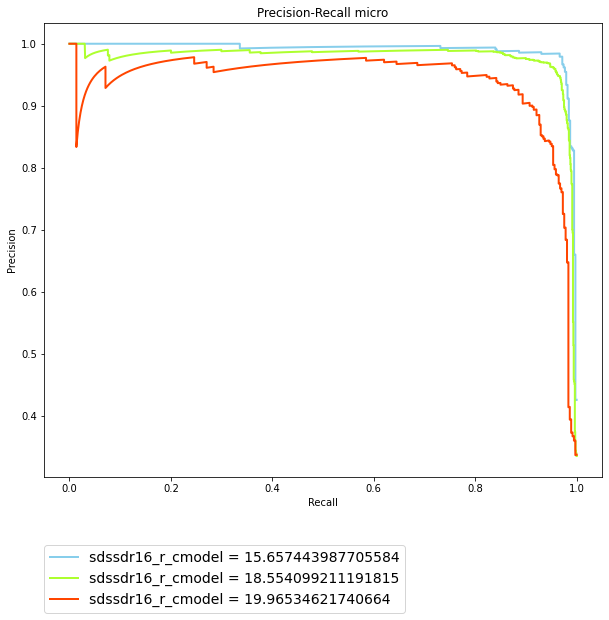

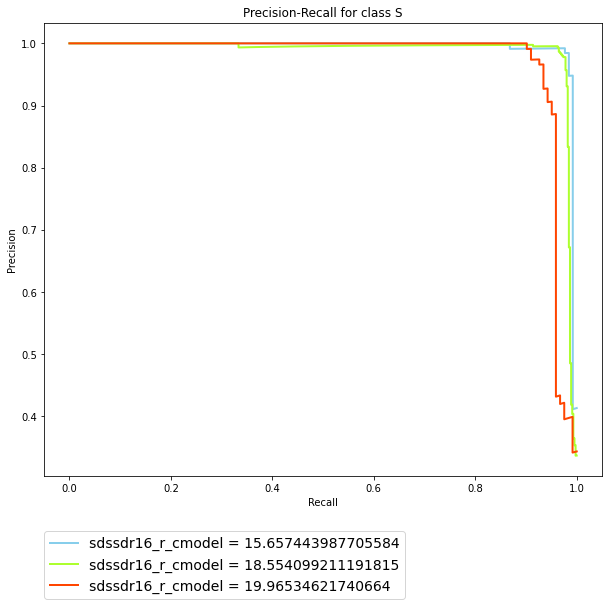

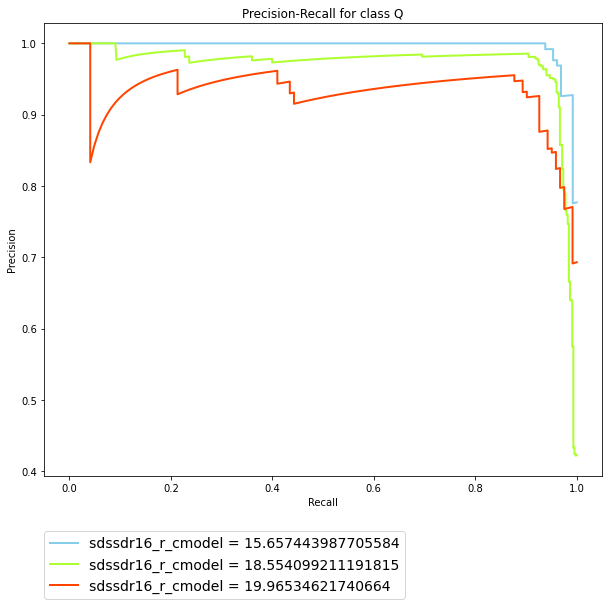

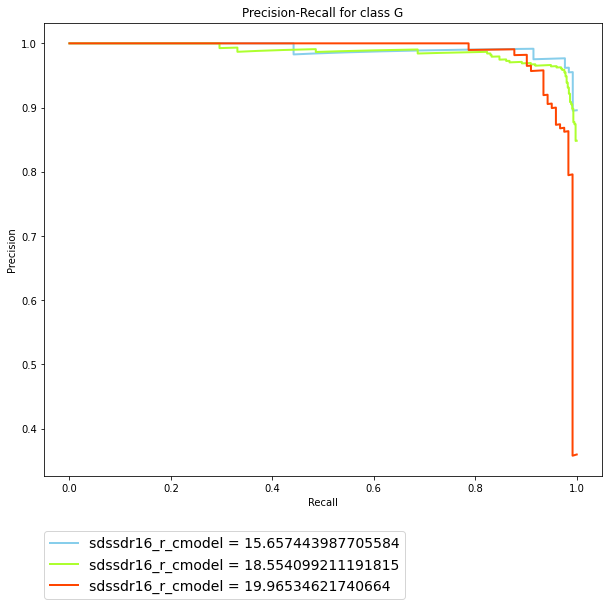

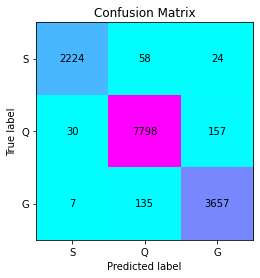

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/decals8tr уже существует
decals8tr
  0%|          | 0/50 [00:00<?, ?it/s, best loss: ?]

In [ ]:
accuracy = dict()
brightness = dict()

import os
path = "/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb"

try:
    os.makedirs(path)
except FileExistsError:
  print("Директория %s уже существует" % path) 
except OSError:
    print ("Создать директорию %s не удалось" % path)
    exit()

for overview in f.keys():
  path = f"/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/{overview}"
  try:
      os.makedirs(path)
  except FileExistsError:
    print("Директория %s уже существует" % path)
  except OSError:
      print("Создать директорию %s не удалось" % path)
      exit()

  print(overview)

  column = 'sdssdr16_r_cmodel'
  data1, data2 = data_split(df[['sdssdr16_r_cmodel']+f[overview]+label].dropna(), column=column, balance=False)
  X1, y1 = data1[:,:-1], data1[:,-1].astype('int')
  X2, y2 = data2[:,:-1], data2[:,-1].astype('int')
  gb1, robust1 = For_one(X1[:, 1:], y1, X2[:, 1:], y2)
  gb2, robust2 = For_one(X2[:, 1:], y2, X1[:, 1:], y1)

  F1_plot_class(X1, y1, X2, y2, gb1, gb2, robust1, robust2, column, f'{path}/{overview}_gb_')
  Prediction_Recall_plot(X1, y1, X2, y2, gb1, gb2, robust1, robust2, column, f'{path}/{overview}_gb_')
  Confusion_Matrix(X1, y1, X2, y2, gb1, gb2, robust1, robust2, column, f'{path}/{overview}_gb_')
  acc, r = choseAcc_2cv(X2, y2, X1, y1, gb1, gb2, 30, robust1, robust2, accuracy_score)
  acc = np.array(acc).T
  accuracy[overview] = acc
  brightness[overview] = r

plt.figure(figsize=(15, 15))
lines = []
labels = []
clr = ['skyblue', 'aqua', 'greenyellow', 'lime', 'yellow', 'orange', 'red', 'chocolate', 'darkorange', 'gold', 'springgreen', 'aquamarine',  'lightskyblue']

j=0
for overview in f.keys():
  l, = plt.plot(brightness[overview], accuracy[overview], color=clr[j], lw=2)
  lines.append(l)
  labels.append(f"Model {overview}")
  j+=1

fig = plt.gcf()
fig.subplots_adjust(bottom=0.25)
plt.xlabel(column)
plt.xlim(15.5, 21)
plt.ylim(0.5, 1.01)
plt.ylabel('Acc')
plt.title('Acc')
#plt.legend(lines, labels, loc=(0, -0.32), prop=dict(size=14))
plt.savefig(f"/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb/gb_accuracy.png")
plt.show()

#На большой выборке

In [ ]:
import gzip
import pickle
classes = {'STAR': 1, 'QSO':2, 'GALAXY':3}


path = '/content/drive/MyDrive/Научная работа/Data/Main/data/cv0_0/cv0.gz_pkl'
with gzip.open(path, 'rb') as fin:
    df1 = pickle.load(fin)
    df1 = df1[[column] + features + ['class']].dropna()

path = '/content/drive/MyDrive/Научная работа/Data/Main/data/cv0_1/cv1.gz_pkl'
with gzip.open(path, 'rb') as fin:
    df2 = pickle.load(fin)
    df2= df2[[column] + features + ['class']].dropna()

In [ ]:
df1.replace({'class':classes}, inplace = True)
df2.replace({'class':classes}, inplace = True)

##GB на самом себе

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_big уже существует
Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_big/sdssdr16+wise_decals8tr уже существует
sdssdr16+wise_decals8tr
100%|██████████| 20/20 [03:32<00:00, 10.62s/it, best loss: -0.9675666666666666]
({'colsample_bytree': 0.5405859405326064, 'min_child_samples': 24, 'min_child_weight': 0.3093662560347454, 'num_leaves': 44}, <hyperopt.base.Trials object at 0x7ff9a014b690>)
3.866724967956543
100%|██████████| 20/20 [03:08<00:00,  9.43s/it, best loss: -0.9706]
({'colsample_bytree': 0.7142086867400973, 'min_child_samples': 28, 'min_child_weight': 0.6309198574695141, 'num_leaves': 23}, <hyperopt.base.Trials object at 0x7ff99d7e7850>)
3.55820369720459


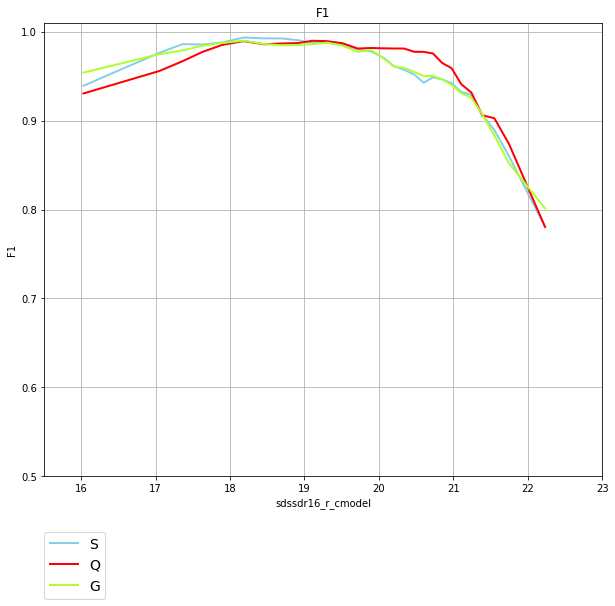

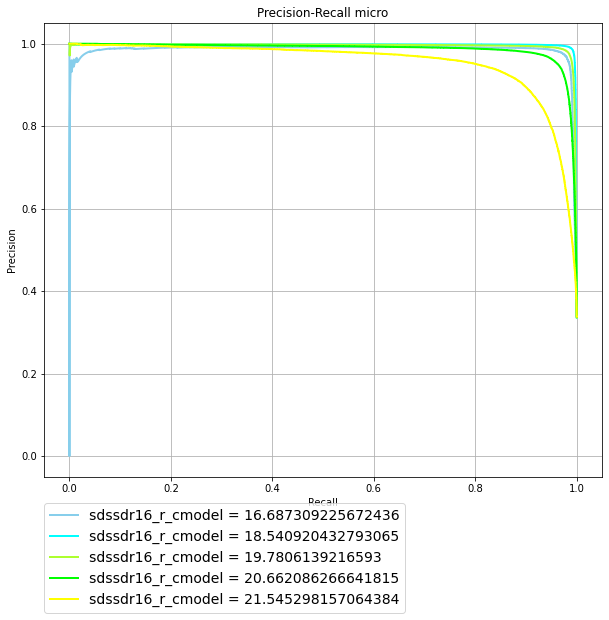

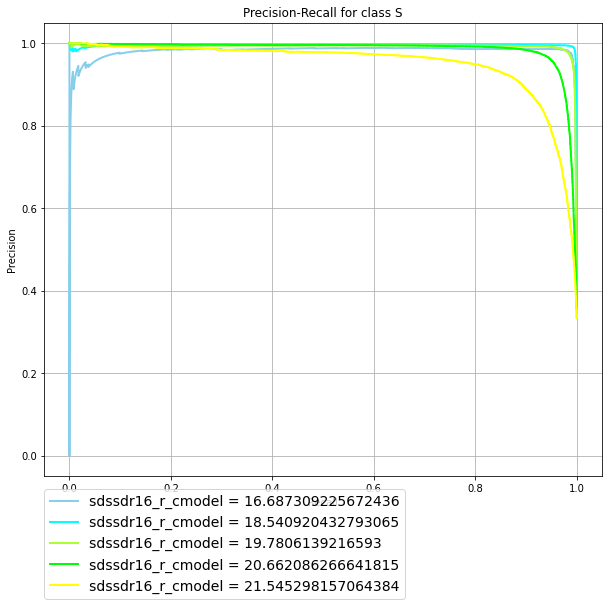

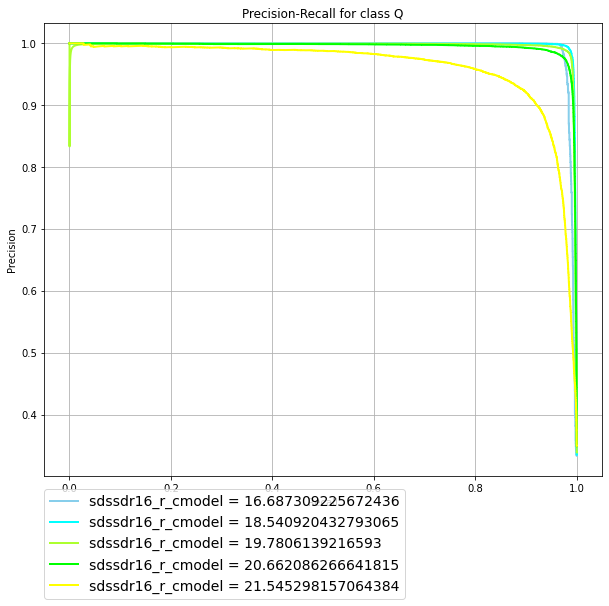

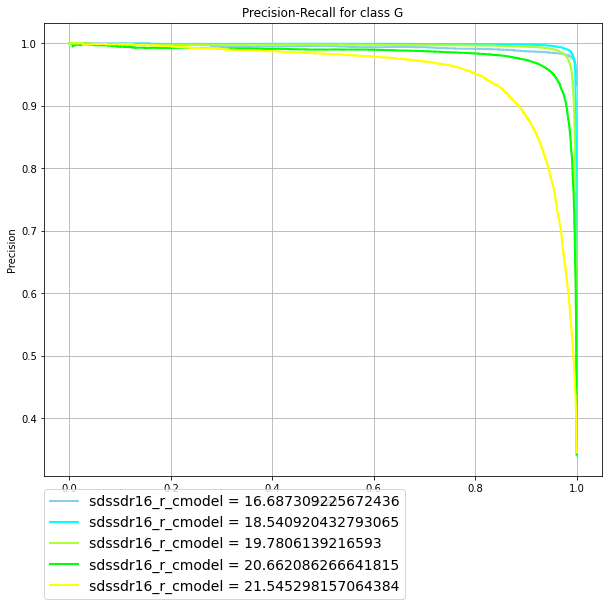

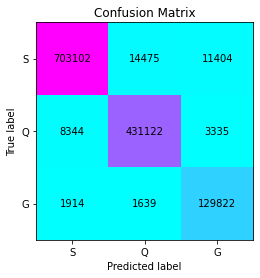

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_big/psdr2+wise_decals8tr уже существует
psdr2+wise_decals8tr
100%|██████████| 20/20 [03:39<00:00, 10.98s/it, best loss: -0.9689333333333333]
({'colsample_bytree': 0.6821142900490245, 'min_child_samples': 27, 'min_child_weight': 0.16557231037151723, 'num_leaves': 78}, <hyperopt.base.Trials object at 0x7ff949e4b750>)
4.183943748474121
100%|██████████| 20/20 [02:56<00:00,  8.85s/it, best loss: -0.9698666666666665]
({'colsample_bytree': 0.45520224848112534, 'min_child_samples': 12, 'min_child_weight': 0.9329756821514763, 'num_leaves': 10}, <hyperopt.base.Trials object at 0x7ff991f08310>)
3.3086657524108887


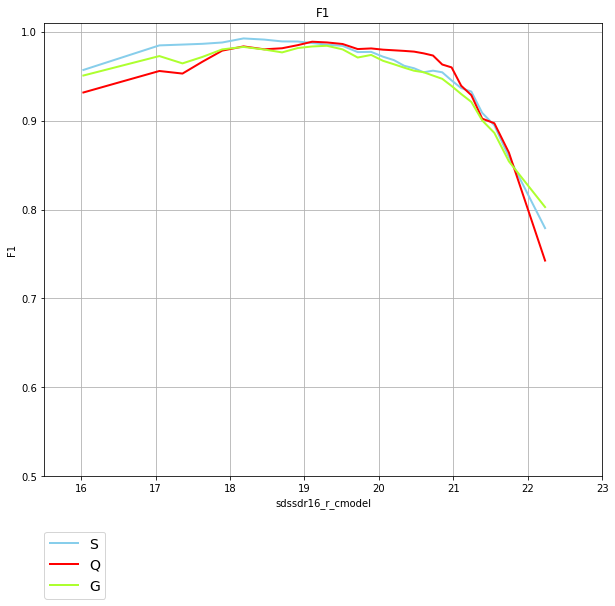

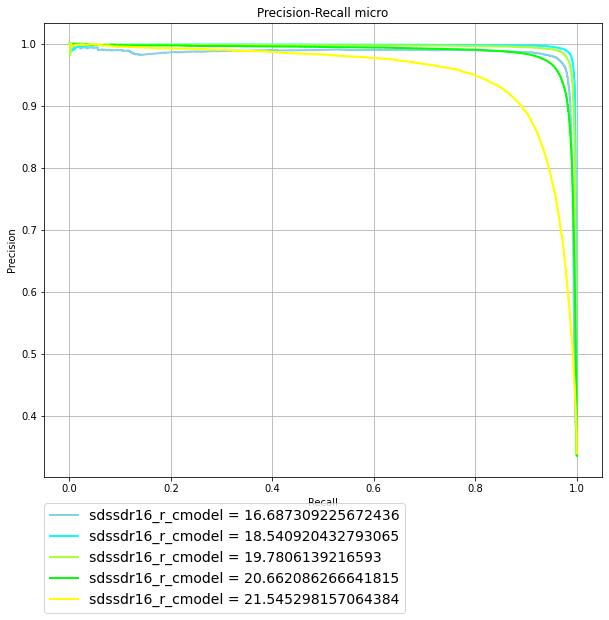

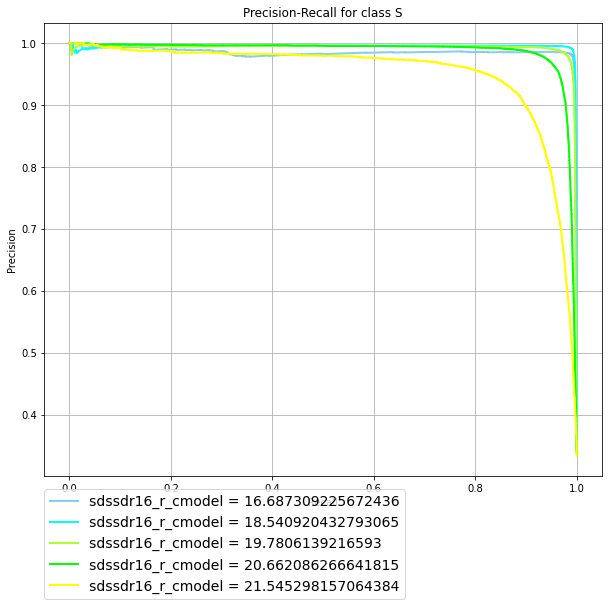

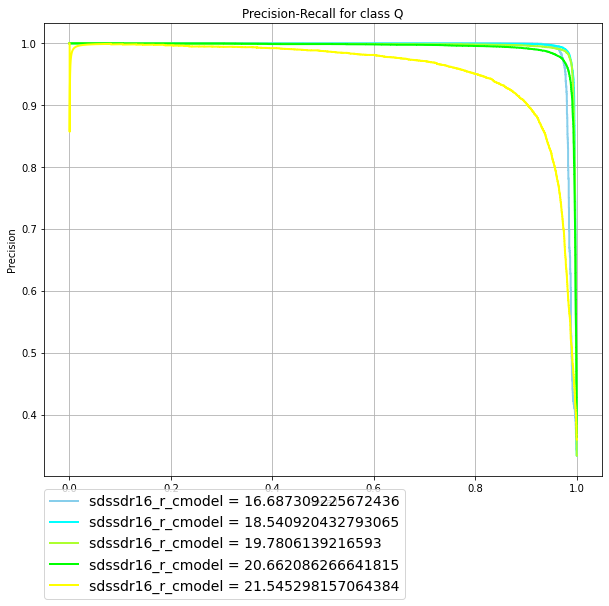

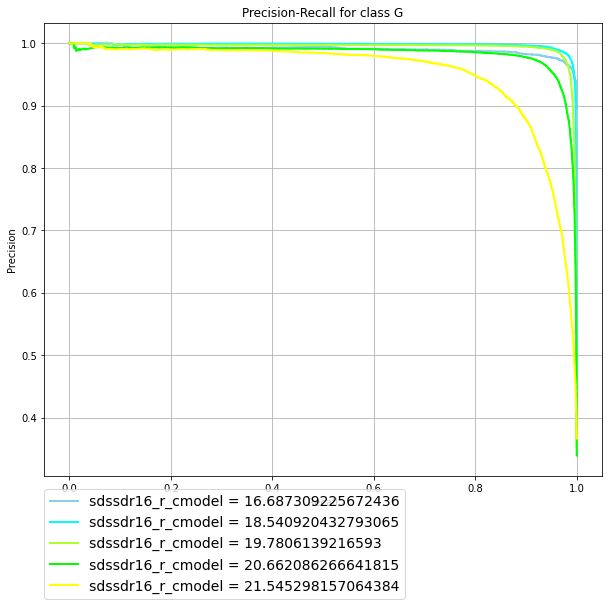

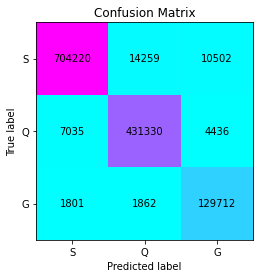

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_big/sdssdr16+all_decals8tr уже существует
sdssdr16+all_decals8tr
100%|██████████| 20/20 [03:50<00:00, 11.52s/it, best loss: -0.9741666666666667]
({'colsample_bytree': 0.6561044882154408, 'min_child_samples': 4, 'min_child_weight': 0.5987750050649313, 'num_leaves': 13}, <hyperopt.base.Trials object at 0x7ff99bcc0a10>)
5.151588439941406
100%|██████████| 20/20 [03:42<00:00, 11.12s/it, best loss: -0.9759000000000001]
({'colsample_bytree': 0.6254492867149692, 'min_child_samples': 49, 'min_child_weight': 0.23272789434670973, 'num_leaves': 13}, <hyperopt.base.Trials object at 0x7ff9910bbb10>)
4.172333717346191


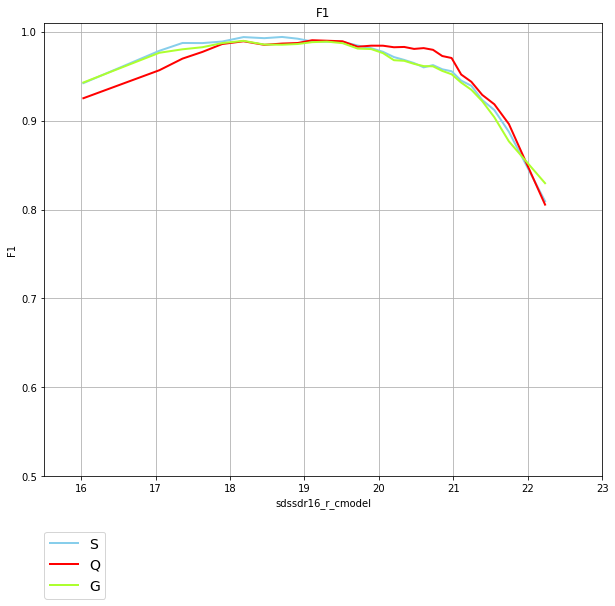

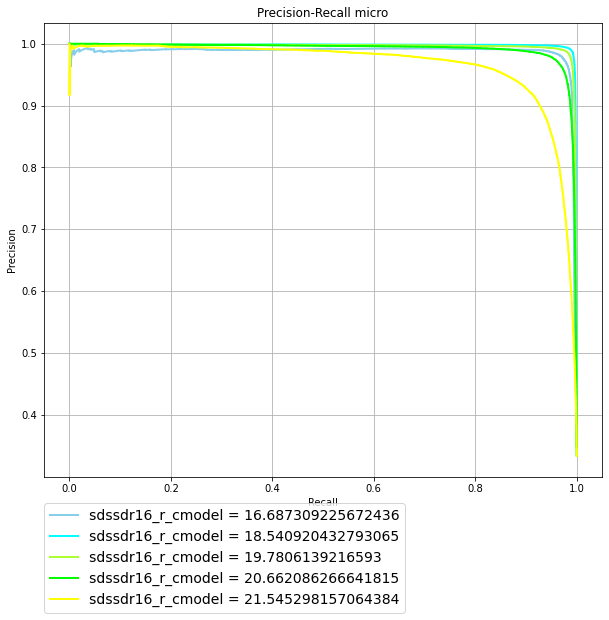

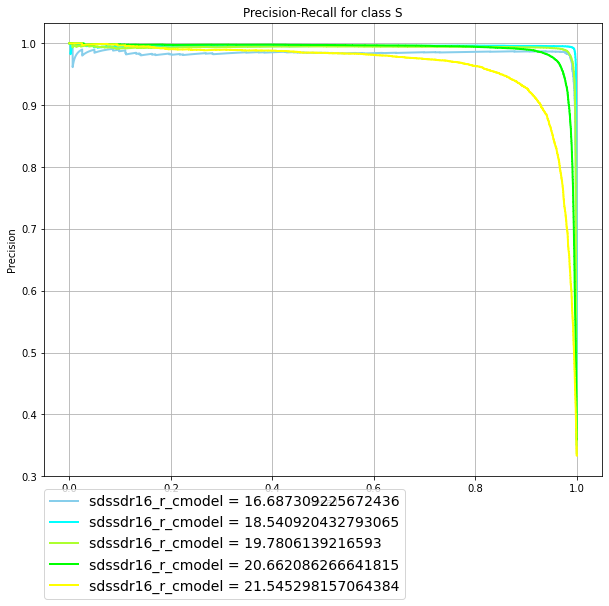

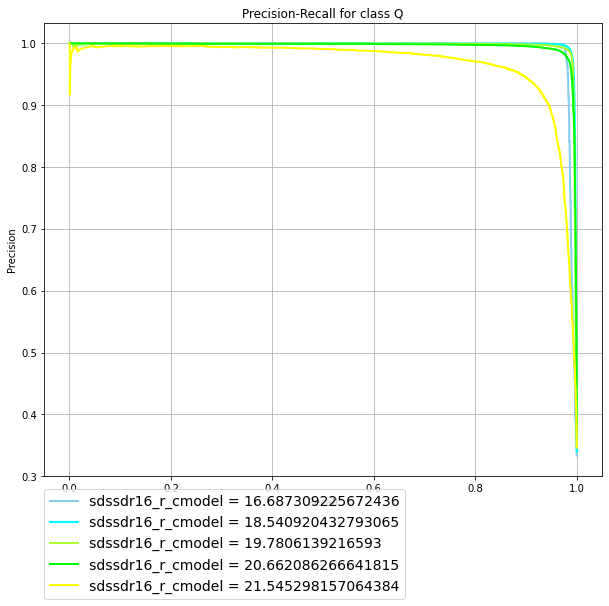

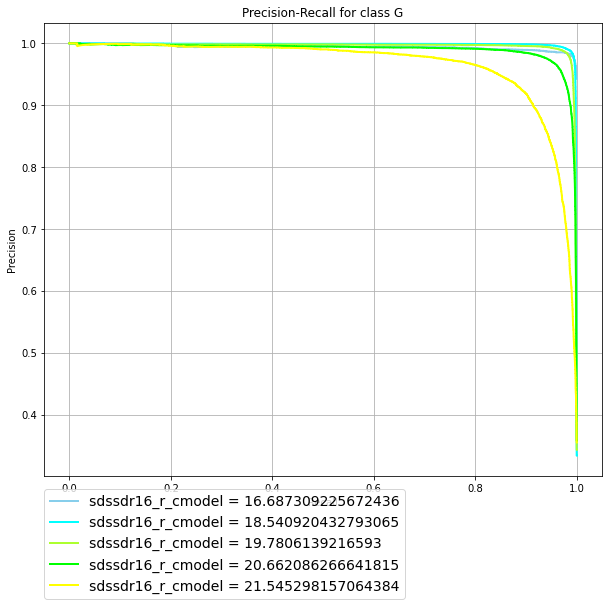

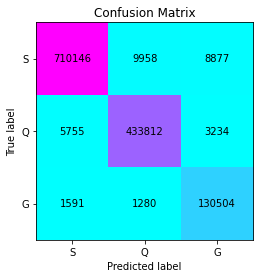

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_big/psdr2+all_decals8tr уже существует
psdr2+all_decals8tr
100%|██████████| 20/20 [03:31<00:00, 10.58s/it, best loss: -0.9728333333333333]
({'colsample_bytree': 0.2419188964024402, 'min_child_samples': 43, 'min_child_weight': 0.03732768666089158, 'num_leaves': 34}, <hyperopt.base.Trials object at 0x7ff99e20bc90>)
4.480181932449341
100%|██████████| 20/20 [03:38<00:00, 10.91s/it, best loss: -0.9738333333333333]
({'colsample_bytree': 0.263912715455178, 'min_child_samples': 17, 'min_child_weight': 0.8949910379573808, 'num_leaves': 32}, <hyperopt.base.Trials object at 0x7ff99e20bc90>)
3.7547125816345215


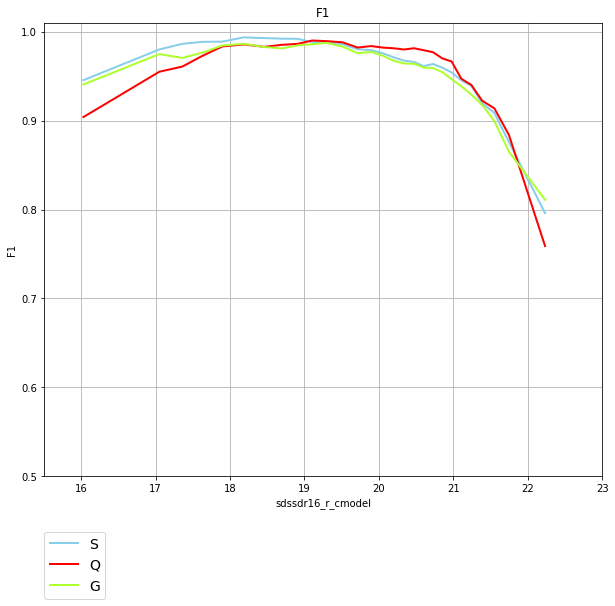

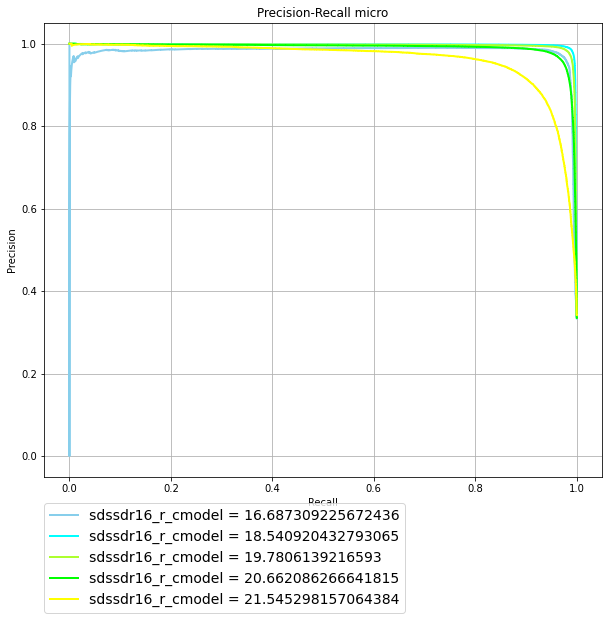

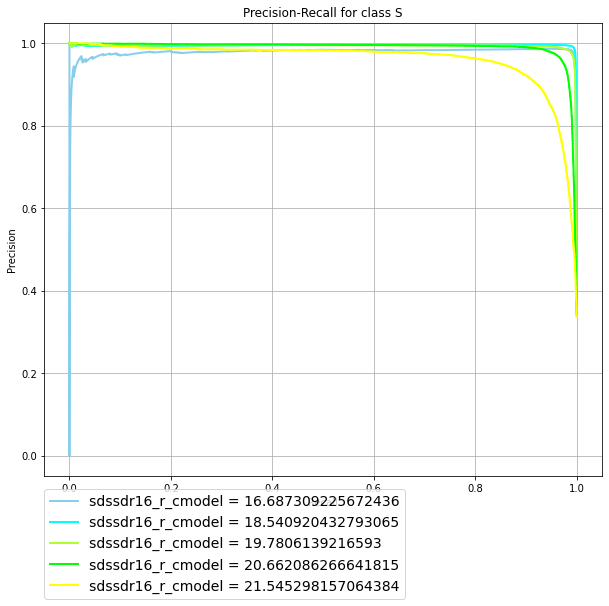

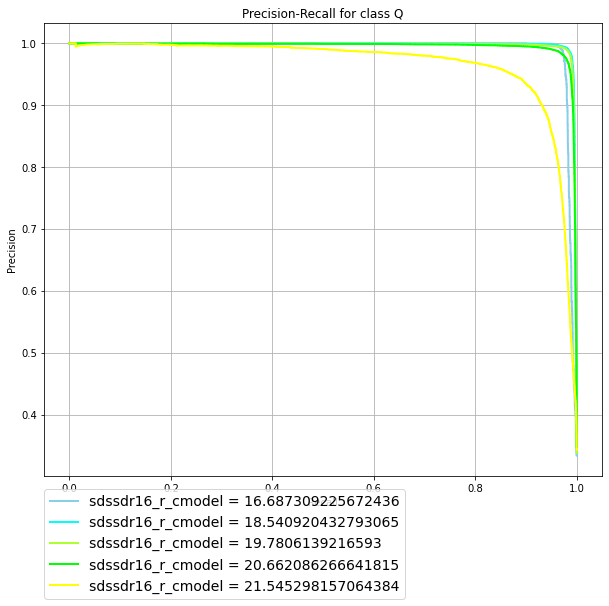

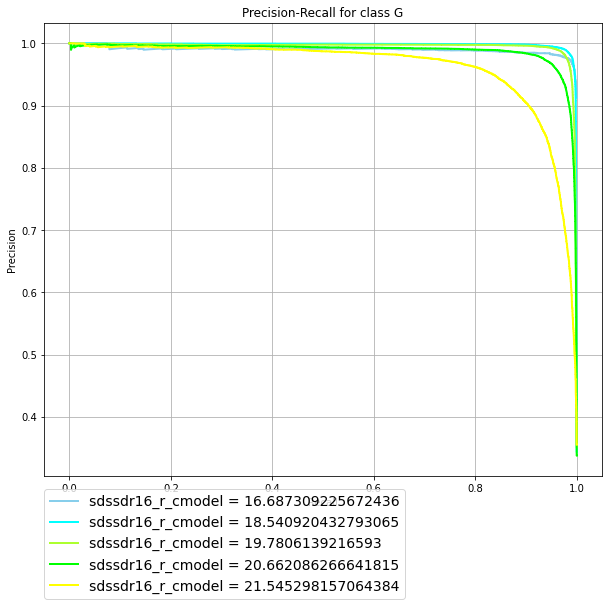

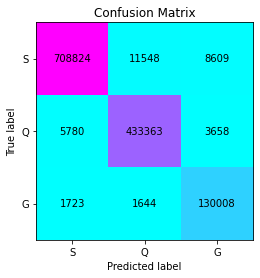

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_big/decals8tr уже существует
decals8tr
100%|██████████| 20/20 [03:16<00:00,  9.80s/it, best loss: -0.9638333333333334]
({'colsample_bytree': 0.626449351989265, 'min_child_samples': 2, 'min_child_weight': 0.54733547360861, 'num_leaves': 43}, <hyperopt.base.Trials object at 0x7ff98dccf290>)
3.468445062637329
100%|██████████| 20/20 [03:39<00:00, 10.98s/it, best loss: -0.9651000000000001]
({'colsample_bytree': 0.3347884840158871, 'min_child_samples': 47, 'min_child_weight': 0.1409134103661745, 'num_leaves': 51}, <hyperopt.base.Trials object at 0x7ff98d5a3f50>)
3.8550286293029785


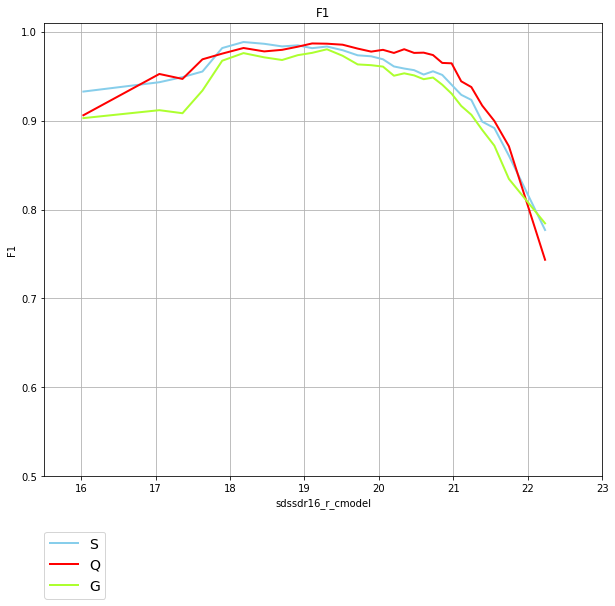

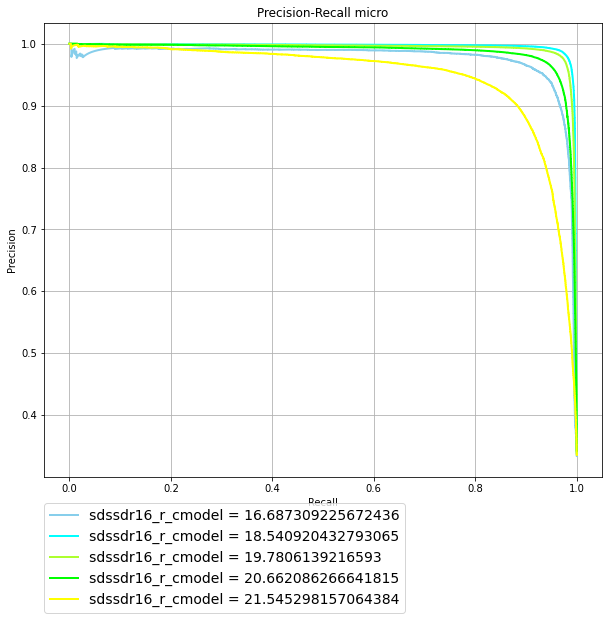

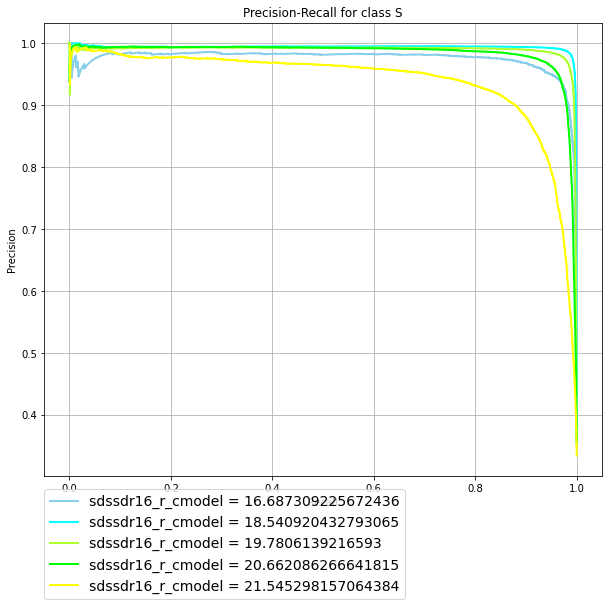

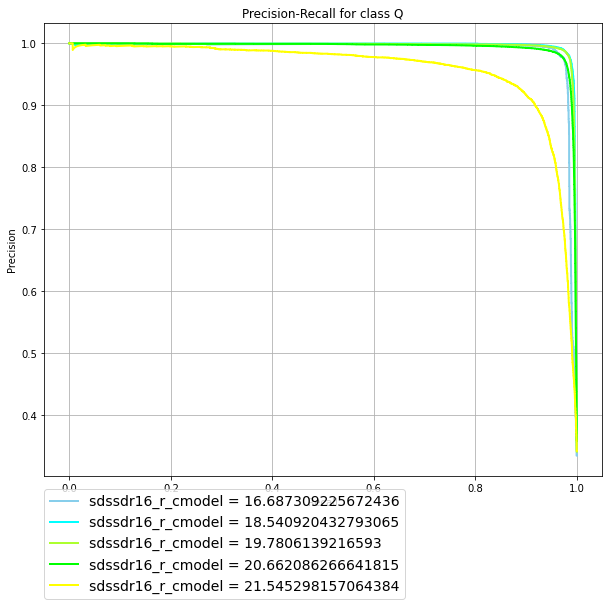

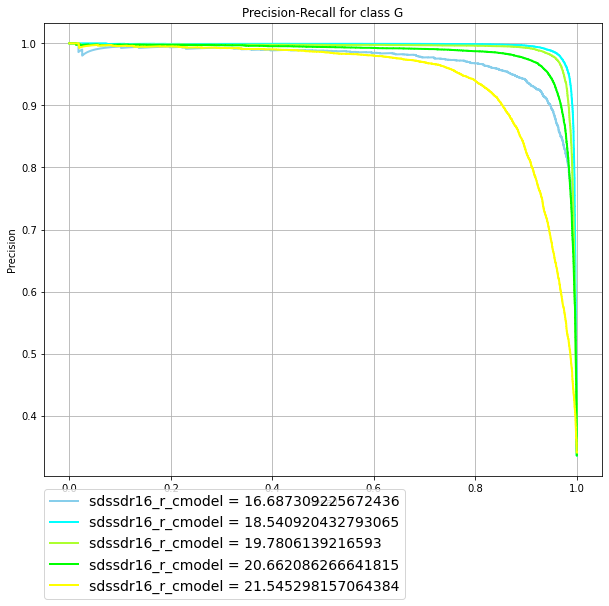

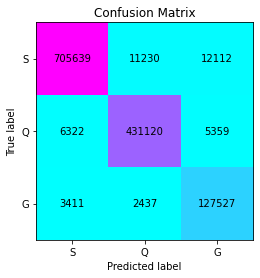

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_big/sdssdr16+psdr2+wise_decals8tr уже существует
sdssdr16+psdr2+wise_decals8tr
100%|██████████| 20/20 [04:15<00:00, 12.78s/it, best loss: -0.9733]
({'colsample_bytree': 0.6452523626271, 'min_child_samples': 27, 'min_child_weight': 0.48785036598006015, 'num_leaves': 18}, <hyperopt.base.Trials object at 0x7ff982048c90>)
5.536208868026733
100%|██████████| 20/20 [03:50<00:00, 11.54s/it, best loss: -0.9746333333333334]
({'colsample_bytree': 0.6614612064757603, 'min_child_samples': 41, 'min_child_weight': 0.9199496380352193, 'num_leaves': 48}, <hyperopt.base.Trials object at 0x7ff96bddd3d0>)
5.547101736068726


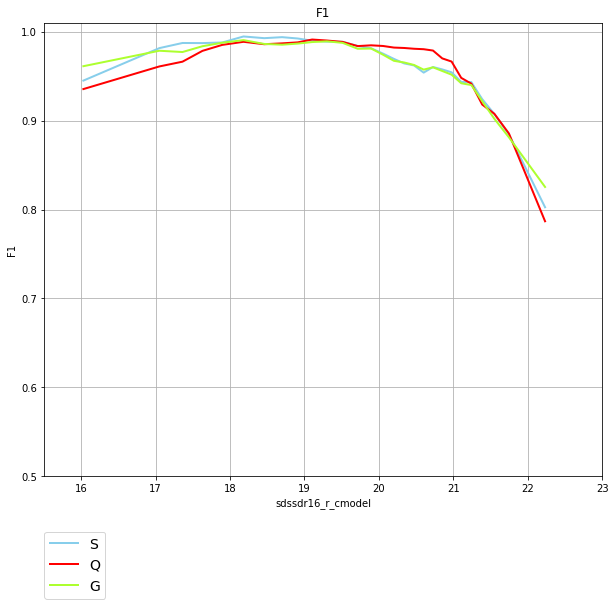

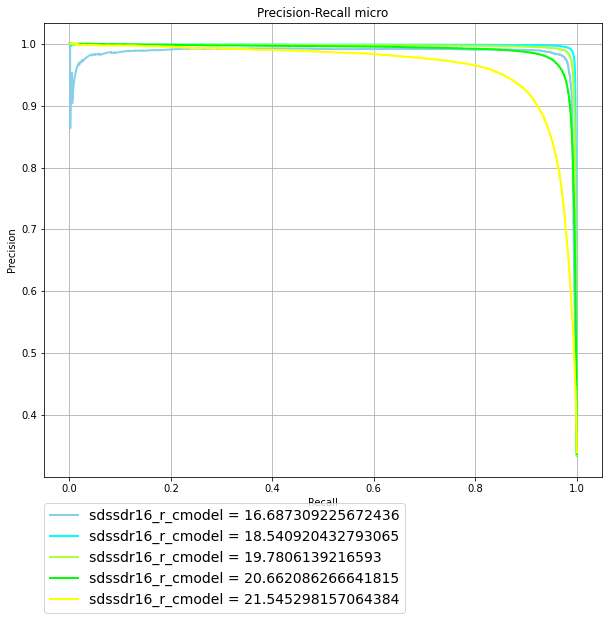

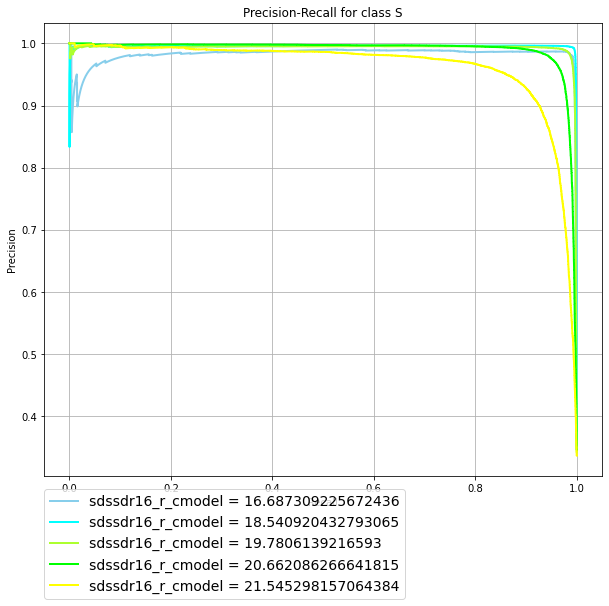

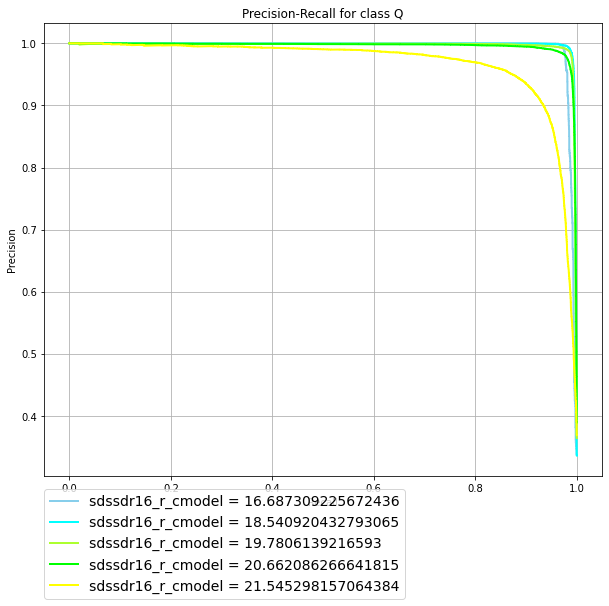

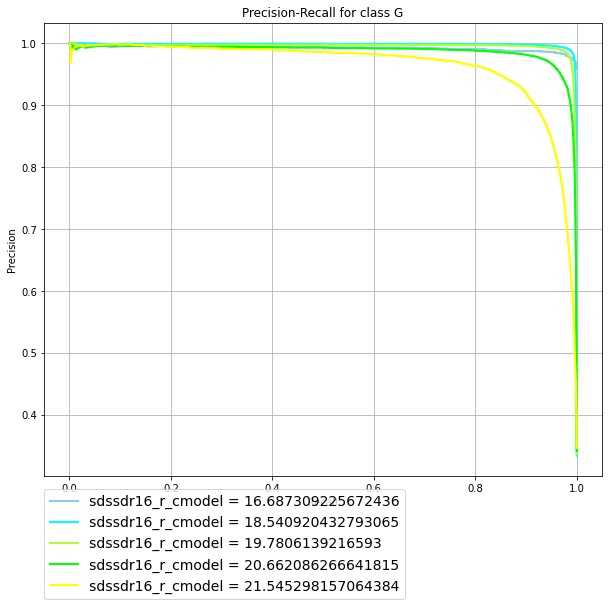

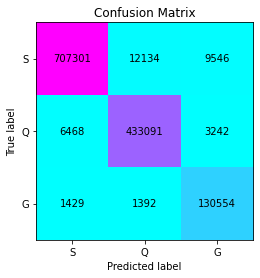

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_big/sdssdr16+psdr2+all_decals8tr уже существует
sdssdr16+psdr2+all_decals8tr
100%|██████████| 20/20 [04:33<00:00, 13.66s/it, best loss: -0.9762666666666666]
({'colsample_bytree': 0.8758757761784663, 'min_child_samples': 47, 'min_child_weight': 0.9294491525361916, 'num_leaves': 9}, <hyperopt.base.Trials object at 0x7ff9a5b19e50>)
7.8945231437683105
100%|██████████| 20/20 [04:20<00:00, 13.01s/it, best loss: -0.9768666666666667]
({'colsample_bytree': 0.37584009262324247, 'min_child_samples': 39, 'min_child_weight': 0.6670438271637195, 'num_leaves': 28}, <hyperopt.base.Trials object at 0x7ff9a2cf8150>)
4.772563934326172


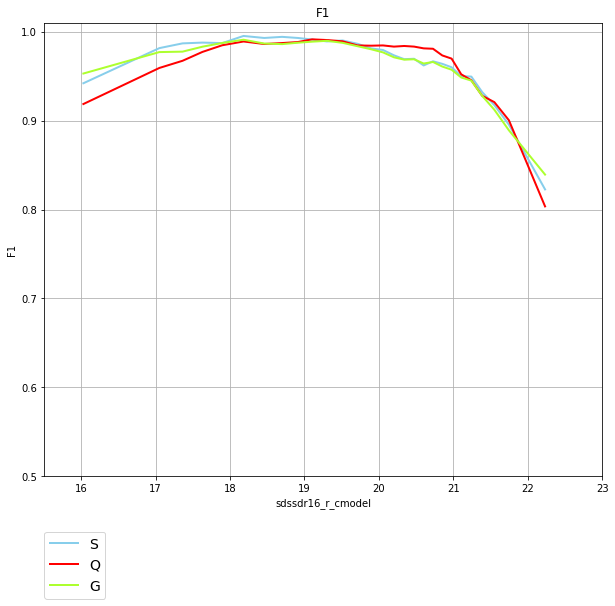

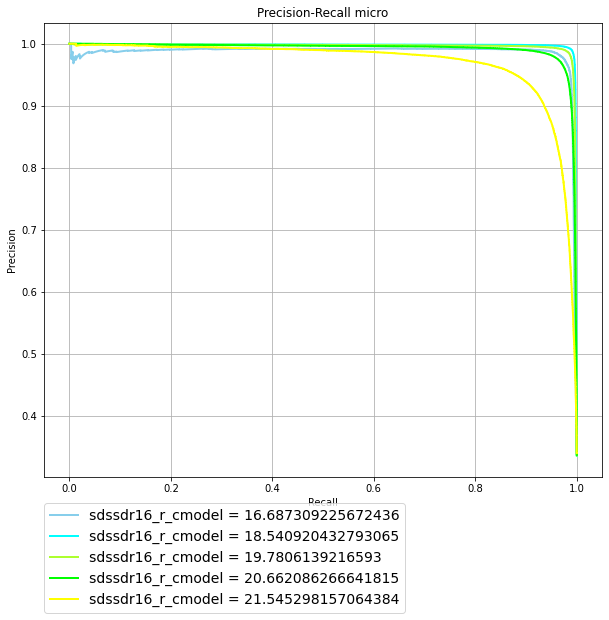

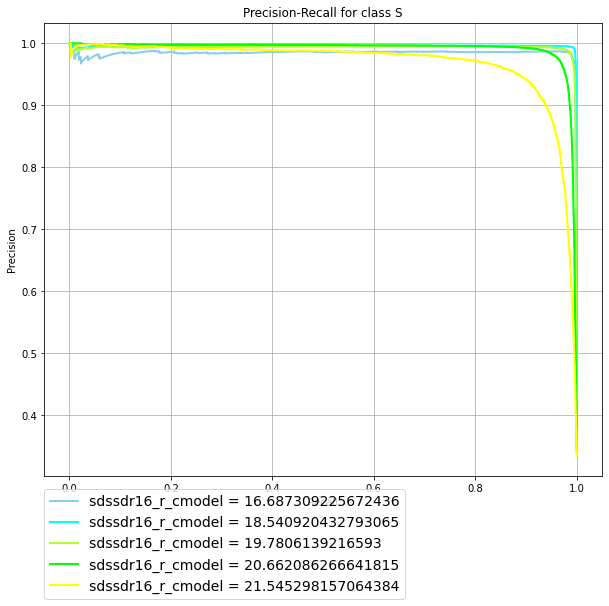

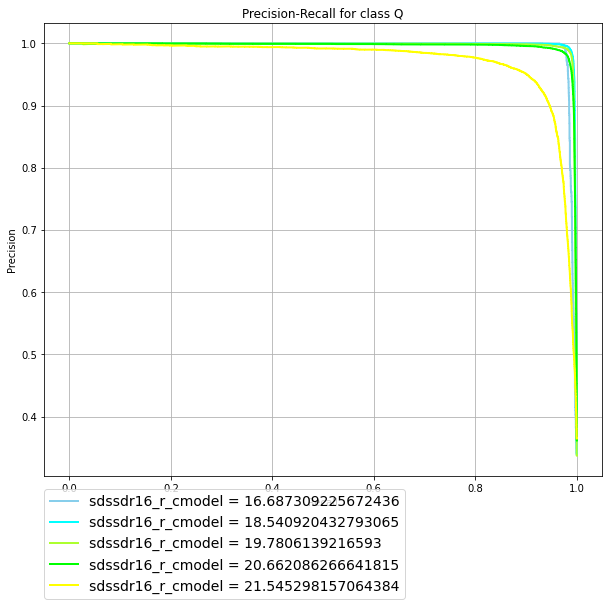

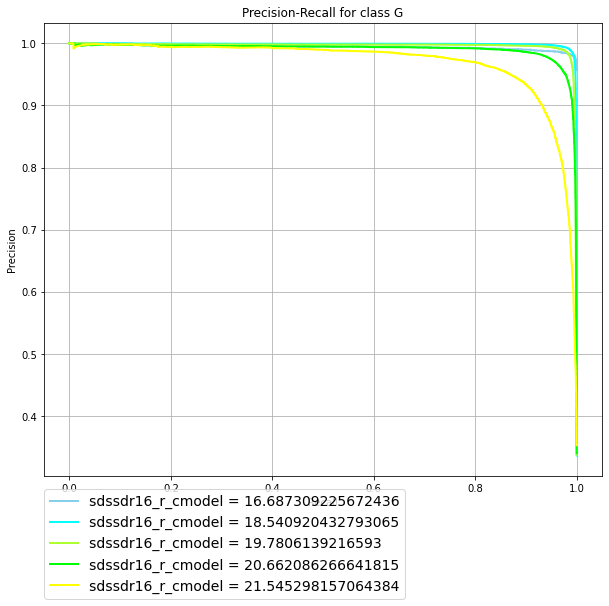

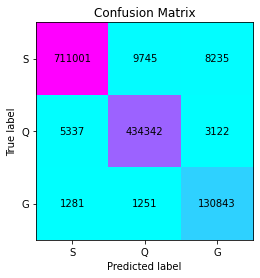

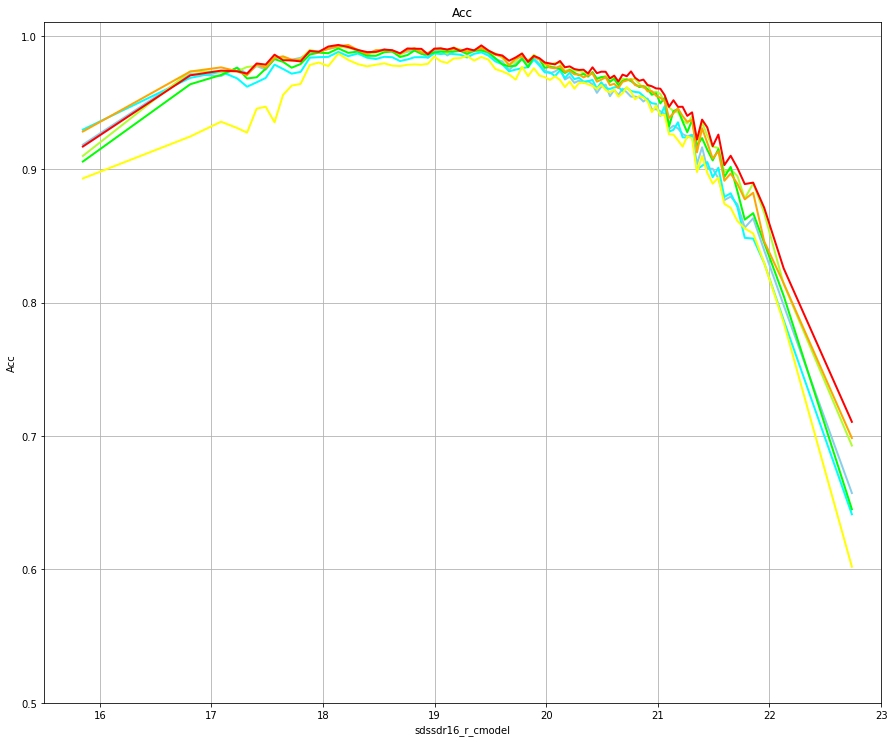

In [ ]:
accuracy = dict()
brightness = dict()

import os
path = "/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_big"

try:
    os.makedirs(path)
except FileExistsError:
  print("Директория %s уже существует" % path) 
except OSError:
    print ("Создать директорию %s не удалось" % path)
    exit()

for overview in f.keys():
  path = f"/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_big/{overview}"
  try:
      os.makedirs(path)
  except FileExistsError:
    print("Директория %s уже существует" % path)
  except OSError:
      print("Создать директорию %s не удалось" % path)
      exit()

  print(overview)

  X1, y1 = df1[[column]+f[overview]].values, df1['class'].values #X1, X2 - выборка из больших данных
  X2, y2 = df2[[column]+f[overview]].values, df2['class'].values


  gb2, robust2 = For_one_gb(X2[:, 1:], y2, X1[:, 1:], y1)
  gb1, robust1 = For_one_gb(X1[:, 1:], y1, X2[:, 1:], y2)
  #print(robust.transform(X1[:, 1:]))

  F1_plot_class(X1, y1, X2, y2, gb1, gb2, robust1, robust2, column, f'{path}/{overview}_gb_big_', N=30)
  Prediction_Recall_plot(X1, y1, X2, y2, gb1, gb2, robust1, robust2, column, f'{path}/{overview}_gb_big_', N=5)
  Confusion_Matrix(X1, y1, X2, y2, gb1, gb2, robust1, robust2, column, f'{path}/{overview}_gb_big_')
  acc, r = choseAcc_2cv(X2, y2, X1, y1, gb1, gb2, 100, robust1, robust2, accuracy_score, lit=100)
  acc = np.array(acc).T
  accuracy[overview] = acc
  brightness[overview] = r

plt.figure(figsize=(15, 15))
lines = []
labels = []
clr = ['skyblue', 'aqua', 'greenyellow', 'lime', 'yellow', 'orange', 'red', 'chocolate', 'darkorange', 'gold', 'springgreen', 'aquamarine',  'lightskyblue']

j=0
for overview in f.keys():
  l, = plt.plot(brightness[overview], accuracy[overview], color=clr[j], lw=2)
  lines.append(l)
  labels.append(f"Model {overview}")
  j+=1

fig = plt.gcf()
fig.subplots_adjust(bottom=0.25)
plt.xlabel(column)
plt.xlim(15.5, 23)
plt.ylim(0.5, 1.01)
plt.ylabel('Acc')
plt.title('Acc')
plt.grid(True)
#plt.legend(lines, labels, loc=(0, -0.32), prop=dict(size=14))
plt.savefig(f'/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_big/gb_big_accuracy.png')
plt.show()

## GB на маленькой тестим на большой

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_big уже существует
Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_big/sdssdr16+wise_decals8tr уже существует
sdssdr16+wise_decals8tr


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator LabelEncoder from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator RobustScaler from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.



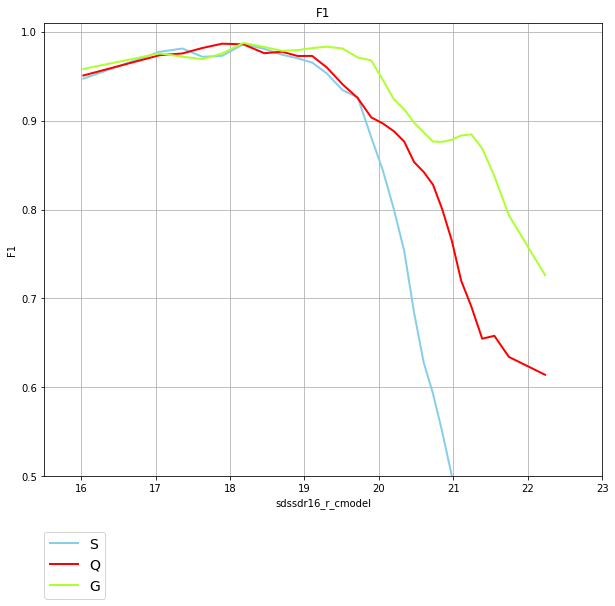

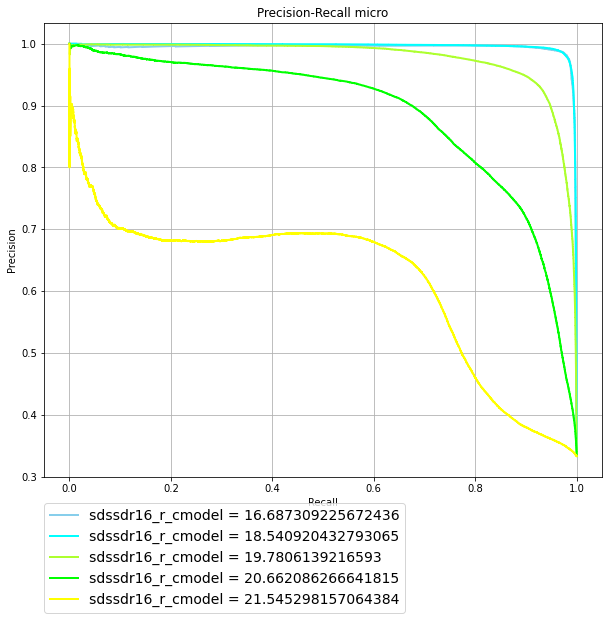

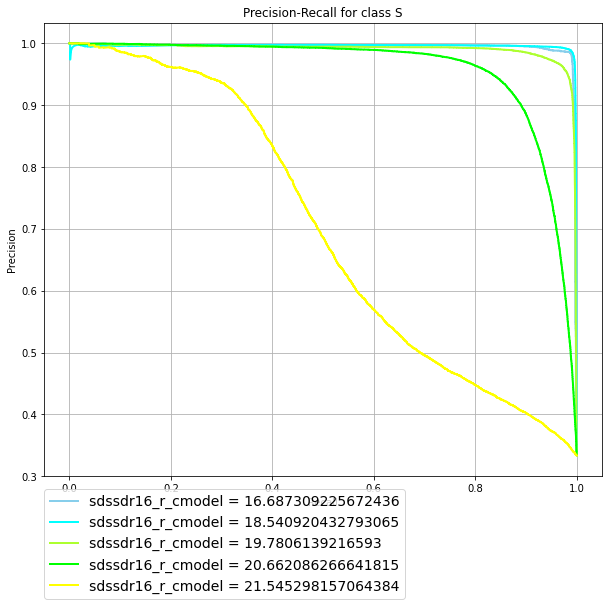

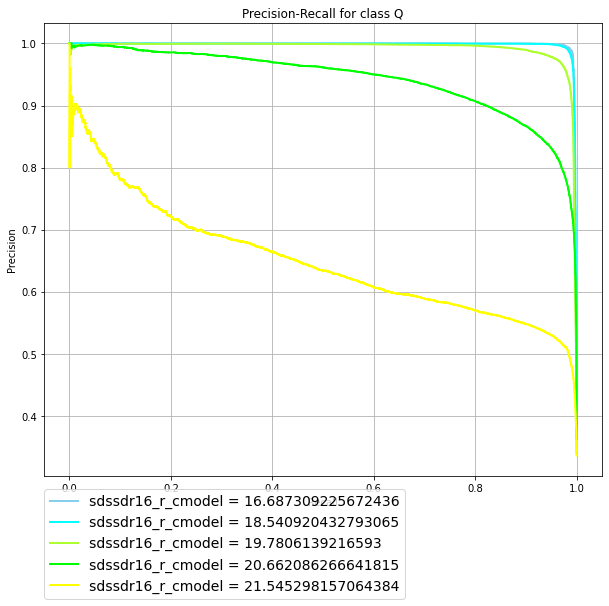

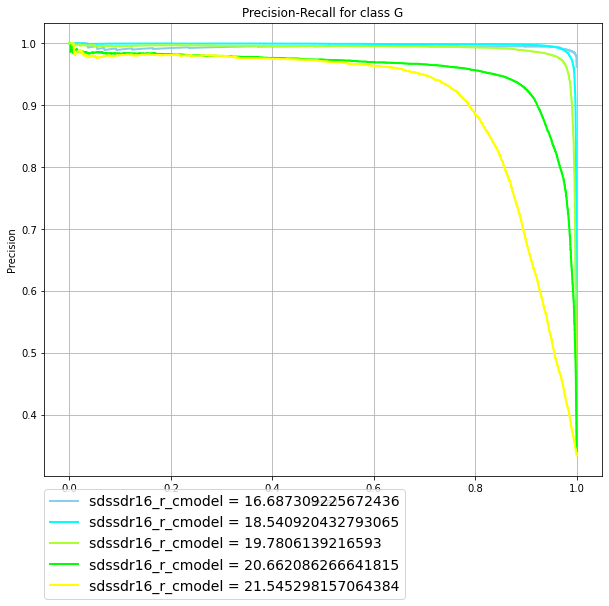

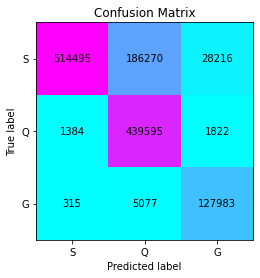

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_big/psdr2+wise_decals8tr уже существует
psdr2+wise_decals8tr


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator LabelEncoder from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator RobustScaler from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.



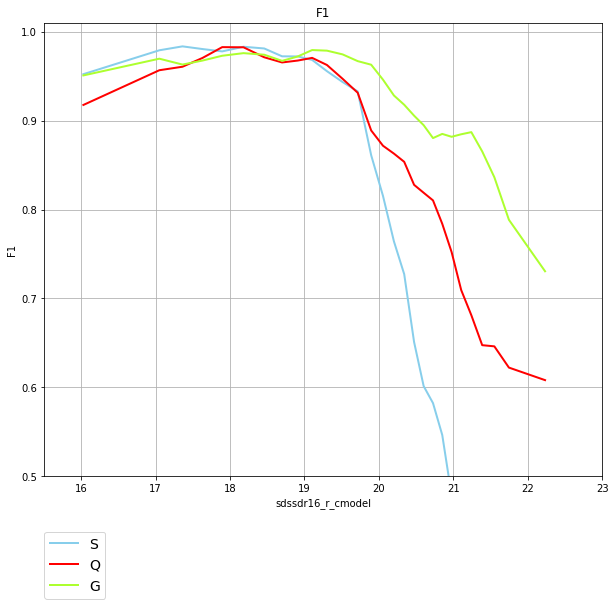

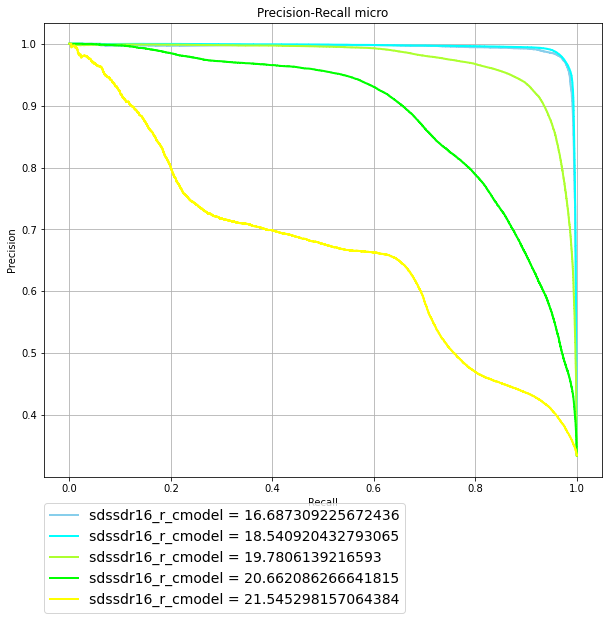

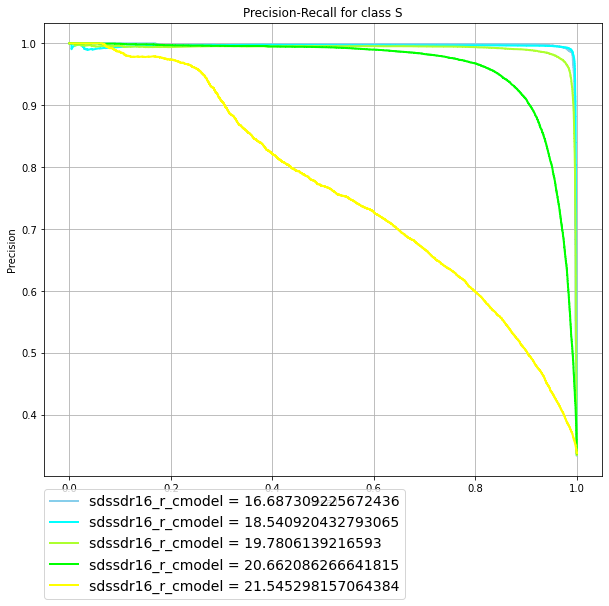

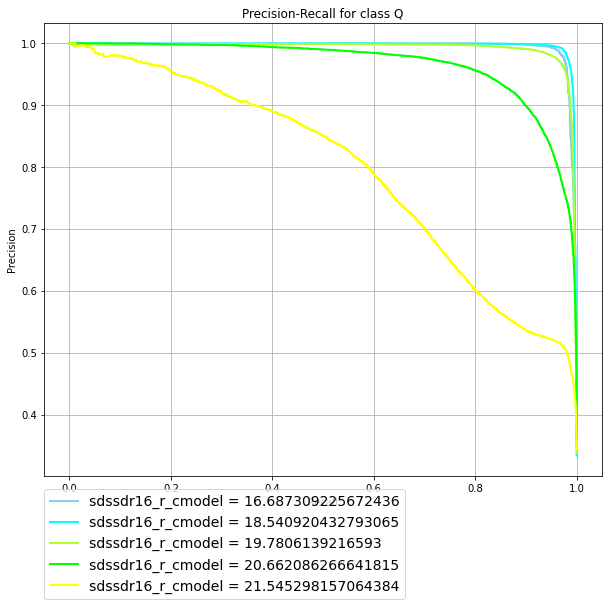

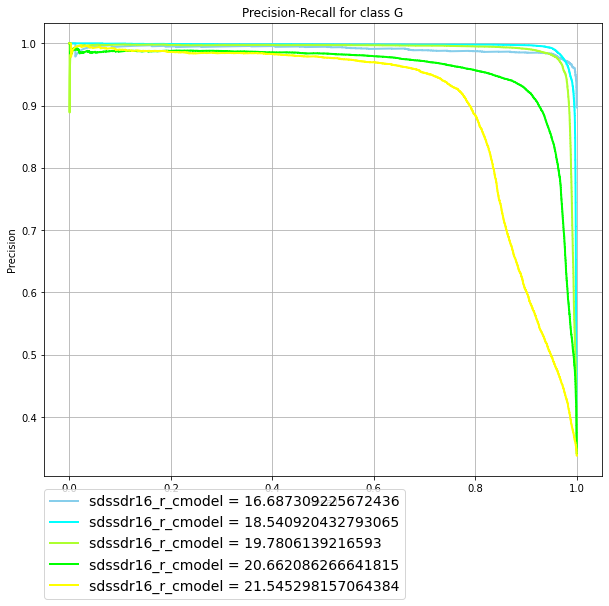

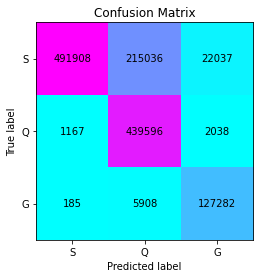

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_big/sdssdr16+all_decals8tr уже существует
sdssdr16+all_decals8tr


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator LabelEncoder from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator RobustScaler from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.



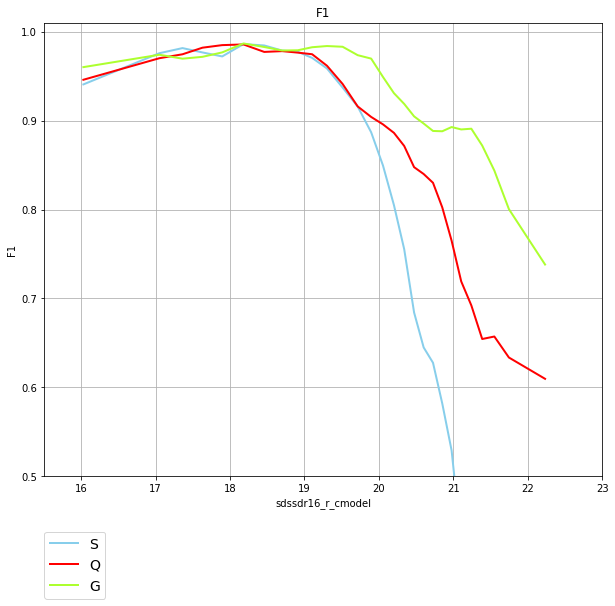

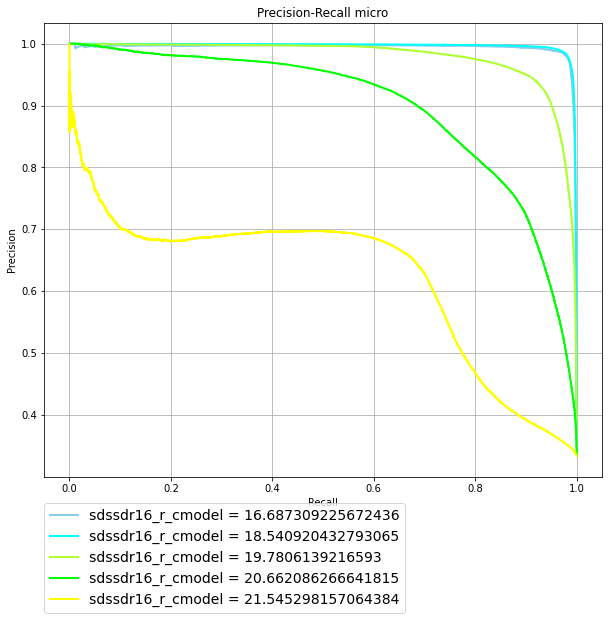

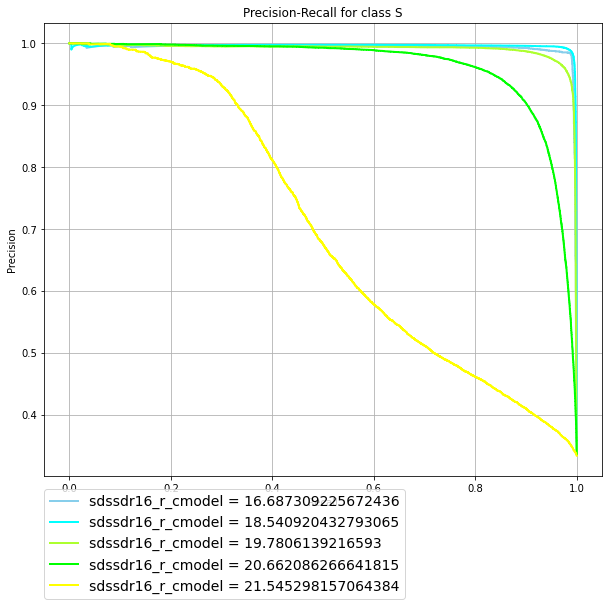

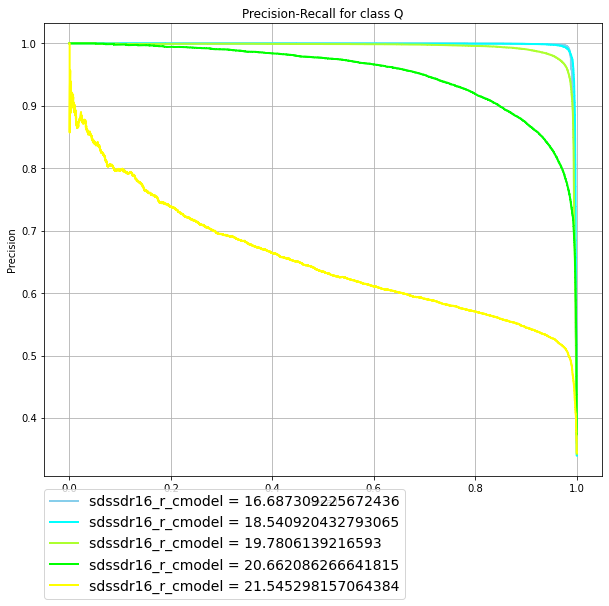

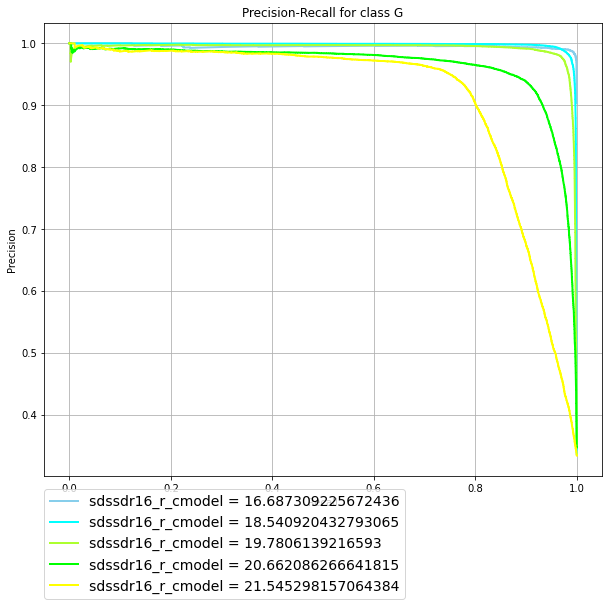

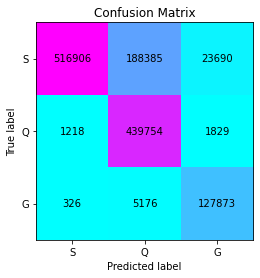

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_big/psdr2+all_decals8tr уже существует
psdr2+all_decals8tr


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator LabelEncoder from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator RobustScaler from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.



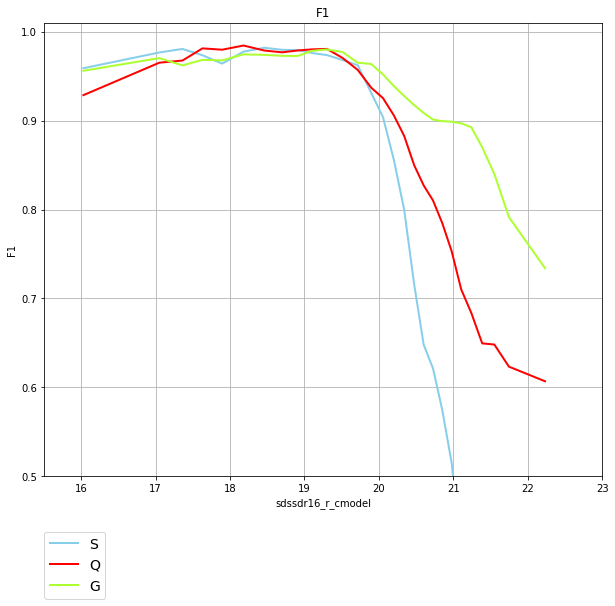

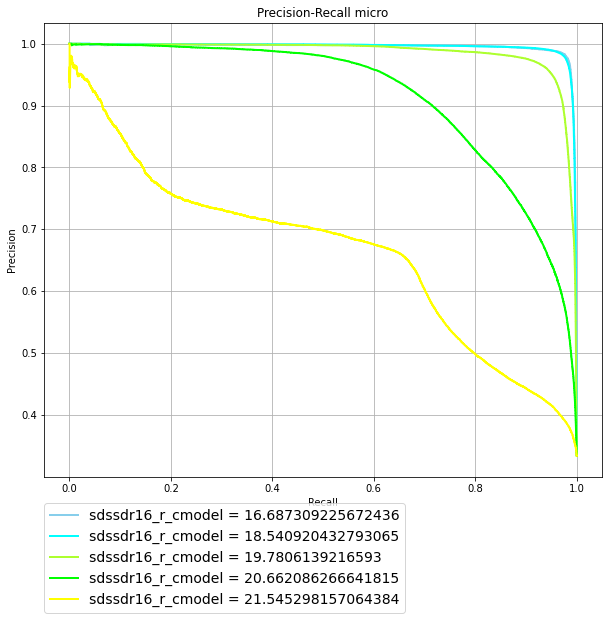

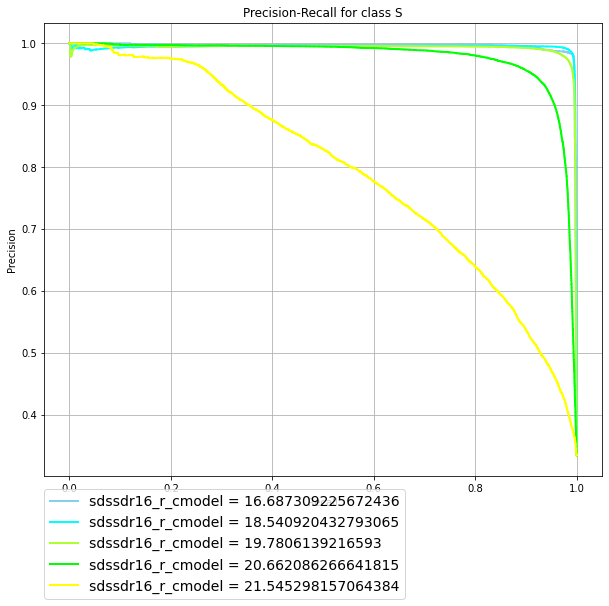

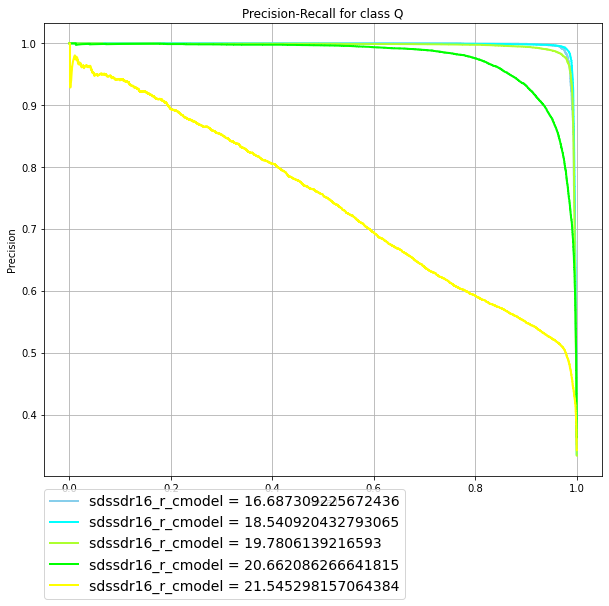

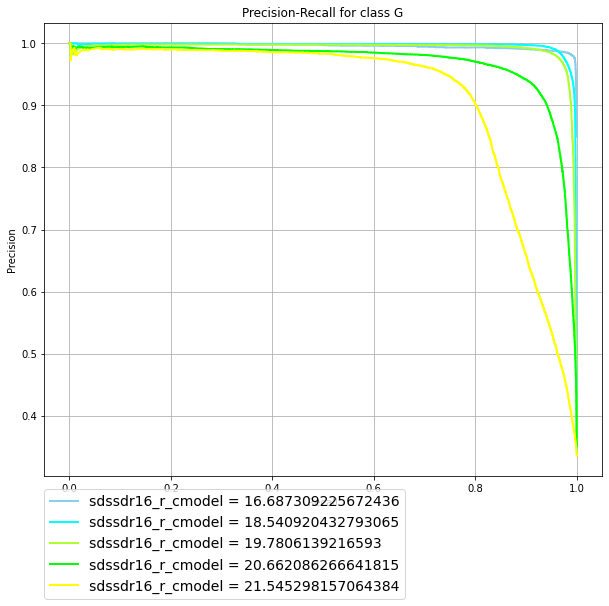

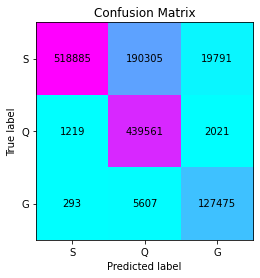

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_big/decals8tr уже существует
decals8tr


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator LabelEncoder from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator RobustScaler from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.



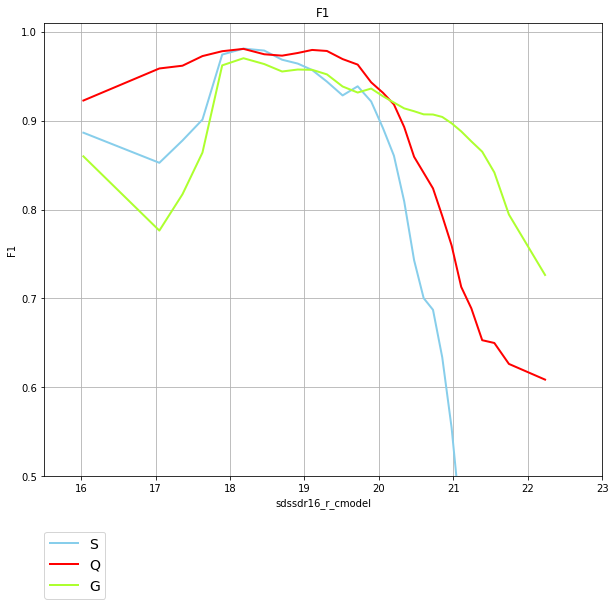

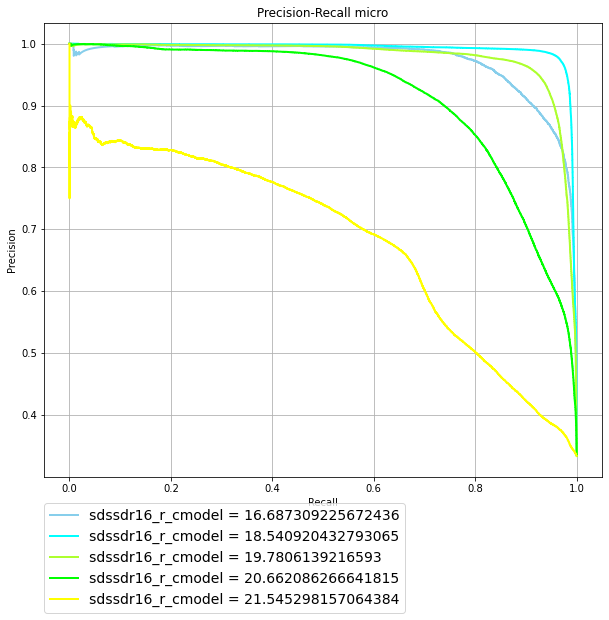

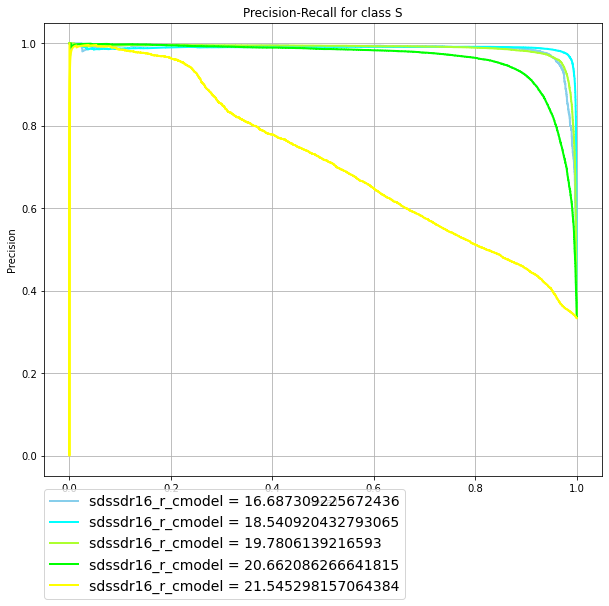

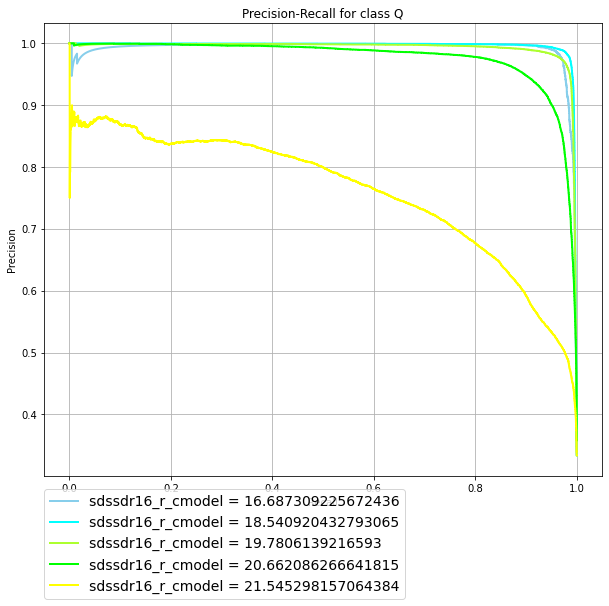

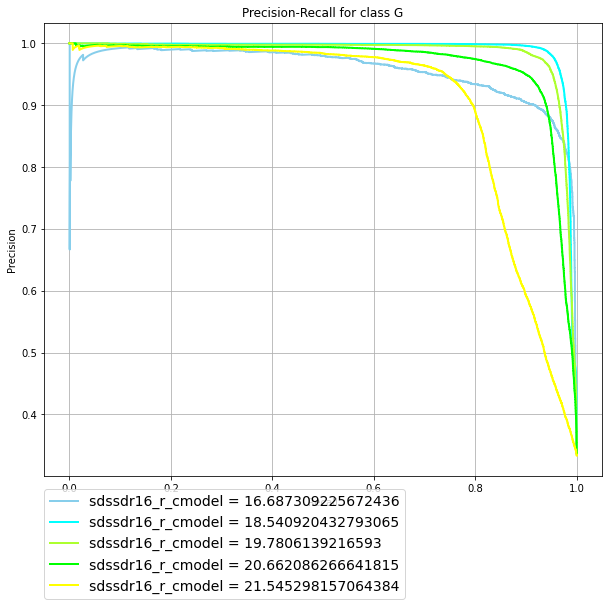

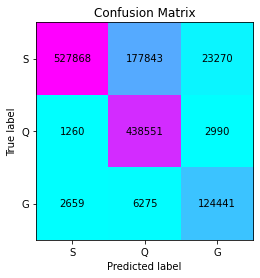

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_big/sdssdr16+psdr2+wise_decals8tr уже существует
sdssdr16+psdr2+wise_decals8tr


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator LabelEncoder from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator RobustScaler from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.



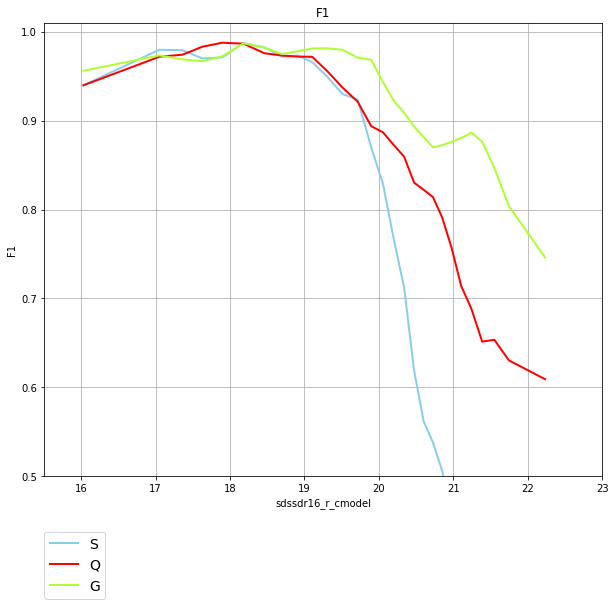

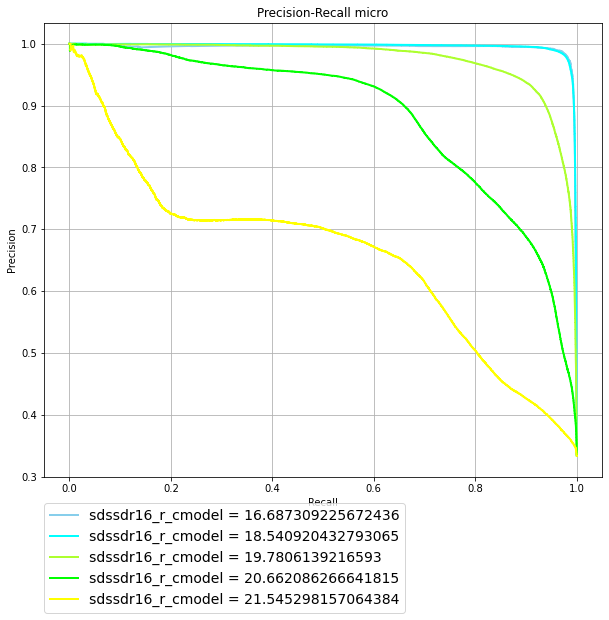

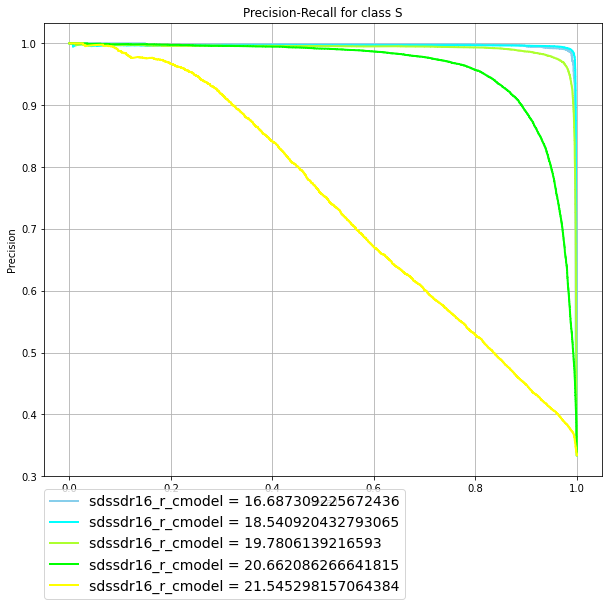

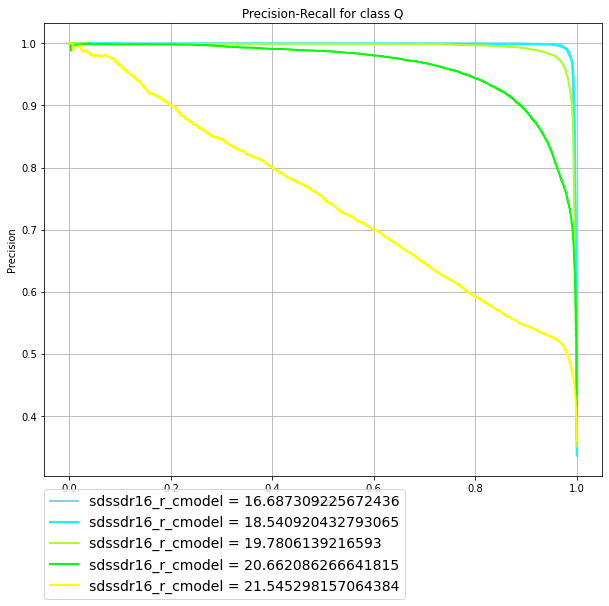

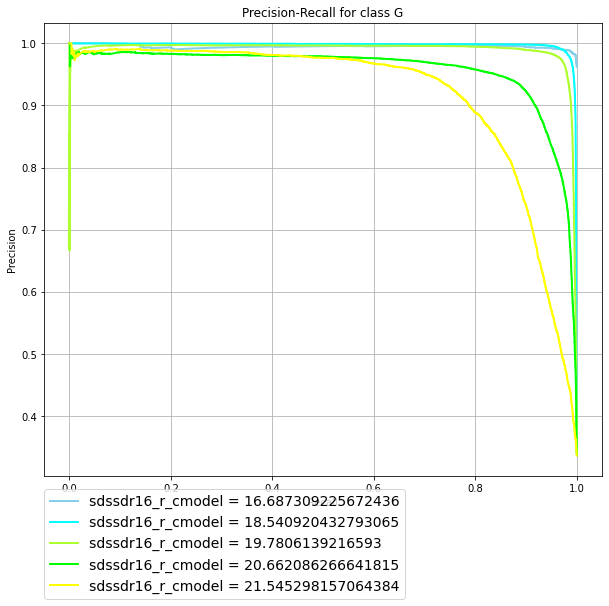

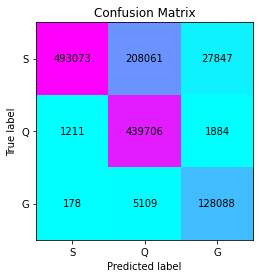

Директория /content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_big/sdssdr16+psdr2+all_decals8tr уже существует
sdssdr16+psdr2+all_decals8tr


/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator LabelEncoder from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:318: UserWarning:

Trying to unpickle estimator RobustScaler from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.



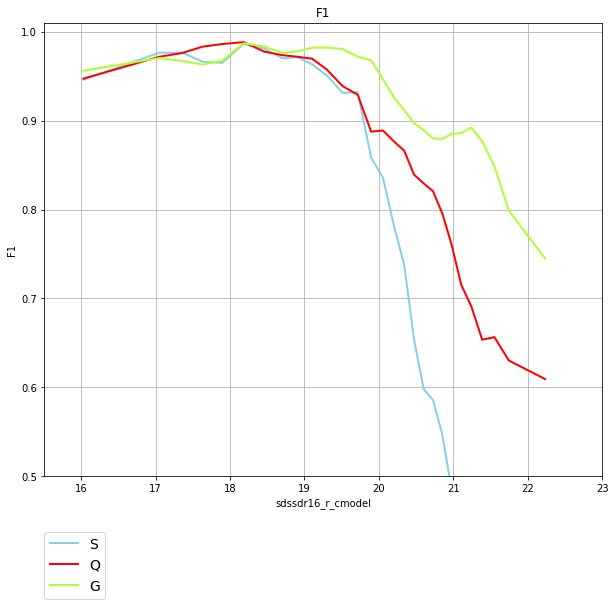

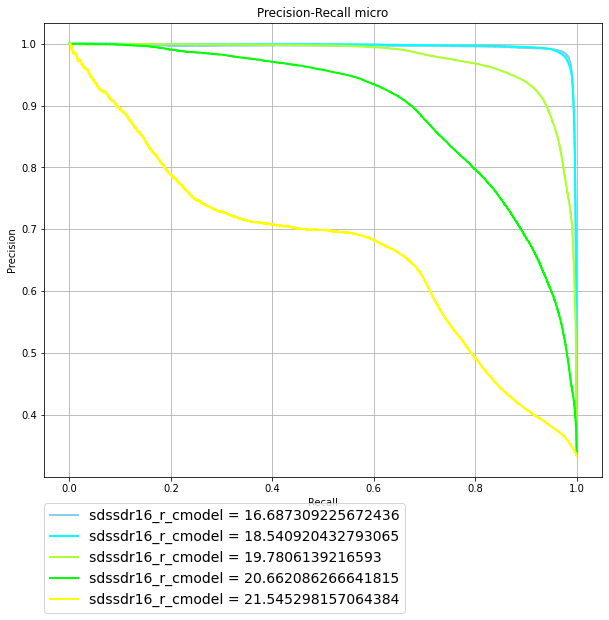

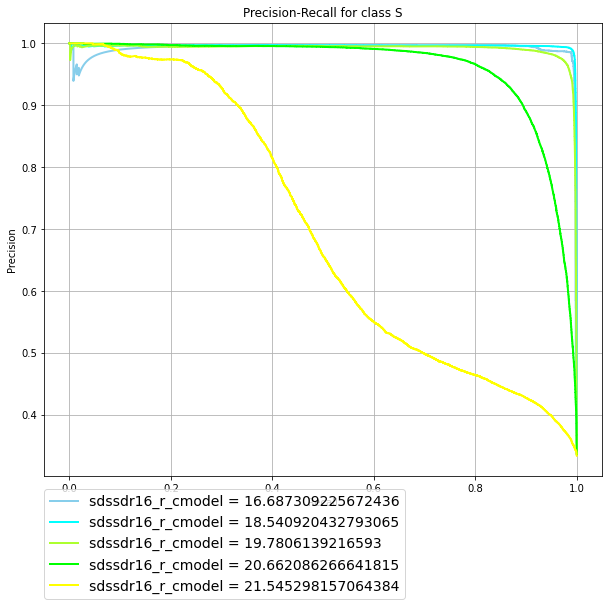

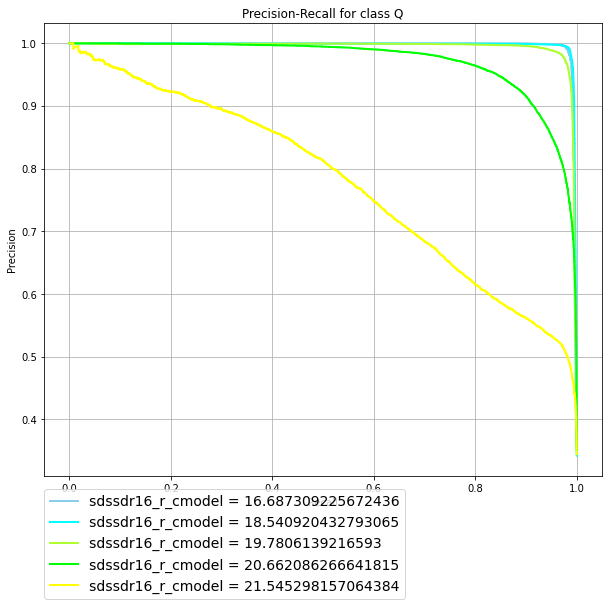

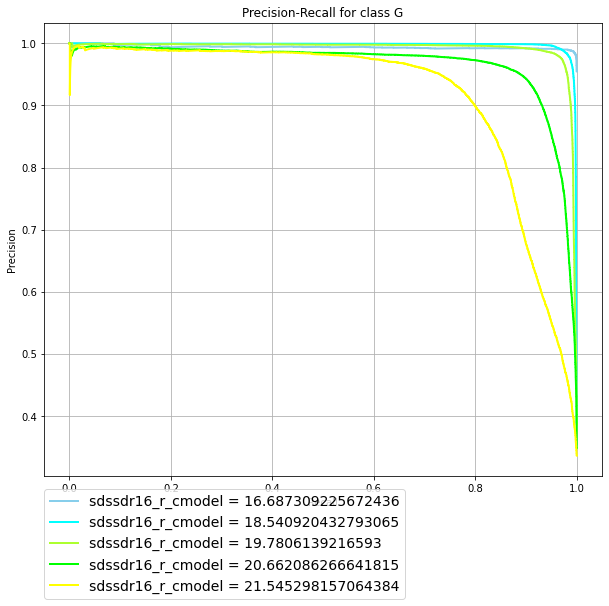

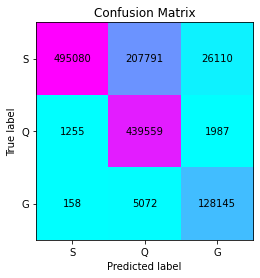

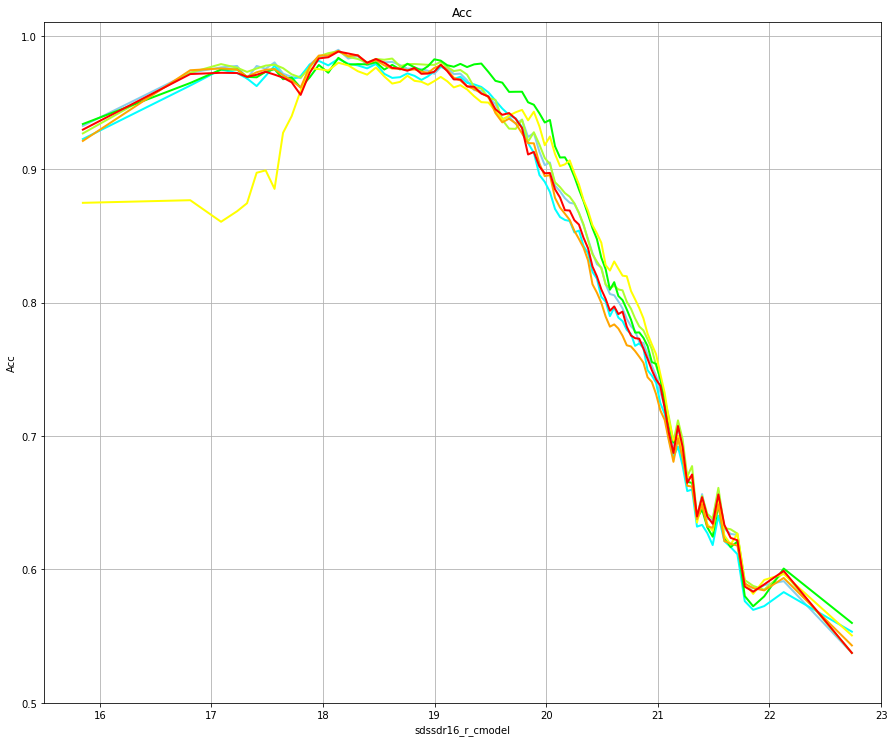

In [ ]:
accuracy = dict()
brightness = dict()

import os
path = "/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_big"

try:
    os.makedirs(path)
except FileExistsError:
  print("Директория %s уже существует" % path) 
except OSError:
    print ("Создать директорию %s не удалось" % path)
    exit()

for overview in f.keys():
  path = f"/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_big/{overview}"
  try:
      os.makedirs(path)
  except FileExistsError:
    print("Директория %s уже существует" % path)
  except OSError:
      print("Создать директорию %s не удалось" % path)
      exit()

  print(overview)

  X1, y1 = df1[[column]+f[overview]].values, df1['class'].values #X1, X2 - выборка из больших данных
  X2, y2 = df2[[column]+f[overview]].values, df2['class'].values


  gb = joblib.load('/content/drive/MyDrive/Научная работа/Data/X-ray/gb/model_'+overview+'.pkl')#были обучены на маленьком датасете 
  robust = joblib.load('/content/drive/MyDrive/Научная работа/Data/X-ray/gb/'+overview+'_robust_for_gb.pkl')
  #print(robust.transform(X1[:, 1:]))

  F1_plot_class(X1, y1, X2, y2, gb, gb, robust, robust, column, f'{path}/{overview}_gb_on_big_', N=30)
  Prediction_Recall_plot(X1, y1, X2, y2, gb, gb, robust, robust, column, f'{path}/{overview}_gb_on_big_', N=5)
  Confusion_Matrix(X1, y1, X2, y2, gb, gb, robust, robust, column, f'{path}/{overview}_gb_on_big_')
  acc, r = choseAcc_2cv(X2, y2, X1, y1, gb, gb, 100, robust, robust, accuracy_score, lit=100)
  acc = np.array(acc).T
  accuracy[overview] = acc
  brightness[overview] = r

plt.figure(figsize=(15, 15))
lines = []
labels = []
clr = ['skyblue', 'aqua', 'greenyellow', 'lime', 'yellow', 'orange', 'red', 'chocolate', 'darkorange', 'gold', 'springgreen', 'aquamarine',  'lightskyblue']

j=0
for overview in f.keys():
  l, = plt.plot(brightness[overview], accuracy[overview], color=clr[j], lw=2)
  lines.append(l)
  labels.append(f"Model {overview}")
  j+=1

fig = plt.gcf()
fig.subplots_adjust(bottom=0.25)
plt.xlabel(column)
plt.xlim(15.5, 23)
plt.ylim(0.5, 1.01)
plt.ylabel('Acc')
plt.title('Acc')
plt.grid(True)
#plt.legend(lines, labels, loc=(0, -0.32), prop=dict(size=14))
plt.savefig(f'/content/drive/MyDrive/Научная работа/Data/X-ray/plots/gb_on_big/gb_on_big_accuracy.png')
plt.show()

# Тест на большой выборке, чтобы судить о точности классификаторов

In [ ]:
gb = joblib.load('/content/drive/MyDrive/Научная работа/Data/X-ray/gb/model_'+overview+'.pkl')
robust = joblib.load('/content/drive/MyDrive/Научная работа/Data/X-ray/gb/'+overview+'_robust_for_gb.pkl')


#Далее

In [ ]:
X1.shape, X2.shape

((8480, 17), (8480, 17))

In [ ]:
X_train.shape

(6336, 65)

In [ ]:
gb = lgb.LGBMClassifier()
t = time()
gb.fit(X_train_norm, y_train, eval_set=[(X_train_norm, y_train), (X_test_norm, y_test)],  **lgb_fit_params)
print(time()-t)

1.1678180694580078


In [ ]:
pred = gb.predict(X_test_norm)
print('Classification Report: \n', classification_report(y_test, pred))
print('Confusion Matrix: \n', confusion_matrix(y_test, pred))
gb_train_acc = accuracy_score(y_train, gb.predict(X_train_norm))
print('Training Score: ', gb_train_acc)
gb_test_acc =  accuracy_score(y_test, pred)
print('Testing Score: ', gb_test_acc)

Classification Report: 
               precision    recall  f1-score   support

           1       0.97      0.96      0.96       116
           2       0.98      0.98      0.98       399
           3       0.98      0.96      0.97       190

    accuracy                           0.97       705
   macro avg       0.97      0.97      0.97       705
weighted avg       0.97      0.97      0.97       705

Confusion Matrix: 
 [[111   4   1]
 [  3 393   3]
 [  1   6 183]]
Training Score:  0.9970012626262627
Testing Score:  0.9744680851063829


In [ ]:
pred = gb.predict(X2_norm)
print('Classification Report: \n', classification_report(y2, pred))
print('Confusion Matrix: \n', confusion_matrix(y2, pred))
gb_train_acc = accuracy_score(y_train, gb.predict(X_train_norm.astype('float')))
print('Training Score: ', gb_train_acc)
gb_test_acc = accuracy_score(y2, pred)
print('Training Score: ', gb_test_acc)

Classification Report: 
               precision    recall  f1-score   support

           1       0.99      0.99      0.99      1152
           2       1.00      1.00      1.00      3989
           3       0.99      0.99      0.99      1900

    accuracy                           0.99      7041
   macro avg       0.99      0.99      0.99      7041
weighted avg       0.99      0.99      0.99      7041

Confusion Matrix: 
 [[1142    7    3]
 [   5 3974   10]
 [   1   11 1888]]
Training Score:  0.9970012626262627
Training Score:  0.9947450646215026


In [ ]:
X_train.shape, X_test.shape

((6340, 65), (706, 65))

In [ ]:
clf = TabNetClassifier(n_d=32, n_a=32,
                       momentum=0.7,
                       optimizer_fn=torch.optim.Adam,
                       optimizer_params=dict(lr=2e-2),
                       scheduler_params={"step_size":20, # how to use learning rate scheduler
                                         "gamma":0.95},
                       scheduler_fn=torch.optim.lr_scheduler.StepLR,

                       mask_type='entmax',
                       
                       **{'gamma': 1.7,
                          'lambda_sparse': 0.001,
                          'n_steps': 5}

)

Device used : cuda


In [ ]:
max_epochs = 300

In [ ]:
X_train.shape

(6336, 65)

In [ ]:
X_test.shape

(705, 65)

In [ ]:
t = time()
clf.fit(
    X_train=X_train, y_train=y_train,
    #X_valid=X_valid, y_valid=y_valid,
    eval_set=[(X_train, y_train), (X_train, y_train)],
    eval_name=['train', 'valid'],
    eval_metric=['logloss','accuracy'],
    max_epochs=max_epochs , patience=50,
    batch_size=512, virtual_batch_size=128,
    #from_unsupervised=unsupervised_model
) 
print(time()-t)

epoch 0  | loss: 0.96442 | train_logloss: 5.35252 | train_accuracy: 0.42551 | valid_logloss: 5.35252 | valid_accuracy: 0.42551 |  0:00:00s
epoch 1  | loss: 0.32988 | train_logloss: 2.74    | train_accuracy: 0.64378 | valid_logloss: 2.74    | valid_accuracy: 0.64378 |  0:00:01s
epoch 2  | loss: 0.27342 | train_logloss: 3.26327 | train_accuracy: 0.41525 | valid_logloss: 3.26327 | valid_accuracy: 0.41525 |  0:00:02s
epoch 3  | loss: 0.2023  | train_logloss: 9.63578 | train_accuracy: 0.34501 | valid_logloss: 9.63578 | valid_accuracy: 0.34501 |  0:00:03s
epoch 4  | loss: 0.19852 | train_logloss: 3.86725 | train_accuracy: 0.41177 | valid_logloss: 3.86725 | valid_accuracy: 0.41177 |  0:00:04s
epoch 5  | loss: 0.16243 | train_logloss: 2.8799  | train_accuracy: 0.65025 | valid_logloss: 2.8799  | valid_accuracy: 0.65025 |  0:00:05s
epoch 6  | loss: 0.18096 | train_logloss: 0.91737 | train_accuracy: 0.79419 | valid_logloss: 0.91737 | valid_accuracy: 0.79419 |  0:00:06s
epoch 7  | loss: 0.15446 | 

In [ ]:
X_test = X_test.astype('float')

In [ ]:
pred = clf.predict(X_test)
print('Classification Report: \n', classification_report(y_test, pred))
print('Confusion Matrix: \n', confusion_matrix(y_test, pred))
clf_train_acc = accuracy_score(y_train, clf.predict(X_train.astype('float')))
print('Training Score: ', clf_train_acc)
clf_test_acc = accuracy_score(y_test, pred)
print('Testing Score: ', clf_test_acc)

Classification Report: 
               precision    recall  f1-score   support

           1       0.99      0.96      0.97       116
           2       0.98      0.98      0.98       399
           3       0.95      0.96      0.95       190

    accuracy                           0.97       705
   macro avg       0.97      0.96      0.97       705
weighted avg       0.97      0.97      0.97       705

Confusion Matrix: 
 [[111   2   3]
 [  1 391   7]
 [  0   8 182]]
Training Score:  0.9924242424242424
Testing Score:  0.9702127659574468


In [ ]:
pred = clf.predict(X2)
print('Classification Report: \n', classification_report(y2, pred))
print('Confusion Matrix: \n', confusion_matrix(y2, pred))
clf_train_acc = accuracy_score(y_train, clf.predict(X_train.astype('float')))
print('Training Score: ', clf_train_acc)
clf_test_acc = accuracy_score(y2, pred)
print('Training Score: ', clf_test_acc)

Classification Report: 
               precision    recall  f1-score   support

           1       1.00      0.99      0.99      1152
           2       0.99      0.99      0.99      3989
           3       0.98      0.99      0.99      1900

    accuracy                           0.99      7041
   macro avg       0.99      0.99      0.99      7041
weighted avg       0.99      0.99      0.99      7041

Confusion Matrix: 
 [[1139    7    6]
 [   5 3954   30]
 [   0   21 1879]]
Training Score:  0.9924242424242424
Training Score:  0.9902002556455048


In [ ]:
lgb_fit_params = {
    'early_stopping_rounds': 20,
    'verbose': False
}
lgb_class_params = {
    'min_child_samples':np.random.randint(1, 50, size = 5),
    'colsample_bytree': np.random.uniform(0.1, 0.9, size = 5),
    'num_leaves' :      np.random.randint(10, 100, size = 5),
    'min_child_weight': np.random.uniform(0.001, 0.99, size = 5),
}

kf = KFold(n_splits=3)

LGBM = RandomizedSearchCV(LGBMClassifier(learning_rate=0.001, n_estimators=300), lgb_class_params, random_state=0, cv=kf)
search = LGBM.fit(X_train_norm, y_train)

In [ ]:
X_test.shape

(8669, 26)

In [ ]:
len(gb.feature_importances_)

26

In [ ]:
np.where(gb.feature_importances_ == 366)[0].tolist()

[]

In [ ]:
[columns_sdss[i] for i in np.where(gb.feature_importances_ == 930)[0].tolist()]

['sdssdr16_u-z_psf']

In [ ]:
columns_not_ls = [i for i in columns_not_L if 'ls' not in i]

In [ ]:
columns_not_Err =  [i for i in columns if 'Err' not in i]

In [ ]:
columns_not_Ivar = [i for i in columns_not_Err if 'Ivar' not in i]

In [ ]:
columns_not_w = [i for i in columns_not_Ivar if 'w' not in i]

In [ ]:
columns_sdss = [i for i in columns_not_Ivar if 'sdss' in i] + ['LabelQ', 'LabelG', 'LabelS', 'Label']

In [ ]:
columns_not_z = [i for i in columns_sdss if 'z' not in i]

In [ ]:
columns_not_z

['sdss_cModelFlux_u',
 'sdss_cModelFlux_g',
 'sdss_cModelFlux_r',
 'sdss_cModelFlux_i',
 'sdss_psfFlux_u',
 'sdss_psfFlux_g',
 'sdss_psfFlux_r',
 'sdss_psfFlux_i',
 'sdssdr16_u_psf',
 'sdssdr16_g_psf',
 'sdssdr16_r_psf',
 'sdssdr16_i_psf',
 'sdssdr16_u_cmodel',
 'sdssdr16_g_cmodel',
 'sdssdr16_r_cmodel',
 'sdssdr16_i_cmodel',
 'sdssdr16_u-g_psf',
 'sdssdr16_u-r_psf',
 'sdssdr16_u-i_psf',
 'sdssdr16_u_psf-cmodel',
 'sdssdr16_g-r_psf',
 'sdssdr16_g-i_psf',
 'sdssdr16_g_psf-cmodel',
 'sdssdr16_r-i_psf',
 'sdssdr16_r_psf-cmodel',
 'sdssdr16_i_psf-cmodel',
 'LabelQ',
 'LabelG',
 'LabelS',
 'Label']